# LLM Assistance Disclaimer

Parts of this code were developed with assistance from Large Language Models (specifically GitHub Copilot).
The models helped with implementation details, code structure, and documentation.
While the core ideas and algorithms are based on established research, the LLM assistance
improved code/documentation quality.

## Imports and Setup

In [1]:
# Core imports and configuration
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, ConcatDataset, Subset, TensorDataset
from tqdm import tqdm

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision.utils import make_grid
import torchvision.transforms.functional as F

# MedMNIST
import medmnist
from medmnist import INFO, Evaluator

# Additional imports for DCGAN and FID
import torch.nn.functional as F
from scipy import linalg
from torchvision.models import inception_v3
import random
from sklearn.model_selection import ParameterGrid

import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

# Limitar GPU usage to 70% 
if torch.cuda.is_available():
    torch.cuda.set_per_process_memory_fraction(0.7)

# Configuration
DATA_FLAG = 'bloodmnist'
BATCH_SIZE = 128
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Initial seed for hyperparameter tuning
INITIAL_SEED = 42
set_seed(INITIAL_SEED)

print(f"MedMNIST v{medmnist.__version__} @ {medmnist.HOMEPAGE}")
print(f"Using device: {DEVICE}")

MedMNIST v3.0.2 @ https://github.com/MedMNIST/MedMNIST/
Using device: cuda


## Data Loading and Preprocessing

Dataset: bloodmnist
Task: multi-class
Number of channels: 3
Number of classes: 8
Image dimensions: 28x28x3

Cell Types:
  0: Basophil
  1: Eosinophil
  2: Erythroblast
  3: Immature Granulocyte
  4: Lymphocyte
  5: Monocyte
  6: Neutrophil
  7: Platelet
Using downloaded and verified file: <HOME>\.medmnist\bloodmnist.npz
Using downloaded and verified file: <HOME>\.medmnist\bloodmnist.npz
Using downloaded and verified file: <HOME>\.medmnist\bloodmnist.npz
Train set size: 11959
Validation set size: 1712
Test set size: 3421
Total dataset size: 17092
Number of batches: 134
Sample batch shape: torch.Size([128, 3, 28, 28])
Data range: [-1.00, 1.00]


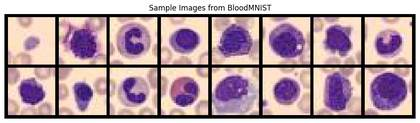

Sampling real data points for evaluation...


In [2]:
# Get dataset information
info = INFO[DATA_FLAG]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])

# Blood cell type mapping
CELL_TYPES = {
    0: 'Basophil',
    1: 'Eosinophil', 
    2: 'Erythroblast',
    3: 'Immature Granulocyte',
    4: 'Lymphocyte',
    5: 'Monocyte',
    6: 'Neutrophil',
    7: 'Platelet'
}

print(f"Dataset: {DATA_FLAG}")
print(f"Task: {task}")
print(f"Number of channels: {n_channels}")
print(f"Number of classes: {n_classes}")
print(f"Image dimensions: 28x28x{n_channels}")
print("\nCell Types:")
for idx, cell_type in CELL_TYPES.items():
    print(f"  {idx}: {cell_type}")

# Data preprocessing transforms
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1, 1] range
])

# Load dataset splits
DataClass = getattr(medmnist, info['python_class'])

train_dataset = DataClass(split='train', transform=data_transform, download=True)
val_dataset = DataClass(split='val', transform=data_transform, download=True)
test_dataset = DataClass(split='test', transform=data_transform, download=True)

# Combine all splits for generative modeling
full_dataset = ConcatDataset([train_dataset, val_dataset, test_dataset])

# Create dataloader
dataloader = DataLoader(
    full_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
    num_workers=4,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"Train set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Total dataset size: {len(full_dataset)}")
print(f"Number of batches: {len(dataloader)}")

# Sample batch for visualization
sample_batch, _ = next(iter(dataloader))
print(f"Sample batch shape: {sample_batch.shape}")
print(f"Data range: [{sample_batch.min():.2f}, {sample_batch.max():.2f}]")

# Visualize some samples
plt.figure(figsize=(12, 6))
grid = make_grid(sample_batch[:16], nrow=8, normalize=True)
plt.imshow(grid.permute(1, 2, 0))
plt.title('Sample Images from BloodMNIST')
plt.axis('off')
plt.show()

# Sample real data for evaluation
def sample_real_data(dataset, n_samples=10000, seed=42):
    """Sample n_samples random data points from the dataset."""
    np.random.seed(seed)
    indices = np.random.choice(len(dataset), n_samples, replace=False)
    sampler = data.SubsetRandomSampler(indices)
    loader = data.DataLoader(
        dataset, 
        batch_size=n_samples,
        sampler=sampler,
        num_workers=4,
        pin_memory=True if torch.cuda.is_available() else False
    )
    # Get all sampled data in one batch
    data_iter = iter(loader)
    images, _ = next(data_iter)
    return images

print("Sampling real data points for evaluation...")
real_samples = sample_real_data(full_dataset, n_samples=10000, seed=INITIAL_SEED)
real_samples = real_samples.to(DEVICE)

### FID Score Implementation

In [ ]:
# Import necessary libraries
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import inception_v3
from scipy import linalg

# Define a feature extractor based on InceptionV3
class InceptionV3Features(nn.Module):
    def __init__(self):
        super(InceptionV3Features, self).__init__()
        
        # Load pre-trained InceptionV3 model
        inception = inception_v3(pretrained=True)
        
        # We only keep the convolutional feature extraction part
        self.block1 = nn.Sequential(
            inception.Conv2d_1a_3x3, inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.block2 = nn.Sequential(
            inception.Conv2d_3b_1x1, inception.Conv2d_4a_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.block3 = nn.Sequential(
            inception.Mixed_5b, inception.Mixed_5c, inception.Mixed_5d,
            inception.Mixed_6a, inception.Mixed_6b, inception.Mixed_6c,
            inception.Mixed_6d, inception.Mixed_6e
        )
        self.block4 = nn.Sequential(
            inception.Mixed_7a, inception.Mixed_7b, inception.Mixed_7c,
            nn.AdaptiveAvgPool2d(output_size=(1, 1))  # Final global average pooling
        )

    def forward(self, x):
        # Pass input through the convolutional blocks
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)

        # Flatten the output
        return x.view(x.size(0), -1)

# Compute mean and covariance of activations from InceptionV3
def calculate_activation_statistics(images, model, batch_size=128, dims=2048):
    """
    Calculate the mean and covariance of InceptionV3 features for a given image set.
    """
    model.eval()
    act = np.empty((len(images), dims))

    # Compute features in batches to avoid memory overflow
    n_batches = len(images) // batch_size + 1
    for i in range(n_batches):
        start = i * batch_size
        end = min(len(images), start + batch_size)
        if start >= end:
            break

        batch = images[start:end].clone()
        
        # Resize images to match InceptionV3 input (299x299)
        batch = F.interpolate(batch, size=(299, 299), mode='bilinear', align_corners=False)

        with torch.no_grad():
            pred = model(batch.to(DEVICE))

        # Store activations for this batch
        pred = pred.cpu().numpy()
        act[start:end] = pred

    # Compute mean and covariance matrix
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

# Compute Frechet Distance between two multivariate Gaussians
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """
    Compute Frechet Distance (FID metric) between two Gaussian distributions.
    Includes numerical stability fixes to avoid issues with NaNs or Infs.
    """
    mu1, mu2 = np.atleast_1d(mu1), np.atleast_1d(mu2)
    sigma1, sigma2 = np.atleast_2d(sigma1), np.atleast_2d(sigma2)

    # Check for numerical errors in input
    if not (np.isfinite(mu1).all() and np.isfinite(mu2).all() and 
            np.isfinite(sigma1).all() and np.isfinite(sigma2).all()):
        print("WARNING: Input to FID calculation contains NaN or Inf.")
        mu1 = np.nan_to_num(mu1)
        mu2 = np.nan_to_num(mu2)
        sigma1 = np.nan_to_num(sigma1)
        sigma2 = np.nan_to_num(sigma2)

    diff = mu1 - mu2

    # Add small regularization to avoid singular matrices
    offset = np.eye(sigma1.shape[0]) * eps
    sigma1 += offset
    sigma2 += offset

    try:
        # Compute square root of the product of covariances
        covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    except ValueError as e:
        print(f"FID calculation error: {e}")
        offset = np.eye(sigma1.shape[0]) * (eps * 10)
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # In case of NaNs or complex numbers
    if not np.isfinite(covmean).all():
        print("FID calculation produced invalid covmean, adding regularization")
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Remove imaginary parts due to numerical error
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            print(f"Imaginary component in covmean: {m}")
        covmean = covmean.real

    # Compute final FID score
    tr_covmean = np.trace(covmean)
    return (diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean)

# Wrapper function to compute FID given two image sets
def compute_fid(real_images, fake_images):
    """
    Compute Fréchet Inception Distance (FID) between real and generated images.
    """
    inception_model = InceptionV3Features().to(DEVICE)
    inception_model.eval()

    # Get activation statistics for both sets
    mu_real, sigma_real = calculate_activation_statistics(real_images, inception_model)
    mu_fake, sigma_fake = calculate_activation_statistics(fake_images, inception_model)

    # Return final FID score
    fid_value = calculate_frechet_distance(mu_real, sigma_real, mu_fake, sigma_fake)
    return fid_value

### Sample Real Data Points

In [ ]:
def sample_real_data(dataset, n_samples=10000, seed=42):
    """
    Randomly sample a subset of real images from the full dataset.
    
    Parameters:
        dataset (Dataset): The full dataset to sample from.
        n_samples (int): Number of samples to extract.
        seed (int): Random seed for reproducibility.
    
    Returns:
        Tensor: A batch of real images with shape (n_samples, C, H, W).
    """
    # Set the random seed to ensure reproducibility
    np.random.seed(seed)
    
    # Randomly select unique indices from the dataset
    indices = np.random.choice(len(dataset), n_samples, replace=False)
    
    # Use a sampler to extract only the selected subset
    sampler = data.SubsetRandomSampler(indices)
    
    # Create a DataLoader to fetch the sampled data in one batch
    loader = data.DataLoader(
        dataset,
        batch_size=n_samples,  # We want the entire sample in a single batch
        sampler=sampler,
        num_workers=4,
        pin_memory=True if torch.cuda.is_available() else False
    )
    
    # Retrieve the batch of sampled images (we ignore the labels here)
    data_iter = iter(loader)
    images, _ = next(data_iter)

    return images

### Generate Samples and Compute FID

In [ ]:
def generate_samples(generator, n_samples=10000, latent_dim=100, batch_size=128, device=torch.device('cuda')):
    """
    Generate fake images using a trained generator model (e.g., from a GAN).
    
    Parameters:
        generator (nn.Module): The trained generator model.
        n_samples (int): Number of images to generate.
        latent_dim (int): Dimensionality of the latent noise vector.
        batch_size (int): Number of samples per batch.
        device (torch.device): Device to run the model on (CPU or CUDA).
    
    Returns:
        Tensor: A tensor of generated images of shape (n_samples, C, H, W).
    """
    generator.eval()  # Set model to evaluation mode
    fake_images = []  # Placeholder for generated images

    with torch.no_grad():  # Disable gradient computation for efficiency
        for i in range(0, n_samples, batch_size):
            # Determine batch size for this iteration (important for last batch)
            batch_size_i = min(batch_size, n_samples - i)

            # Sample random noise from a standard normal distribution
            noise = torch.randn(batch_size_i, latent_dim, 1, 1, device=device)

            # Generate a batch of fake images from the noise
            fake_batch = generator(noise)

            # Move to CPU and store for later concatenation
            fake_images.append(fake_batch.cpu())

    # Concatenate all batches into a single tensor
    fake_images = torch.cat(fake_images, dim=0)
    return fake_images


def evaluate_model(generator, real_samples, hyperparams):
    """
    Evaluate a trained generator model using the Fréchet Inception Distance (FID).
    
    Parameters:
        generator (nn.Module): The trained generator model to evaluate.
        real_samples (Tensor): Real images to compare against.
        hyperparams (dict): Dictionary containing model hyperparameters, including latent_dim.
    
    Returns:
        Tuple[float, Tensor]: The FID score and the generated fake samples.
    """
    # Generate a matching number of fake images
    fake_samples = generate_samples(
        generator,
        n_samples=len(real_samples),  # Ensure same number as real samples
        latent_dim=hyperparams['latent_dim'],
        device=DEVICE
    )

    # Compute the FID between real and fake image distributions
    fid_score = compute_fid(real_samples, fake_samples)

    return fid_score, fake_samples

## DCGAN

In [ ]:
# Cell 1: Define Generator and Discriminator architectures for a DCGAN

import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, latent_dim=100, feature_g=64, out_channels=3):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Latent vector (1x1) → upsample to 7x7
            nn.ConvTranspose2d(latent_dim, feature_g * 4, kernel_size=7, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(feature_g * 4),
            nn.ReLU(True),
            # Output: (feature_g * 4) x 7 x 7

            # 7x7 → 14x14
            nn.ConvTranspose2d(feature_g * 4, feature_g * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_g * 2),
            nn.ReLU(True),
            # Output: (feature_g * 2) x 14 x 14

            # 14x14 → 28x28
            nn.ConvTranspose2d(feature_g * 2, feature_g, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_g),
            nn.ReLU(True),
            # Output: (feature_g) x 28 x 28

            # Final adjustment to desired number of channels (e.g. RGB = 3)
            nn.Conv2d(feature_g, out_channels, kernel_size=3, padding=1),
            nn.Tanh()  # Normalize output to range [-1, 1]
            # Final Output: (out_channels) x 28 x 28
        )

    def forward(self, z):
        # z is a latent vector of shape (batch_size, latent_dim, 1, 1)
        return self.net(z)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, feature_d=64):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # Input: 28x28 → downsample to 14x14
            nn.Conv2d(in_channels, feature_d, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # 14x14 → 7x7
            nn.Conv2d(feature_d, feature_d * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_d * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # 7x7 → 3x3
            nn.Conv2d(feature_d * 2, feature_d * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_d * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # 3x3 → 1x1
            nn.Conv2d(feature_d * 4, feature_d * 8, kernel_size=3, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(feature_d * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # Final layer to produce a single scalar probability
            nn.Conv2d(feature_d * 8, 1, kernel_size=1, stride=1, padding=0, bias=False),
            nn.Sigmoid()  # Output in range [0, 1]
        )

    def forward(self, x):
        # Input shape: (batch_size, 3, 28, 28)
        # Output shape: (batch_size,)
        return self.net(x).view(-1)

In [ ]:
# Cell 2: Custom weight initialization for Generator and Discriminator

def weights_init(m):
    """
    Applies custom weight initialization to the layers of a model.

    Convolutional layers are initialized with a normal distribution (mean=0, std=0.02),
    while BatchNorm layers are initialized with weights from N(1.0, 0.02) and bias = 0.

    This type of initialization is standard in DCGANs and helps with model stability during training.
    """
    classname = m.__class__.__name__

    # Apply to all convolutional layers
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    # Apply to all batch normalization layers
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Cell 3: Helper function to generate fake images using the Generator

import torch

def generate_fake_data(generator, n_samples=10000, latent_dim=100, batch_size=128, device=DEVICE):
    """
    Generate fake images from a trained generator.

    Args:
        generator (nn.Module): The trained generator model.
        n_samples (int): Total number of fake samples to generate.
        latent_dim (int): Dimensionality of the input noise vector.
        batch_size (int): Number of samples per generation batch.
        device (torch.device): Device to run the model on.

    Returns:
        torch.Tensor: A tensor containing all generated fake images.
    """
    generator.eval()
    fake_images = []

    with torch.no_grad():
        for start in range(0, n_samples, batch_size):
            curr_batch = min(batch_size, n_samples - start)
            noise = torch.randn(curr_batch, latent_dim, 1, 1, device=device)
            fake_batch = generator(noise)
            fake_images.append(fake_batch.cpu())

    return torch.cat(fake_images, dim=0)

In [ ]:
# Cell 4: DCGAN training function

import torch.optim as optim
from torch.utils.data import DataLoader

def train_dcgan(hp, dataloader, device):
    """
    Trains a DCGAN model using the given hyperparameters and dataloader.

    Args:
        hp (dict): Dictionary of hyperparameters.
        dataloader (DataLoader): DataLoader for real training images.
        device (torch.device): Device to train the model on (CPU or GPU).
    
    Returns:
        netG (Generator): Trained generator model.
        netD (Discriminator): Trained discriminator model.
    """

    # === Unpack hyperparameters ===
    latent_dim = hp['latent_dim']
    lr = hp['lr']
    beta1 = hp['beta1']
    feature_g = hp['feature_g']
    feature_d = hp['feature_d']
    epochs = hp['epochs']

    # === Initialize Generator and Discriminator ===
    netG = Generator(latent_dim, feature_g, n_channels).to(device)
    netD = Discriminator(n_channels, feature_d).to(device)
    
    # Apply custom weight initialization (from DCGAN paper)
    netG.apply(weights_init)
    netD.apply(weights_init)

    # === Define loss function and optimizers ===
    criterion = nn.BCELoss()  # Binary Cross Entropy Loss
    optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    # Labels for real and fake data
    real_label = 1.
    fake_label = 0.

    # Fixed noise vector for visualizing generator progress
    fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)

    # === Training loop ===
    for epoch in range(epochs):
        for real_imgs, _ in dataloader:
            b_size = real_imgs.size(0)
            real_imgs = real_imgs.to(device)

            # --- Train Discriminator on real and fake images ---
            netD.zero_grad()

            # Train with real images
            label = torch.full((b_size,), real_label, device=device)
            out_real = netD(real_imgs)
            errD_real = criterion(out_real, label)
            errD_real.backward()

            # Generate fake images
            noise = torch.randn(b_size, latent_dim, 1, 1, device=device)
            fake_imgs = netG(noise)

            # Train with fake images
            label.fill_(fake_label)
            out_fake = netD(fake_imgs.detach())
            errD_fake = criterion(out_fake, label)
            errD_fake.backward()

            optimizerD.step()

            # --- Train Generator ---
            netG.zero_grad()
            label.fill_(real_label)  # Try to fool the discriminator
            out_fake2 = netD(fake_imgs)
            errG = criterion(out_fake2, label)
            errG.backward()
            optimizerG.step()

        # === Display samples every 10 epochs ===
        if (epoch + 1) % 10 == 0 or epoch == 0:
            netG.eval()
            with torch.no_grad():
                fake_samples = netG(fixed_noise).cpu()
                fake_grid = make_grid((fake_samples + 1) / 2, nrow=8)  # Normalize to [0,1]
            plt.figure(figsize=(6,6))
            plt.axis('off')
            plt.title(f"Epoch {epoch+1}")
            plt.imshow(fake_grid.permute(1, 2, 0))
            plt.show()
            netG.train()

        # Optional logging
        print(f"Epoch [{epoch+1}/{epochs}] | D_loss: {(errD_real + errD_fake).item():.4f} | G_loss: {errG.item():.4f}")

    # Return trained models
    return netG, netD

Total DCGAN hyperparam combos: 16

Combo 1/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 64, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0002}


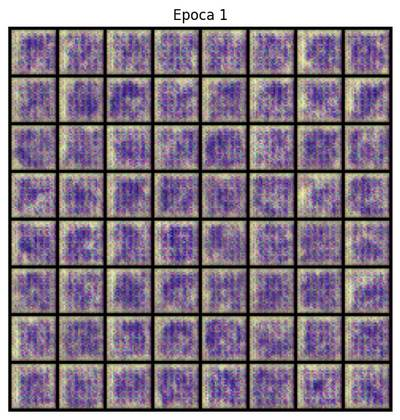

Epoch [1/100] | D_loss: 1.1430 | G_loss: 1.0237
Epoch [2/100] | D_loss: 1.1864 | G_loss: 1.0786
Epoch [3/100] | D_loss: 0.9530 | G_loss: 1.3180
Epoch [4/100] | D_loss: 0.8862 | G_loss: 1.4763
Epoch [5/100] | D_loss: 1.0898 | G_loss: 1.1919
Epoch [6/100] | D_loss: 0.8571 | G_loss: 1.4691
Epoch [7/100] | D_loss: 1.0298 | G_loss: 1.2670
Epoch [8/100] | D_loss: 0.8056 | G_loss: 1.7886
Epoch [9/100] | D_loss: 0.7792 | G_loss: 1.7468


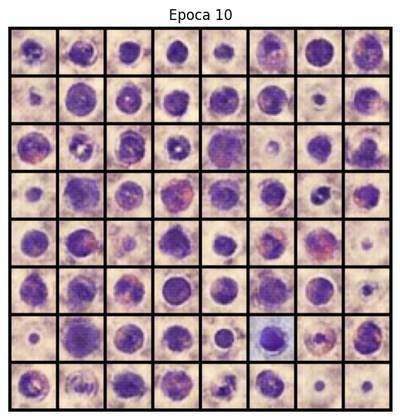

Epoch [10/100] | D_loss: 1.1118 | G_loss: 2.0119
Epoch [11/100] | D_loss: 0.6374 | G_loss: 1.7816
Epoch [12/100] | D_loss: 1.3581 | G_loss: 1.6448
Epoch [13/100] | D_loss: 0.9058 | G_loss: 1.9232
Epoch [14/100] | D_loss: 1.0413 | G_loss: 2.0513
Epoch [15/100] | D_loss: 0.7847 | G_loss: 1.7072
Epoch [16/100] | D_loss: 0.7442 | G_loss: 1.8935
Epoch [17/100] | D_loss: 0.8091 | G_loss: 1.7766
Epoch [18/100] | D_loss: 0.8443 | G_loss: 2.4035
Epoch [19/100] | D_loss: 0.4865 | G_loss: 2.1448


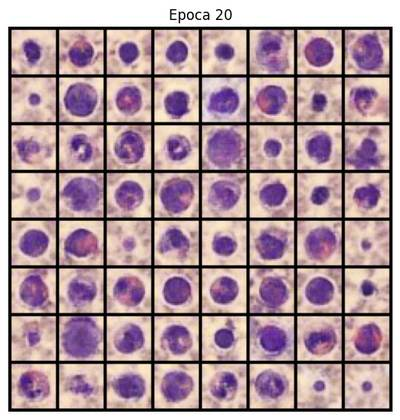

Epoch [20/100] | D_loss: 1.7230 | G_loss: 2.3109
Epoch [21/100] | D_loss: 1.3107 | G_loss: 1.6388
Epoch [22/100] | D_loss: 0.5031 | G_loss: 1.7734
Epoch [23/100] | D_loss: 0.7721 | G_loss: 2.1834
Epoch [24/100] | D_loss: 0.3836 | G_loss: 2.1317
Epoch [25/100] | D_loss: 0.6369 | G_loss: 2.4302
Epoch [26/100] | D_loss: 1.4864 | G_loss: 3.0985
Epoch [27/100] | D_loss: 0.4230 | G_loss: 2.4874
Epoch [28/100] | D_loss: 0.5138 | G_loss: 3.5848
Epoch [29/100] | D_loss: 1.2010 | G_loss: 2.1738


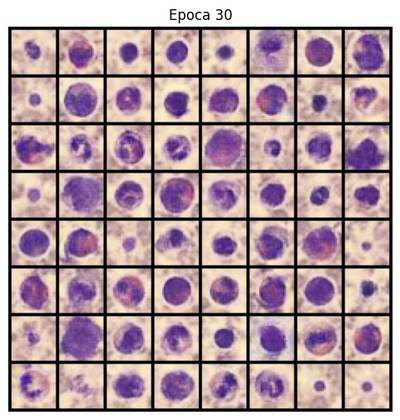

Epoch [30/100] | D_loss: 0.5660 | G_loss: 2.1206
Epoch [31/100] | D_loss: 0.5458 | G_loss: 1.6039
Epoch [32/100] | D_loss: 0.3795 | G_loss: 2.3545
Epoch [33/100] | D_loss: 0.6461 | G_loss: 2.3856
Epoch [34/100] | D_loss: 0.2838 | G_loss: 3.1811
Epoch [35/100] | D_loss: 0.2456 | G_loss: 2.7543
Epoch [36/100] | D_loss: 0.9916 | G_loss: 2.2091
Epoch [37/100] | D_loss: 1.6977 | G_loss: 1.9775
Epoch [38/100] | D_loss: 0.2731 | G_loss: 2.6361
Epoch [39/100] | D_loss: 0.1838 | G_loss: 3.3249


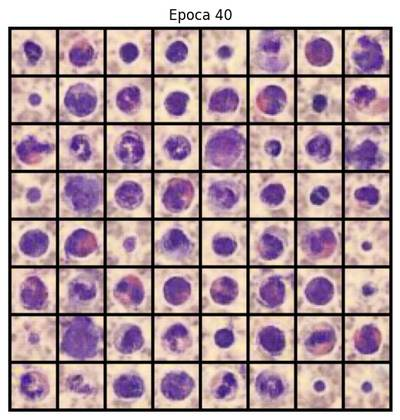

Epoch [40/100] | D_loss: 1.1122 | G_loss: 1.9128
Epoch [41/100] | D_loss: 0.9528 | G_loss: 4.0599
Epoch [42/100] | D_loss: 0.2513 | G_loss: 3.3228
Epoch [43/100] | D_loss: 0.6871 | G_loss: 1.8953
Epoch [44/100] | D_loss: 0.3113 | G_loss: 3.3191
Epoch [45/100] | D_loss: 0.3260 | G_loss: 3.9339
Epoch [46/100] | D_loss: 1.5066 | G_loss: 2.1157
Epoch [47/100] | D_loss: 0.5001 | G_loss: 3.5204
Epoch [48/100] | D_loss: 0.3617 | G_loss: 3.8695
Epoch [49/100] | D_loss: 0.6671 | G_loss: 2.5695


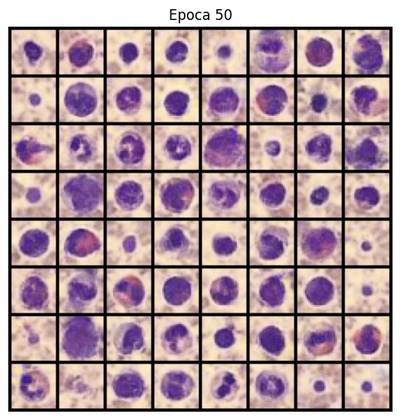

Epoch [50/100] | D_loss: 0.1993 | G_loss: 3.4506
Epoch [51/100] | D_loss: 0.3217 | G_loss: 3.5910
Epoch [52/100] | D_loss: 0.2650 | G_loss: 3.0621
Epoch [53/100] | D_loss: 0.2075 | G_loss: 3.3131
Epoch [54/100] | D_loss: 0.9651 | G_loss: 2.5102
Epoch [55/100] | D_loss: 0.2199 | G_loss: 3.5546
Epoch [56/100] | D_loss: 1.0701 | G_loss: 2.6508
Epoch [57/100] | D_loss: 0.4929 | G_loss: 4.2064
Epoch [58/100] | D_loss: 0.2186 | G_loss: 3.5372
Epoch [59/100] | D_loss: 0.1517 | G_loss: 3.9449


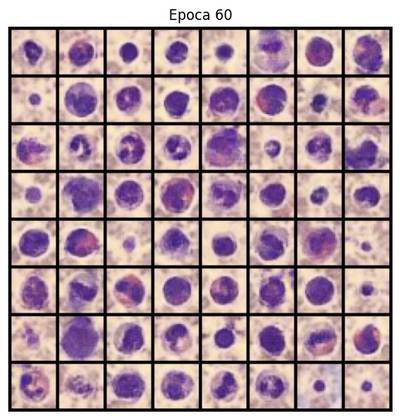

Epoch [60/100] | D_loss: 0.3119 | G_loss: 2.8604
Epoch [61/100] | D_loss: 0.1126 | G_loss: 3.8518
Epoch [62/100] | D_loss: 0.1368 | G_loss: 3.6973
Epoch [63/100] | D_loss: 0.1900 | G_loss: 4.0007
Epoch [64/100] | D_loss: 0.1797 | G_loss: 3.6224
Epoch [65/100] | D_loss: 0.0931 | G_loss: 3.7872
Epoch [66/100] | D_loss: 0.6101 | G_loss: 2.3694
Epoch [67/100] | D_loss: 0.2159 | G_loss: 4.1239
Epoch [68/100] | D_loss: 0.5337 | G_loss: 2.9771
Epoch [69/100] | D_loss: 0.1193 | G_loss: 4.4878


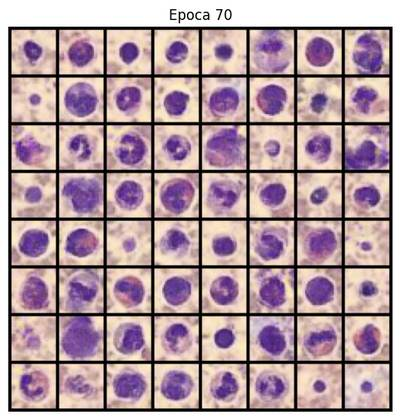

Epoch [70/100] | D_loss: 0.0935 | G_loss: 4.0550
Epoch [71/100] | D_loss: 0.4097 | G_loss: 2.2957
Epoch [72/100] | D_loss: 0.0982 | G_loss: 4.6196
Epoch [73/100] | D_loss: 0.1826 | G_loss: 3.2337
Epoch [74/100] | D_loss: 0.3709 | G_loss: 2.9203
Epoch [75/100] | D_loss: 0.2830 | G_loss: 3.2628
Epoch [76/100] | D_loss: 0.2074 | G_loss: 3.6800
Epoch [77/100] | D_loss: 0.1328 | G_loss: 3.7164
Epoch [78/100] | D_loss: 0.3580 | G_loss: 2.8974
Epoch [79/100] | D_loss: 0.1315 | G_loss: 3.6207


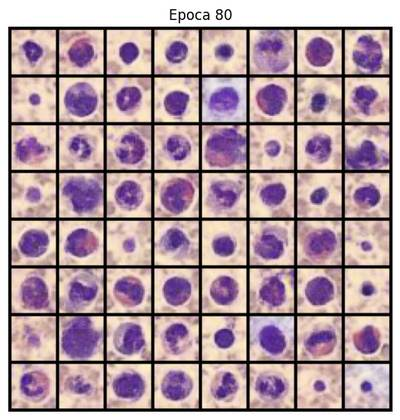

Epoch [80/100] | D_loss: 0.1216 | G_loss: 4.5570
Epoch [81/100] | D_loss: 0.6733 | G_loss: 3.7000
Epoch [82/100] | D_loss: 1.0196 | G_loss: 3.0026
Epoch [83/100] | D_loss: 0.1934 | G_loss: 4.6899
Epoch [84/100] | D_loss: 0.0737 | G_loss: 4.2759
Epoch [85/100] | D_loss: 0.4809 | G_loss: 2.4213
Epoch [86/100] | D_loss: 0.6798 | G_loss: 2.8153
Epoch [87/100] | D_loss: 0.3251 | G_loss: 3.4086
Epoch [88/100] | D_loss: 0.1610 | G_loss: 3.4470
Epoch [89/100] | D_loss: 0.0905 | G_loss: 4.6645


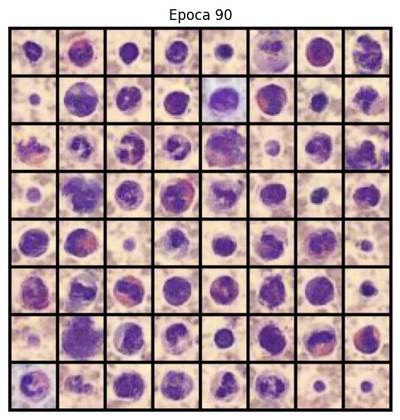

Epoch [90/100] | D_loss: 0.2080 | G_loss: 4.5033
Epoch [91/100] | D_loss: 0.2085 | G_loss: 4.4724
Epoch [92/100] | D_loss: 0.1582 | G_loss: 3.9394
Epoch [93/100] | D_loss: 0.1338 | G_loss: 3.4421
Epoch [94/100] | D_loss: 0.1308 | G_loss: 3.9146
Epoch [95/100] | D_loss: 0.2371 | G_loss: 4.0791
Epoch [96/100] | D_loss: 0.2955 | G_loss: 4.2380
Epoch [97/100] | D_loss: 0.1148 | G_loss: 4.1406
Epoch [98/100] | D_loss: 0.2151 | G_loss: 3.4639
Epoch [99/100] | D_loss: 0.3930 | G_loss: 3.1072


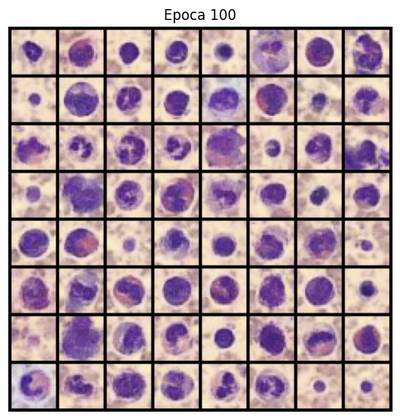

Epoch [100/100] | D_loss: 0.2490 | G_loss: 3.8869
→ FID: 143.1461

Combo 2/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 64, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0001}


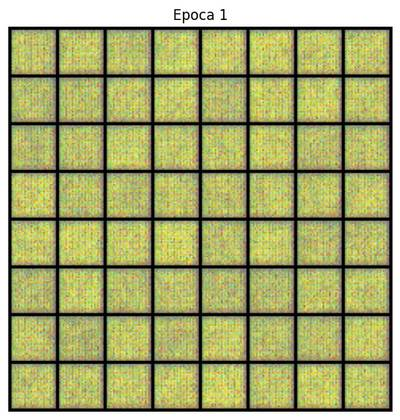

Epoch [1/100] | D_loss: 1.1944 | G_loss: 0.9056
Epoch [2/100] | D_loss: 1.2216 | G_loss: 0.9374
Epoch [3/100] | D_loss: 1.1443 | G_loss: 1.0207
Epoch [4/100] | D_loss: 0.9494 | G_loss: 1.1321
Epoch [5/100] | D_loss: 0.8997 | G_loss: 1.3042
Epoch [6/100] | D_loss: 1.0076 | G_loss: 1.0872
Epoch [7/100] | D_loss: 1.3090 | G_loss: 1.3313
Epoch [8/100] | D_loss: 0.8883 | G_loss: 1.2074
Epoch [9/100] | D_loss: 0.8456 | G_loss: 1.2046


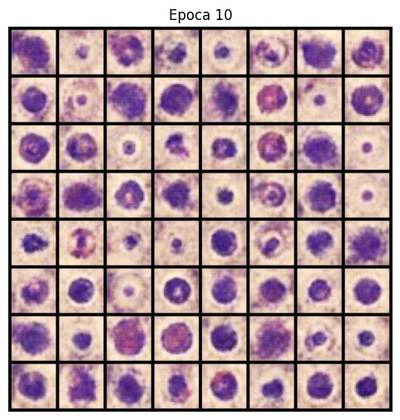

Epoch [10/100] | D_loss: 1.1573 | G_loss: 1.5188
Epoch [11/100] | D_loss: 0.9064 | G_loss: 1.2500
Epoch [12/100] | D_loss: 0.9271 | G_loss: 1.7753
Epoch [13/100] | D_loss: 0.9960 | G_loss: 1.7160
Epoch [14/100] | D_loss: 0.9867 | G_loss: 1.5000
Epoch [15/100] | D_loss: 0.8531 | G_loss: 1.3289
Epoch [16/100] | D_loss: 0.7862 | G_loss: 1.4632
Epoch [17/100] | D_loss: 0.7563 | G_loss: 1.8428
Epoch [18/100] | D_loss: 0.6271 | G_loss: 1.9741
Epoch [19/100] | D_loss: 0.7412 | G_loss: 1.7354


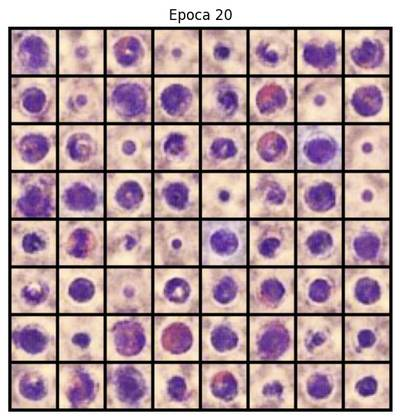

Epoch [20/100] | D_loss: 1.4397 | G_loss: 1.6435
Epoch [21/100] | D_loss: 1.2047 | G_loss: 1.2697
Epoch [22/100] | D_loss: 0.7629 | G_loss: 1.6026
Epoch [23/100] | D_loss: 0.7359 | G_loss: 1.8914
Epoch [24/100] | D_loss: 0.5497 | G_loss: 1.7426
Epoch [25/100] | D_loss: 0.8200 | G_loss: 1.9371
Epoch [26/100] | D_loss: 1.5003 | G_loss: 2.0789
Epoch [27/100] | D_loss: 0.5177 | G_loss: 1.7881
Epoch [28/100] | D_loss: 0.4934 | G_loss: 2.4125
Epoch [29/100] | D_loss: 0.7815 | G_loss: 1.1244


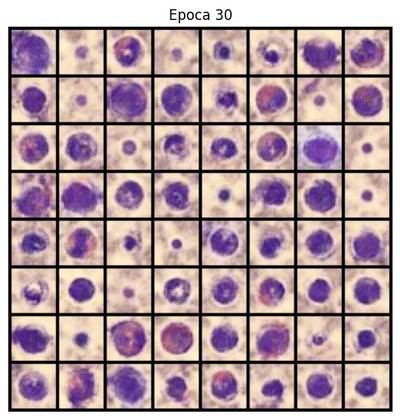

Epoch [30/100] | D_loss: 0.6774 | G_loss: 1.8652
Epoch [31/100] | D_loss: 0.6722 | G_loss: 1.4559
Epoch [32/100] | D_loss: 0.8609 | G_loss: 1.5707
Epoch [33/100] | D_loss: 0.4914 | G_loss: 2.3819
Epoch [34/100] | D_loss: 0.5266 | G_loss: 2.1400
Epoch [35/100] | D_loss: 0.3688 | G_loss: 2.2390
Epoch [36/100] | D_loss: 0.7294 | G_loss: 2.0419
Epoch [37/100] | D_loss: 0.7768 | G_loss: 2.3118
Epoch [38/100] | D_loss: 0.6627 | G_loss: 2.4073
Epoch [39/100] | D_loss: 0.6047 | G_loss: 2.0130


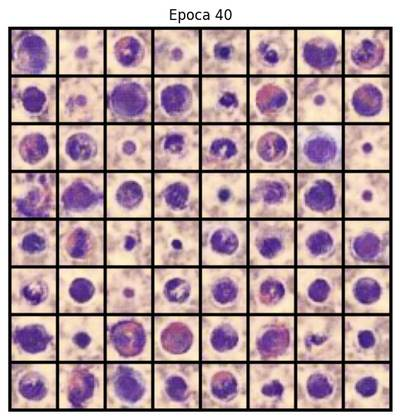

Epoch [40/100] | D_loss: 0.6507 | G_loss: 2.2806
Epoch [41/100] | D_loss: 0.7502 | G_loss: 2.4611
Epoch [42/100] | D_loss: 0.5265 | G_loss: 2.6581
Epoch [43/100] | D_loss: 0.4935 | G_loss: 2.1664
Epoch [44/100] | D_loss: 0.5833 | G_loss: 2.5426
Epoch [45/100] | D_loss: 0.4695 | G_loss: 1.5814
Epoch [46/100] | D_loss: 0.3908 | G_loss: 3.0346
Epoch [47/100] | D_loss: 0.3925 | G_loss: 3.2947
Epoch [48/100] | D_loss: 0.5847 | G_loss: 2.5816
Epoch [49/100] | D_loss: 0.5525 | G_loss: 2.0250


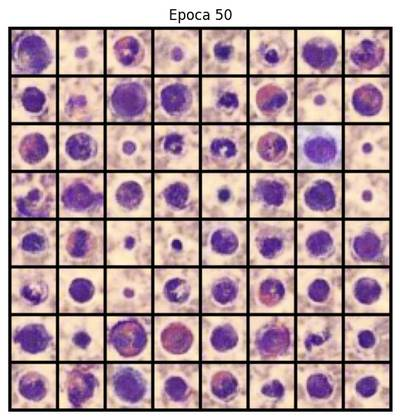

Epoch [50/100] | D_loss: 0.3551 | G_loss: 2.4821
Epoch [51/100] | D_loss: 0.3005 | G_loss: 2.6788
Epoch [52/100] | D_loss: 0.5176 | G_loss: 1.9833
Epoch [53/100] | D_loss: 0.4288 | G_loss: 2.7336
Epoch [54/100] | D_loss: 0.2627 | G_loss: 2.6650
Epoch [55/100] | D_loss: 0.6369 | G_loss: 2.5843
Epoch [56/100] | D_loss: 0.4713 | G_loss: 2.1571
Epoch [57/100] | D_loss: 0.3928 | G_loss: 2.4618
Epoch [58/100] | D_loss: 0.2854 | G_loss: 3.0865
Epoch [59/100] | D_loss: 0.4544 | G_loss: 3.3430


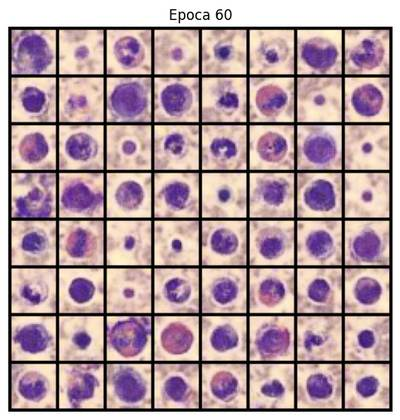

Epoch [60/100] | D_loss: 0.4907 | G_loss: 2.4128
Epoch [61/100] | D_loss: 0.3803 | G_loss: 3.2135
Epoch [62/100] | D_loss: 0.3589 | G_loss: 2.4040
Epoch [63/100] | D_loss: 0.3988 | G_loss: 2.4190
Epoch [64/100] | D_loss: 0.2756 | G_loss: 2.8016
Epoch [65/100] | D_loss: 0.1938 | G_loss: 2.9381
Epoch [66/100] | D_loss: 0.6863 | G_loss: 1.9752
Epoch [67/100] | D_loss: 0.3340 | G_loss: 2.7356
Epoch [68/100] | D_loss: 1.0258 | G_loss: 2.1966
Epoch [69/100] | D_loss: 1.2831 | G_loss: 2.1383


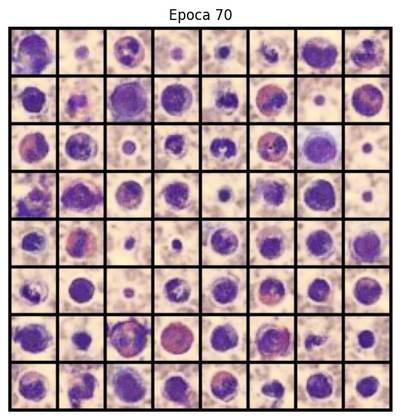

Epoch [70/100] | D_loss: 0.2798 | G_loss: 3.0292
Epoch [71/100] | D_loss: 0.5693 | G_loss: 2.7148
Epoch [72/100] | D_loss: 0.3110 | G_loss: 3.3581
Epoch [73/100] | D_loss: 0.2780 | G_loss: 2.1481
Epoch [74/100] | D_loss: 0.8672 | G_loss: 1.7210
Epoch [75/100] | D_loss: 0.5302 | G_loss: 2.1636
Epoch [76/100] | D_loss: 0.2467 | G_loss: 3.6467
Epoch [77/100] | D_loss: 0.2358 | G_loss: 3.1830
Epoch [78/100] | D_loss: 0.3622 | G_loss: 3.5393
Epoch [79/100] | D_loss: 0.1574 | G_loss: 3.4173


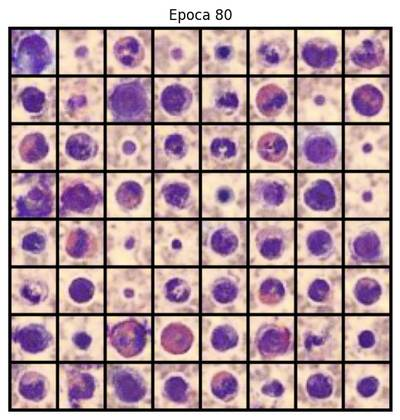

Epoch [80/100] | D_loss: 0.2085 | G_loss: 3.2609
Epoch [81/100] | D_loss: 1.3813 | G_loss: 2.4777
Epoch [82/100] | D_loss: 0.3291 | G_loss: 3.2551
Epoch [83/100] | D_loss: 1.0053 | G_loss: 1.7762
Epoch [84/100] | D_loss: 0.2025 | G_loss: 3.1553
Epoch [85/100] | D_loss: 0.7159 | G_loss: 0.8596
Epoch [86/100] | D_loss: 0.8791 | G_loss: 0.8623
Epoch [87/100] | D_loss: 0.7436 | G_loss: 2.5783
Epoch [88/100] | D_loss: 0.1085 | G_loss: 3.6681
Epoch [89/100] | D_loss: 0.4510 | G_loss: 3.4448


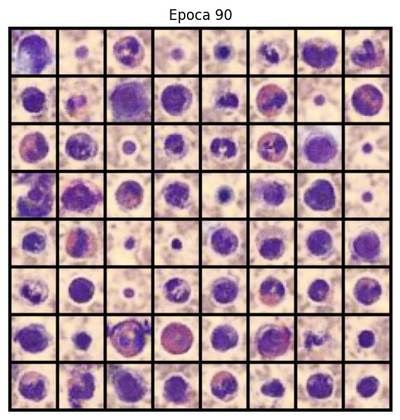

Epoch [90/100] | D_loss: 0.1650 | G_loss: 3.8529
Epoch [91/100] | D_loss: 0.3149 | G_loss: 3.0428
Epoch [92/100] | D_loss: 0.2173 | G_loss: 3.3216
Epoch [93/100] | D_loss: 0.1384 | G_loss: 3.6676
Epoch [94/100] | D_loss: 0.1294 | G_loss: 3.8705
Epoch [95/100] | D_loss: 0.1901 | G_loss: 2.9566
Epoch [96/100] | D_loss: 0.5642 | G_loss: 2.2878
Epoch [97/100] | D_loss: 0.1413 | G_loss: 3.7247
Epoch [98/100] | D_loss: 0.2285 | G_loss: 3.1898
Epoch [99/100] | D_loss: 0.8219 | G_loss: 2.2335


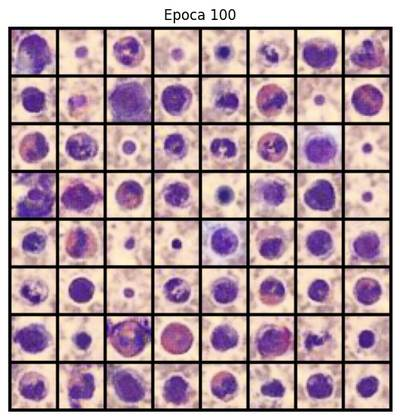

Epoch [100/100] | D_loss: 0.4057 | G_loss: 4.0164
→ FID: 150.0447

Combo 3/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 64, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0002}


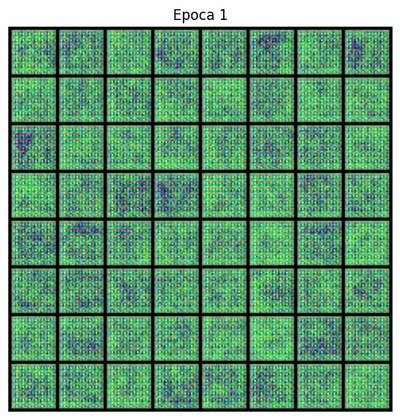

Epoch [1/100] | D_loss: 1.1460 | G_loss: 1.0283
Epoch [2/100] | D_loss: 1.2175 | G_loss: 0.9169
Epoch [3/100] | D_loss: 1.0557 | G_loss: 1.1716
Epoch [4/100] | D_loss: 1.1515 | G_loss: 1.3877
Epoch [5/100] | D_loss: 0.7652 | G_loss: 1.7301
Epoch [6/100] | D_loss: 0.9669 | G_loss: 1.6636
Epoch [7/100] | D_loss: 1.1010 | G_loss: 1.0540
Epoch [8/100] | D_loss: 0.5421 | G_loss: 1.9656
Epoch [9/100] | D_loss: 0.6516 | G_loss: 2.0694


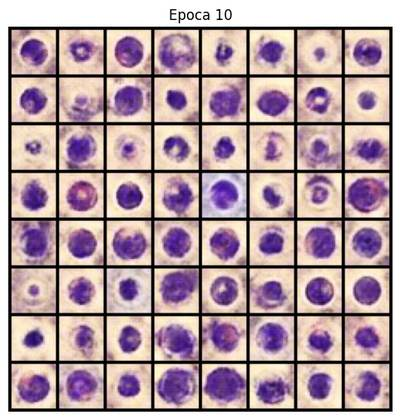

Epoch [10/100] | D_loss: 0.8238 | G_loss: 1.1055
Epoch [11/100] | D_loss: 0.9703 | G_loss: 1.7504
Epoch [12/100] | D_loss: 0.6132 | G_loss: 2.4114
Epoch [13/100] | D_loss: 0.7677 | G_loss: 2.0606
Epoch [14/100] | D_loss: 0.4762 | G_loss: 2.6130
Epoch [15/100] | D_loss: 0.7758 | G_loss: 2.1062
Epoch [16/100] | D_loss: 1.8455 | G_loss: 2.3409
Epoch [17/100] | D_loss: 0.6996 | G_loss: 2.2575
Epoch [18/100] | D_loss: 0.3359 | G_loss: 2.5441
Epoch [19/100] | D_loss: 0.4697 | G_loss: 2.3342


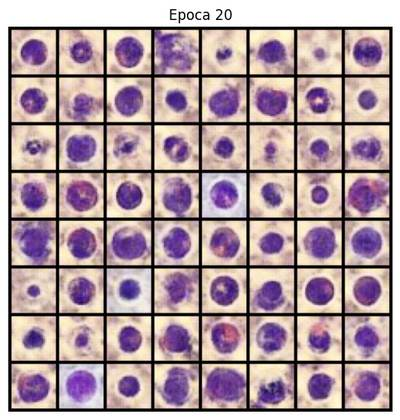

Epoch [20/100] | D_loss: 0.6709 | G_loss: 2.8147
Epoch [21/100] | D_loss: 0.3980 | G_loss: 3.2386
Epoch [22/100] | D_loss: 0.4183 | G_loss: 2.9592
Epoch [23/100] | D_loss: 0.6021 | G_loss: 2.4173
Epoch [24/100] | D_loss: 1.4698 | G_loss: 2.9539
Epoch [25/100] | D_loss: 0.4772 | G_loss: 2.2488
Epoch [26/100] | D_loss: 1.1246 | G_loss: 3.3461
Epoch [27/100] | D_loss: 0.7034 | G_loss: 2.1628
Epoch [28/100] | D_loss: 1.6668 | G_loss: 2.1927
Epoch [29/100] | D_loss: 1.0730 | G_loss: 3.0795


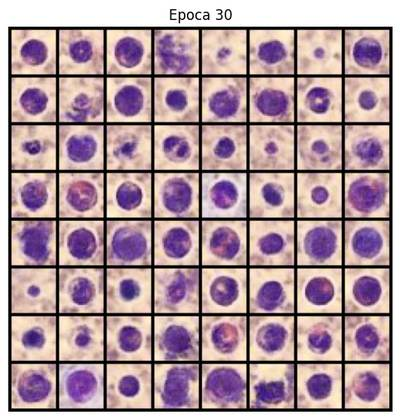

Epoch [30/100] | D_loss: 0.3401 | G_loss: 2.5705
Epoch [31/100] | D_loss: 0.4356 | G_loss: 2.9228
Epoch [32/100] | D_loss: 0.2149 | G_loss: 3.1594
Epoch [33/100] | D_loss: 0.5242 | G_loss: 3.5469
Epoch [34/100] | D_loss: 1.2949 | G_loss: 3.9673
Epoch [35/100] | D_loss: 0.3110 | G_loss: 3.2625
Epoch [36/100] | D_loss: 0.2205 | G_loss: 3.4643
Epoch [37/100] | D_loss: 0.5571 | G_loss: 3.2158
Epoch [38/100] | D_loss: 1.1948 | G_loss: 1.8064
Epoch [39/100] | D_loss: 0.3351 | G_loss: 3.0595


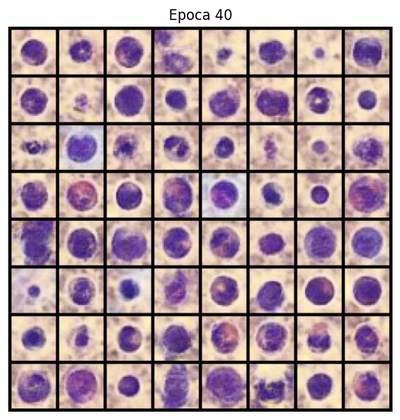

Epoch [40/100] | D_loss: 2.0844 | G_loss: 1.6510
Epoch [41/100] | D_loss: 0.3151 | G_loss: 2.9233
Epoch [42/100] | D_loss: 1.9982 | G_loss: 2.1495
Epoch [43/100] | D_loss: 0.1995 | G_loss: 3.6304
Epoch [44/100] | D_loss: 0.4637 | G_loss: 2.3146
Epoch [45/100] | D_loss: 0.4945 | G_loss: 3.1407
Epoch [46/100] | D_loss: 0.4767 | G_loss: 3.4569
Epoch [47/100] | D_loss: 0.2306 | G_loss: 3.4783
Epoch [48/100] | D_loss: 0.3563 | G_loss: 2.8335
Epoch [49/100] | D_loss: 0.3063 | G_loss: 3.0020


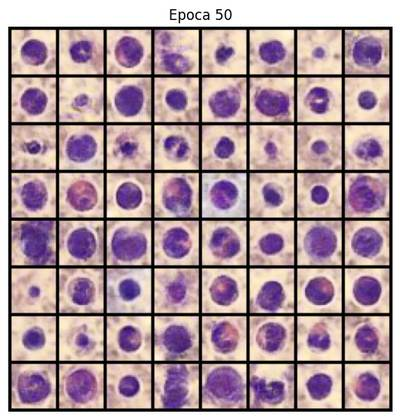

Epoch [50/100] | D_loss: 0.1829 | G_loss: 3.2497
Epoch [51/100] | D_loss: 0.1478 | G_loss: 3.8311
Epoch [52/100] | D_loss: 0.1685 | G_loss: 3.4650
Epoch [53/100] | D_loss: 0.3104 | G_loss: 3.1211
Epoch [54/100] | D_loss: 0.1571 | G_loss: 3.6796
Epoch [55/100] | D_loss: 0.1198 | G_loss: 3.8501
Epoch [56/100] | D_loss: 0.1086 | G_loss: 3.9383
Epoch [57/100] | D_loss: 0.1641 | G_loss: 3.3145
Epoch [58/100] | D_loss: 0.4249 | G_loss: 2.8604
Epoch [59/100] | D_loss: 0.6766 | G_loss: 2.3893


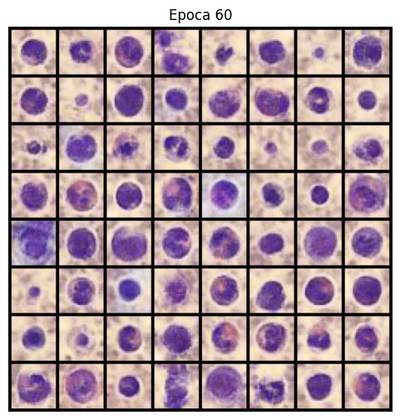

Epoch [60/100] | D_loss: 0.1882 | G_loss: 3.5624
Epoch [61/100] | D_loss: 0.7165 | G_loss: 2.5255
Epoch [62/100] | D_loss: 0.3066 | G_loss: 3.1286
Epoch [63/100] | D_loss: 0.2753 | G_loss: 2.8932
Epoch [64/100] | D_loss: 1.0664 | G_loss: 3.3316
Epoch [65/100] | D_loss: 0.1520 | G_loss: 3.4328
Epoch [66/100] | D_loss: 0.8926 | G_loss: 2.8553
Epoch [67/100] | D_loss: 0.7511 | G_loss: 3.7211
Epoch [68/100] | D_loss: 0.6925 | G_loss: 1.1835
Epoch [69/100] | D_loss: 0.2458 | G_loss: 3.2394


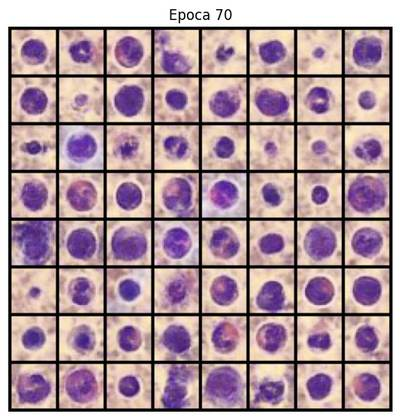

Epoch [70/100] | D_loss: 0.4662 | G_loss: 4.1055
Epoch [71/100] | D_loss: 1.5120 | G_loss: 1.3753
Epoch [72/100] | D_loss: 0.1662 | G_loss: 3.6665
Epoch [73/100] | D_loss: 0.2728 | G_loss: 4.9765
Epoch [74/100] | D_loss: 0.3909 | G_loss: 3.2545
Epoch [75/100] | D_loss: 0.7759 | G_loss: 2.6929
Epoch [76/100] | D_loss: 1.0016 | G_loss: 4.1642
Epoch [77/100] | D_loss: 0.1307 | G_loss: 3.9671
Epoch [78/100] | D_loss: 0.5724 | G_loss: 3.0268
Epoch [79/100] | D_loss: 0.3130 | G_loss: 3.2341


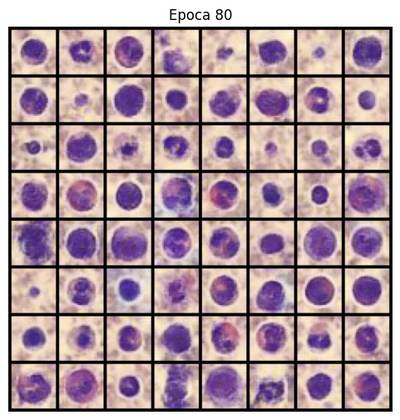

Epoch [80/100] | D_loss: 0.4584 | G_loss: 5.1396
Epoch [81/100] | D_loss: 0.8845 | G_loss: 3.0421
Epoch [82/100] | D_loss: 0.3948 | G_loss: 2.7703
Epoch [83/100] | D_loss: 0.3852 | G_loss: 4.2031
Epoch [84/100] | D_loss: 0.5624 | G_loss: 4.4741
Epoch [85/100] | D_loss: 0.1928 | G_loss: 4.5944
Epoch [86/100] | D_loss: 0.1458 | G_loss: 4.1485
Epoch [87/100] | D_loss: 0.1148 | G_loss: 4.6411
Epoch [88/100] | D_loss: 0.1732 | G_loss: 3.9984
Epoch [89/100] | D_loss: 0.3846 | G_loss: 3.9912


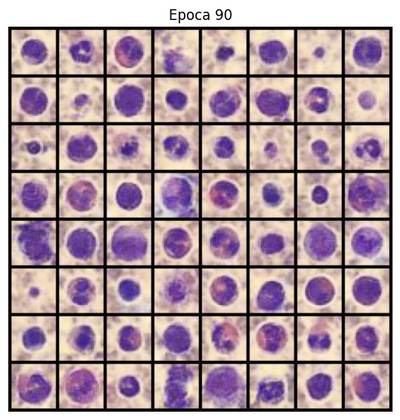

Epoch [90/100] | D_loss: 0.5595 | G_loss: 4.1020
Epoch [91/100] | D_loss: 0.1262 | G_loss: 4.3640
Epoch [92/100] | D_loss: 0.1041 | G_loss: 3.8984
Epoch [93/100] | D_loss: 0.4223 | G_loss: 3.7118
Epoch [94/100] | D_loss: 0.4516 | G_loss: 3.3706
Epoch [95/100] | D_loss: 0.3485 | G_loss: 3.4056
Epoch [96/100] | D_loss: 0.3170 | G_loss: 3.7490
Epoch [97/100] | D_loss: 0.7474 | G_loss: 4.0513
Epoch [98/100] | D_loss: 0.0819 | G_loss: 4.6870
Epoch [99/100] | D_loss: 0.3015 | G_loss: 3.5817


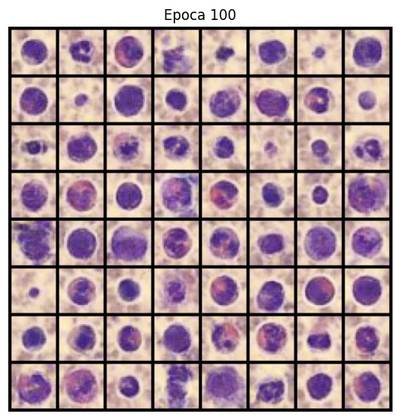

Epoch [100/100] | D_loss: 0.1961 | G_loss: 3.9010
→ FID: 158.0297

Combo 4/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 64, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0001}


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000002AE8D6E11B0>
Traceback (most recent call last):
  File "<HOME>\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py", line 1604, in __del__
    self._shutdown_workers()
  File "<HOME>\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py", line 1562, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


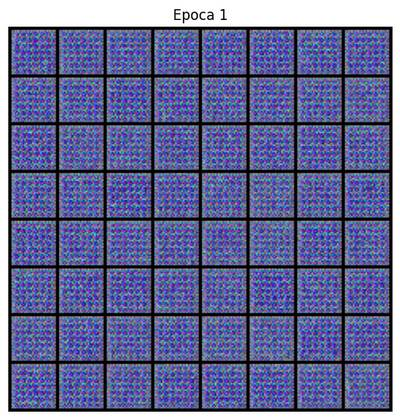

Epoch [1/100] | D_loss: 1.2193 | G_loss: 0.8900
Epoch [2/100] | D_loss: 1.1863 | G_loss: 0.9604
Epoch [3/100] | D_loss: 1.0398 | G_loss: 1.0091
Epoch [4/100] | D_loss: 1.2094 | G_loss: 1.0163
Epoch [5/100] | D_loss: 1.0372 | G_loss: 1.1219
Epoch [6/100] | D_loss: 1.2842 | G_loss: 1.2826
Epoch [7/100] | D_loss: 0.8150 | G_loss: 1.3174
Epoch [8/100] | D_loss: 0.7275 | G_loss: 1.4041
Epoch [9/100] | D_loss: 0.7090 | G_loss: 1.6989


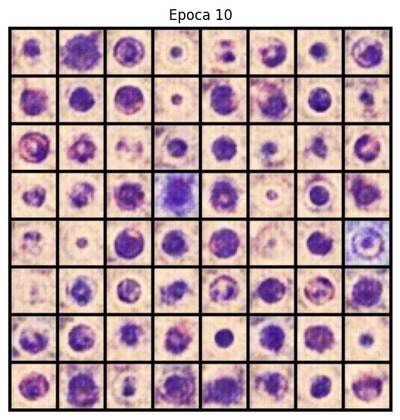

Epoch [10/100] | D_loss: 0.7898 | G_loss: 1.6992
Epoch [11/100] | D_loss: 0.8014 | G_loss: 1.9552
Epoch [12/100] | D_loss: 0.6809 | G_loss: 1.6580
Epoch [13/100] | D_loss: 0.8258 | G_loss: 1.7921
Epoch [14/100] | D_loss: 1.1266 | G_loss: 1.3902
Epoch [15/100] | D_loss: 0.8455 | G_loss: 1.8879
Epoch [16/100] | D_loss: 1.5146 | G_loss: 1.8755
Epoch [17/100] | D_loss: 0.5216 | G_loss: 2.1236
Epoch [18/100] | D_loss: 0.7901 | G_loss: 2.2080
Epoch [19/100] | D_loss: 0.5253 | G_loss: 2.2502


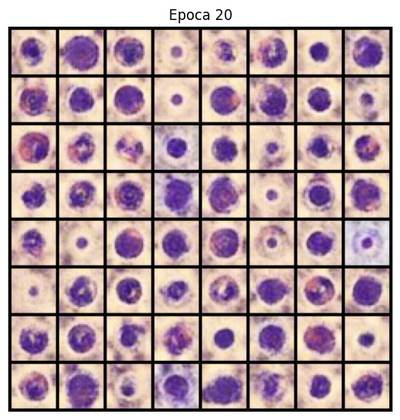

Epoch [20/100] | D_loss: 0.4561 | G_loss: 2.7984
Epoch [21/100] | D_loss: 1.3315 | G_loss: 2.9631
Epoch [22/100] | D_loss: 0.7785 | G_loss: 2.0268
Epoch [23/100] | D_loss: 0.5065 | G_loss: 1.8169
Epoch [24/100] | D_loss: 1.5456 | G_loss: 2.3476
Epoch [25/100] | D_loss: 0.5903 | G_loss: 1.7958
Epoch [26/100] | D_loss: 1.3465 | G_loss: 1.5734
Epoch [27/100] | D_loss: 0.9206 | G_loss: 1.5635
Epoch [28/100] | D_loss: 1.2347 | G_loss: 3.6903
Epoch [29/100] | D_loss: 1.0179 | G_loss: 3.0678


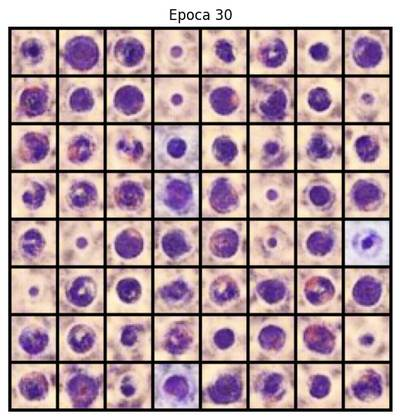

Epoch [30/100] | D_loss: 0.4623 | G_loss: 2.4530
Epoch [31/100] | D_loss: 1.3688 | G_loss: 1.1014
Epoch [32/100] | D_loss: 0.4160 | G_loss: 2.4984
Epoch [33/100] | D_loss: 0.4011 | G_loss: 2.8004
Epoch [34/100] | D_loss: 1.7760 | G_loss: 2.8827
Epoch [35/100] | D_loss: 0.5195 | G_loss: 2.2226
Epoch [36/100] | D_loss: 0.3234 | G_loss: 2.9706
Epoch [37/100] | D_loss: 1.9321 | G_loss: 2.7872
Epoch [38/100] | D_loss: 0.3351 | G_loss: 2.4730
Epoch [39/100] | D_loss: 0.4711 | G_loss: 2.1104


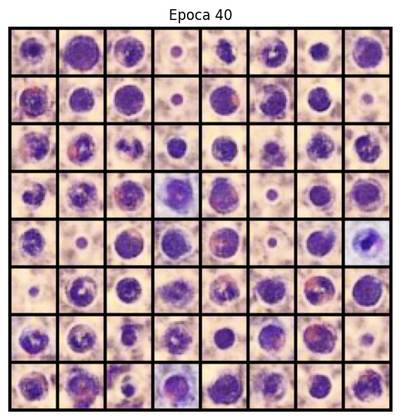

Epoch [40/100] | D_loss: 0.4333 | G_loss: 1.8396
Epoch [41/100] | D_loss: 0.6738 | G_loss: 2.4619
Epoch [42/100] | D_loss: 0.2985 | G_loss: 2.9232
Epoch [43/100] | D_loss: 0.3276 | G_loss: 2.8773
Epoch [44/100] | D_loss: 0.3777 | G_loss: 2.1892
Epoch [45/100] | D_loss: 0.7173 | G_loss: 2.5884
Epoch [46/100] | D_loss: 0.2669 | G_loss: 2.5663
Epoch [47/100] | D_loss: 0.2887 | G_loss: 2.2845
Epoch [48/100] | D_loss: 0.2766 | G_loss: 2.7442
Epoch [49/100] | D_loss: 0.4253 | G_loss: 2.0785


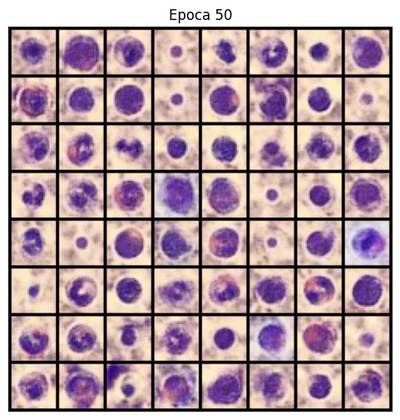

Epoch [50/100] | D_loss: 0.3620 | G_loss: 2.4521
Epoch [51/100] | D_loss: 0.4606 | G_loss: 3.1315
Epoch [52/100] | D_loss: 0.2066 | G_loss: 3.1027
Epoch [53/100] | D_loss: 0.3690 | G_loss: 2.8274
Epoch [54/100] | D_loss: 0.3421 | G_loss: 2.4213
Epoch [55/100] | D_loss: 0.1827 | G_loss: 3.0103
Epoch [56/100] | D_loss: 0.4027 | G_loss: 2.6284
Epoch [57/100] | D_loss: 0.5627 | G_loss: 2.2897
Epoch [58/100] | D_loss: 0.3264 | G_loss: 3.1830
Epoch [59/100] | D_loss: 0.6598 | G_loss: 1.7396


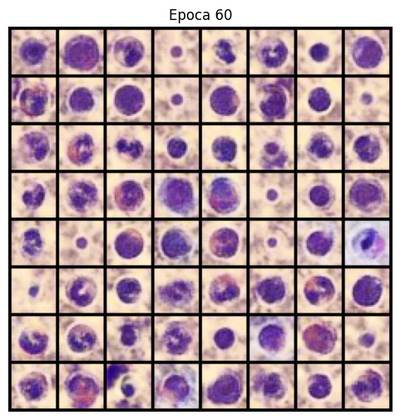

Epoch [60/100] | D_loss: 0.3346 | G_loss: 2.8917
Epoch [61/100] | D_loss: 0.8725 | G_loss: 3.5246
Epoch [62/100] | D_loss: 0.1720 | G_loss: 4.0005
Epoch [63/100] | D_loss: 0.1784 | G_loss: 3.1696
Epoch [64/100] | D_loss: 1.3677 | G_loss: 2.4728
Epoch [65/100] | D_loss: 0.2844 | G_loss: 2.8205
Epoch [66/100] | D_loss: 1.1149 | G_loss: 2.8078
Epoch [67/100] | D_loss: 0.8390 | G_loss: 2.0819
Epoch [68/100] | D_loss: 0.2169 | G_loss: 3.1609
Epoch [69/100] | D_loss: 0.3253 | G_loss: 2.6526


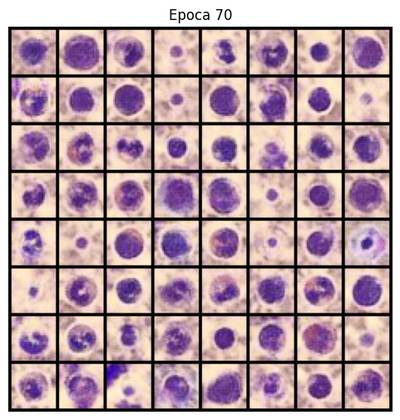

Epoch [70/100] | D_loss: 0.2886 | G_loss: 2.6474
Epoch [71/100] | D_loss: 0.1753 | G_loss: 2.5371
Epoch [72/100] | D_loss: 0.6429 | G_loss: 2.3897
Epoch [73/100] | D_loss: 0.4740 | G_loss: 3.2423
Epoch [74/100] | D_loss: 0.1444 | G_loss: 3.6833
Epoch [75/100] | D_loss: 1.2296 | G_loss: 3.5846
Epoch [76/100] | D_loss: 0.7353 | G_loss: 3.6791
Epoch [77/100] | D_loss: 0.0926 | G_loss: 3.8671
Epoch [78/100] | D_loss: 0.5810 | G_loss: 2.9365
Epoch [79/100] | D_loss: 0.2276 | G_loss: 3.3408


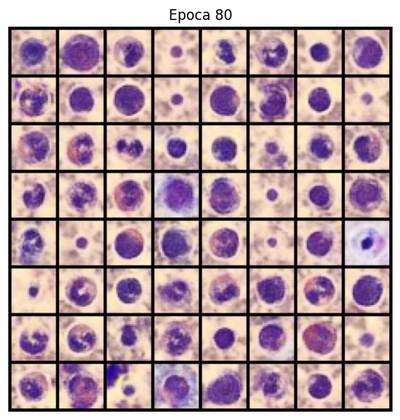

Epoch [80/100] | D_loss: 0.2362 | G_loss: 3.1511
Epoch [81/100] | D_loss: 2.1186 | G_loss: 3.4848
Epoch [82/100] | D_loss: 0.1471 | G_loss: 3.1584
Epoch [83/100] | D_loss: 0.4099 | G_loss: 2.6470
Epoch [84/100] | D_loss: 1.1971 | G_loss: 1.9577
Epoch [85/100] | D_loss: 0.1665 | G_loss: 3.3199
Epoch [86/100] | D_loss: 0.1209 | G_loss: 3.4104
Epoch [87/100] | D_loss: 0.1638 | G_loss: 3.0621
Epoch [88/100] | D_loss: 0.2093 | G_loss: 2.7291
Epoch [89/100] | D_loss: 0.2721 | G_loss: 2.7251


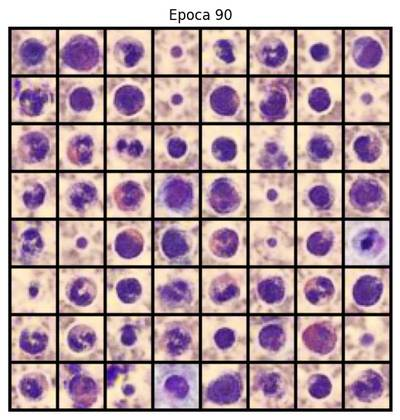

Epoch [90/100] | D_loss: 0.5654 | G_loss: 3.4356
Epoch [91/100] | D_loss: 0.2900 | G_loss: 3.6566
Epoch [92/100] | D_loss: 0.5080 | G_loss: 2.3970
Epoch [93/100] | D_loss: 1.6317 | G_loss: 1.4739
Epoch [94/100] | D_loss: 0.3132 | G_loss: 2.9029
Epoch [95/100] | D_loss: 0.3319 | G_loss: 4.0994
Epoch [96/100] | D_loss: 0.3828 | G_loss: 2.6184
Epoch [97/100] | D_loss: 0.4722 | G_loss: 2.4647
Epoch [98/100] | D_loss: 0.2098 | G_loss: 3.8263
Epoch [99/100] | D_loss: 0.1075 | G_loss: 3.6513


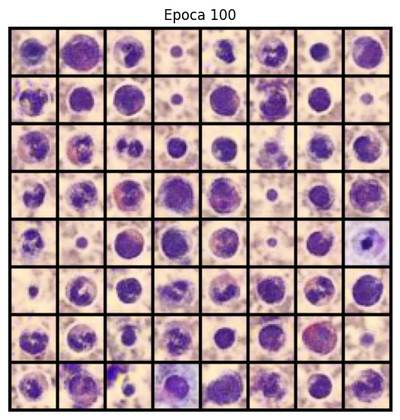

Epoch [100/100] | D_loss: 0.1678 | G_loss: 2.9259
→ FID: 145.1477

Combo 5/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 128, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0002}


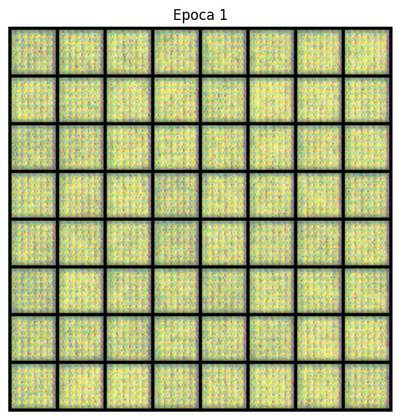

Epoch [1/100] | D_loss: 0.8408 | G_loss: 1.3430
Epoch [2/100] | D_loss: 0.9736 | G_loss: 1.3010
Epoch [3/100] | D_loss: 0.8859 | G_loss: 1.4021
Epoch [4/100] | D_loss: 0.9212 | G_loss: 1.6320
Epoch [5/100] | D_loss: 0.6941 | G_loss: 1.7046
Epoch [6/100] | D_loss: 0.9049 | G_loss: 1.3016
Epoch [7/100] | D_loss: 0.7561 | G_loss: 1.9370
Epoch [8/100] | D_loss: 0.9880 | G_loss: 1.3675
Epoch [9/100] | D_loss: 0.8344 | G_loss: 2.0463


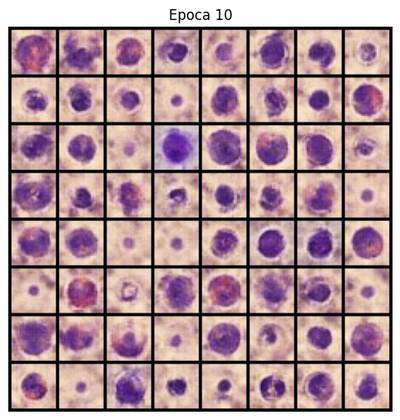

Epoch [10/100] | D_loss: 0.8441 | G_loss: 2.8704
Epoch [11/100] | D_loss: 0.7283 | G_loss: 2.0709
Epoch [12/100] | D_loss: 0.5893 | G_loss: 3.0155
Epoch [13/100] | D_loss: 0.3657 | G_loss: 2.7613
Epoch [14/100] | D_loss: 0.9604 | G_loss: 1.8342
Epoch [15/100] | D_loss: 0.3304 | G_loss: 2.9463
Epoch [16/100] | D_loss: 0.2418 | G_loss: 2.9175
Epoch [17/100] | D_loss: 0.1948 | G_loss: 3.2332
Epoch [18/100] | D_loss: 0.8234 | G_loss: 2.4694
Epoch [19/100] | D_loss: 0.1750 | G_loss: 2.9609


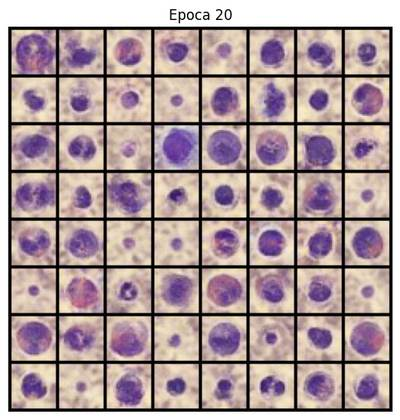

Epoch [20/100] | D_loss: 0.7038 | G_loss: 2.3488
Epoch [21/100] | D_loss: 0.2682 | G_loss: 2.5704
Epoch [22/100] | D_loss: 1.5197 | G_loss: 4.0251
Epoch [23/100] | D_loss: 0.4527 | G_loss: 2.6303
Epoch [24/100] | D_loss: 0.5889 | G_loss: 3.0468
Epoch [25/100] | D_loss: 0.6835 | G_loss: 1.6701
Epoch [26/100] | D_loss: 0.3120 | G_loss: 2.8439
Epoch [27/100] | D_loss: 0.1782 | G_loss: 3.2253
Epoch [28/100] | D_loss: 0.2631 | G_loss: 3.3238
Epoch [29/100] | D_loss: 1.5495 | G_loss: 2.2482


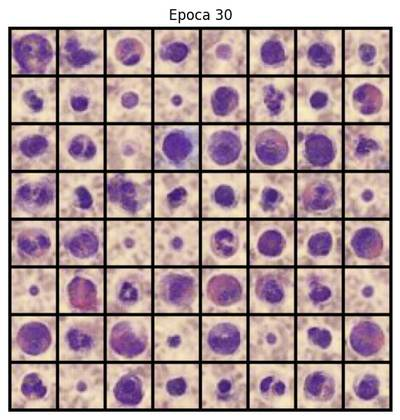

Epoch [30/100] | D_loss: 0.1389 | G_loss: 3.3013
Epoch [31/100] | D_loss: 0.1879 | G_loss: 3.4000
Epoch [32/100] | D_loss: 0.1102 | G_loss: 4.6203
Epoch [33/100] | D_loss: 0.6731 | G_loss: 1.7994
Epoch [34/100] | D_loss: 0.2009 | G_loss: 3.2444
Epoch [35/100] | D_loss: 0.1257 | G_loss: 4.5273
Epoch [36/100] | D_loss: 0.4619 | G_loss: 3.4779
Epoch [37/100] | D_loss: 0.1357 | G_loss: 3.8757
Epoch [38/100] | D_loss: 0.4993 | G_loss: 2.7486
Epoch [39/100] | D_loss: 0.0459 | G_loss: 4.9412


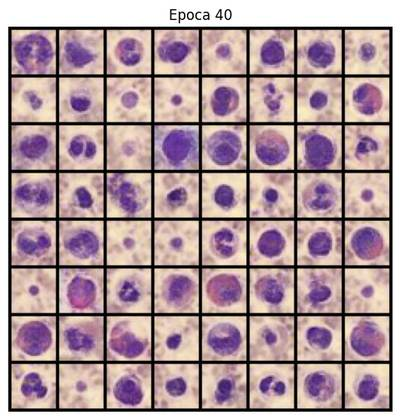

Epoch [40/100] | D_loss: 0.1823 | G_loss: 3.8255
Epoch [41/100] | D_loss: 0.0629 | G_loss: 4.2221
Epoch [42/100] | D_loss: 0.5291 | G_loss: 2.6645
Epoch [43/100] | D_loss: 0.1585 | G_loss: 3.3613
Epoch [44/100] | D_loss: 0.1376 | G_loss: 3.7173
Epoch [45/100] | D_loss: 0.5093 | G_loss: 1.9793
Epoch [46/100] | D_loss: 0.0797 | G_loss: 4.1244
Epoch [47/100] | D_loss: 0.0803 | G_loss: 5.0185
Epoch [48/100] | D_loss: 0.6866 | G_loss: 3.2362
Epoch [49/100] | D_loss: 0.1905 | G_loss: 4.8681


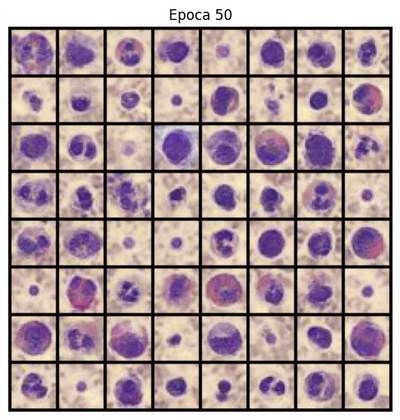

Epoch [50/100] | D_loss: 0.0583 | G_loss: 4.8874
Epoch [51/100] | D_loss: 0.0930 | G_loss: 4.4099
Epoch [52/100] | D_loss: 0.4876 | G_loss: 2.8362
Epoch [53/100] | D_loss: 0.2009 | G_loss: 3.7233
Epoch [54/100] | D_loss: 0.3263 | G_loss: 3.1081
Epoch [55/100] | D_loss: 0.1164 | G_loss: 4.2246
Epoch [56/100] | D_loss: 0.0373 | G_loss: 5.4913
Epoch [57/100] | D_loss: 0.0707 | G_loss: 5.2863
Epoch [58/100] | D_loss: 0.0404 | G_loss: 5.4856
Epoch [59/100] | D_loss: 0.1002 | G_loss: 5.5337


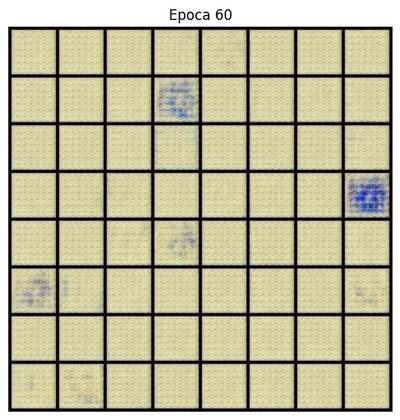

Epoch [60/100] | D_loss: 0.1033 | G_loss: 5.0796
Epoch [61/100] | D_loss: 0.1855 | G_loss: 6.5673
Epoch [62/100] | D_loss: 0.0650 | G_loss: 8.7673
Epoch [63/100] | D_loss: 0.4403 | G_loss: 10.0019
Epoch [64/100] | D_loss: 0.0299 | G_loss: 5.1881
Epoch [65/100] | D_loss: 0.4423 | G_loss: 5.4454
Epoch [66/100] | D_loss: 0.0242 | G_loss: 5.4321
Epoch [67/100] | D_loss: 0.0383 | G_loss: 5.3863
Epoch [68/100] | D_loss: 0.1035 | G_loss: 5.4256
Epoch [69/100] | D_loss: 0.2873 | G_loss: 5.7509


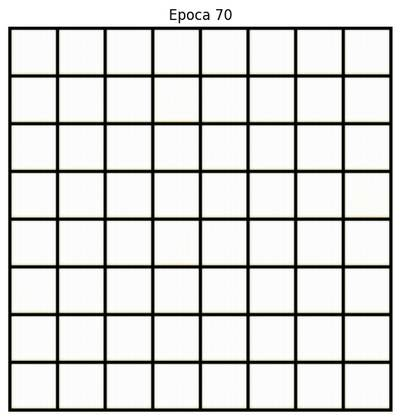

Epoch [70/100] | D_loss: 0.0619 | G_loss: 4.5638
Epoch [71/100] | D_loss: 0.0270 | G_loss: 5.9086
Epoch [72/100] | D_loss: 0.0309 | G_loss: 6.1837
Epoch [73/100] | D_loss: 0.0109 | G_loss: 6.2786
Epoch [74/100] | D_loss: 0.0605 | G_loss: 3.9923
Epoch [75/100] | D_loss: 0.0177 | G_loss: 4.4657
Epoch [76/100] | D_loss: 0.0134 | G_loss: 5.1619
Epoch [77/100] | D_loss: 0.0309 | G_loss: 5.8596
Epoch [78/100] | D_loss: 0.0205 | G_loss: 6.7750
Epoch [79/100] | D_loss: 0.0102 | G_loss: 5.4584


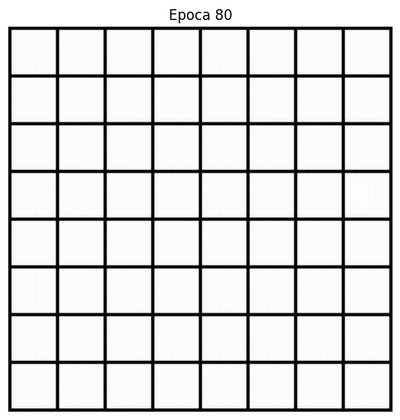

Epoch [80/100] | D_loss: 0.0247 | G_loss: 6.2849
Epoch [81/100] | D_loss: 0.0098 | G_loss: 5.9363
Epoch [82/100] | D_loss: 0.0034 | G_loss: 6.2877
Epoch [83/100] | D_loss: 0.1012 | G_loss: 5.8141
Epoch [84/100] | D_loss: 0.0275 | G_loss: 6.7260
Epoch [85/100] | D_loss: 0.0096 | G_loss: 5.8962
Epoch [86/100] | D_loss: 0.0291 | G_loss: 6.2672
Epoch [87/100] | D_loss: 0.0540 | G_loss: 6.5786
Epoch [88/100] | D_loss: 0.0054 | G_loss: 6.2714
Epoch [89/100] | D_loss: 0.0101 | G_loss: 6.7911


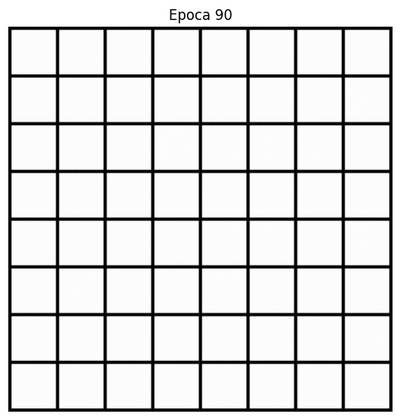

Epoch [90/100] | D_loss: 0.0082 | G_loss: 5.2397
Epoch [91/100] | D_loss: 0.0058 | G_loss: 5.5171
Epoch [92/100] | D_loss: 0.0073 | G_loss: 5.8744
Epoch [93/100] | D_loss: 0.0029 | G_loss: 6.1358
Epoch [94/100] | D_loss: 0.0027 | G_loss: 6.3473
Epoch [95/100] | D_loss: 0.0150 | G_loss: 5.5990
Epoch [96/100] | D_loss: 0.0228 | G_loss: 7.1631
Epoch [97/100] | D_loss: 0.0454 | G_loss: 7.2625
Epoch [98/100] | D_loss: 2.3650 | G_loss: 6.0204
Epoch [99/100] | D_loss: 0.5762 | G_loss: 2.5085


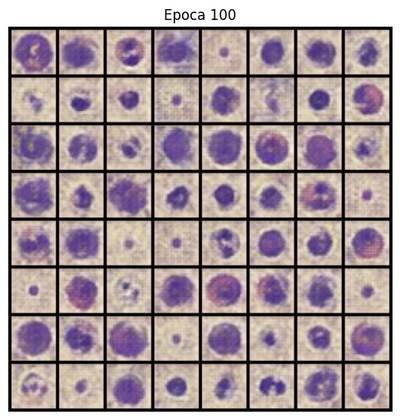

Epoch [100/100] | D_loss: 0.8558 | G_loss: 5.3055
→ FID: 251.0111

Combo 6/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 128, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0001}


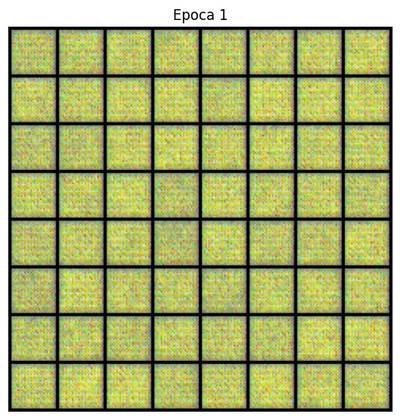

Epoch [1/100] | D_loss: 1.0549 | G_loss: 1.0759
Epoch [2/100] | D_loss: 0.9001 | G_loss: 1.2417
Epoch [3/100] | D_loss: 0.9523 | G_loss: 1.2260
Epoch [4/100] | D_loss: 0.8921 | G_loss: 1.3159
Epoch [5/100] | D_loss: 0.5659 | G_loss: 1.6469
Epoch [6/100] | D_loss: 0.6425 | G_loss: 1.6403
Epoch [7/100] | D_loss: 0.6489 | G_loss: 1.7296
Epoch [8/100] | D_loss: 1.0340 | G_loss: 1.4785
Epoch [9/100] | D_loss: 0.7996 | G_loss: 1.4775


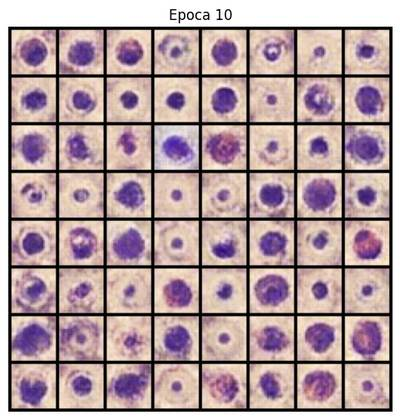

Epoch [10/100] | D_loss: 0.7017 | G_loss: 1.7538
Epoch [11/100] | D_loss: 0.7394 | G_loss: 1.3502
Epoch [12/100] | D_loss: 0.5203 | G_loss: 1.8512
Epoch [13/100] | D_loss: 0.4845 | G_loss: 1.9072
Epoch [14/100] | D_loss: 0.5258 | G_loss: 2.2316
Epoch [15/100] | D_loss: 0.6188 | G_loss: 2.2501
Epoch [16/100] | D_loss: 0.4903 | G_loss: 2.7125
Epoch [17/100] | D_loss: 0.2707 | G_loss: 2.5611
Epoch [18/100] | D_loss: 1.4046 | G_loss: 2.3346
Epoch [19/100] | D_loss: 0.2275 | G_loss: 2.5960


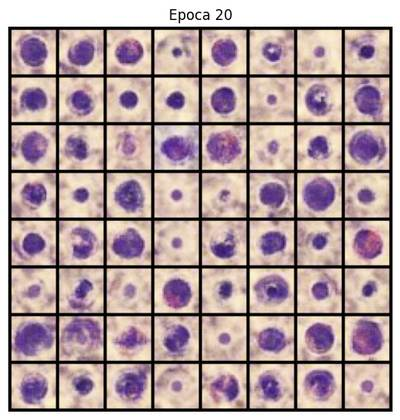

Epoch [20/100] | D_loss: 0.5603 | G_loss: 2.9992
Epoch [21/100] | D_loss: 0.4230 | G_loss: 1.7414
Epoch [22/100] | D_loss: 0.9187 | G_loss: 2.0676
Epoch [23/100] | D_loss: 0.8637 | G_loss: 2.2887
Epoch [24/100] | D_loss: 0.7468 | G_loss: 1.2442
Epoch [25/100] | D_loss: 0.8382 | G_loss: 1.8426
Epoch [26/100] | D_loss: 0.4787 | G_loss: 2.0682
Epoch [27/100] | D_loss: 0.3387 | G_loss: 2.7879
Epoch [28/100] | D_loss: 0.2253 | G_loss: 2.8165
Epoch [29/100] | D_loss: 0.2160 | G_loss: 3.0933


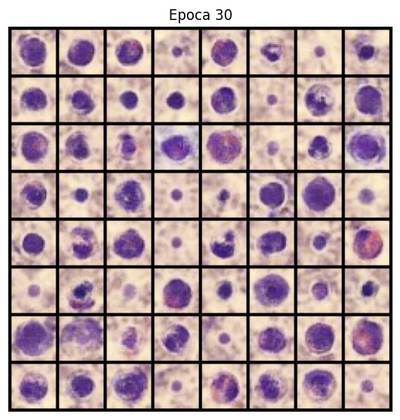

Epoch [30/100] | D_loss: 0.3614 | G_loss: 3.4814
Epoch [31/100] | D_loss: 0.2383 | G_loss: 3.0758
Epoch [32/100] | D_loss: 0.4102 | G_loss: 2.6375
Epoch [33/100] | D_loss: 0.2128 | G_loss: 3.1872
Epoch [34/100] | D_loss: 0.2465 | G_loss: 3.2655
Epoch [35/100] | D_loss: 0.2725 | G_loss: 2.6716
Epoch [36/100] | D_loss: 0.2155 | G_loss: 3.5206
Epoch [37/100] | D_loss: 0.2844 | G_loss: 2.9681
Epoch [38/100] | D_loss: 0.5405 | G_loss: 1.5416
Epoch [39/100] | D_loss: 0.7307 | G_loss: 4.1679


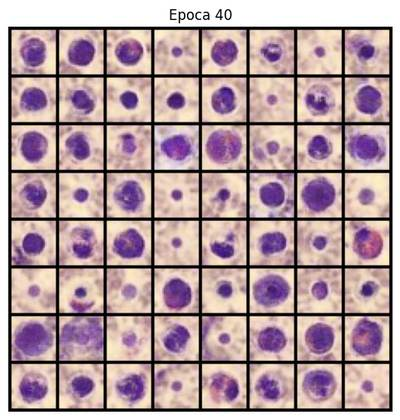

Epoch [40/100] | D_loss: 0.1184 | G_loss: 3.5309
Epoch [41/100] | D_loss: 0.4610 | G_loss: 4.3445
Epoch [42/100] | D_loss: 0.3058 | G_loss: 3.0011
Epoch [43/100] | D_loss: 0.2545 | G_loss: 3.1233
Epoch [44/100] | D_loss: 0.2505 | G_loss: 3.4108
Epoch [45/100] | D_loss: 0.3091 | G_loss: 2.7424
Epoch [46/100] | D_loss: 0.1460 | G_loss: 3.5422
Epoch [47/100] | D_loss: 0.4394 | G_loss: 2.6535
Epoch [48/100] | D_loss: 0.4938 | G_loss: 2.9699
Epoch [49/100] | D_loss: 0.1173 | G_loss: 3.9770


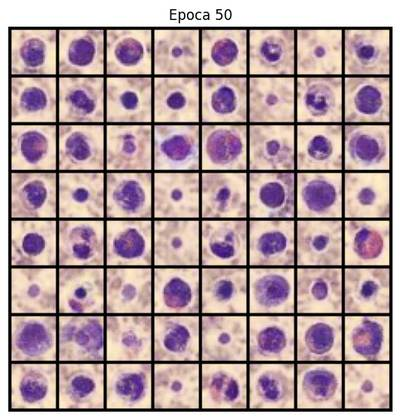

Epoch [50/100] | D_loss: 0.1668 | G_loss: 4.5363
Epoch [51/100] | D_loss: 0.7662 | G_loss: 1.9887
Epoch [52/100] | D_loss: 0.2073 | G_loss: 2.7699
Epoch [53/100] | D_loss: 0.3701 | G_loss: 1.9212
Epoch [54/100] | D_loss: 0.8319 | G_loss: 2.0439
Epoch [55/100] | D_loss: 0.1172 | G_loss: 3.4956
Epoch [56/100] | D_loss: 0.0743 | G_loss: 4.5296
Epoch [57/100] | D_loss: 0.1236 | G_loss: 3.7941
Epoch [58/100] | D_loss: 0.3388 | G_loss: 2.2938
Epoch [59/100] | D_loss: 0.6089 | G_loss: 2.3902


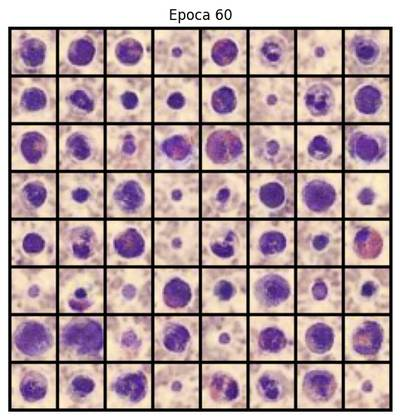

Epoch [60/100] | D_loss: 0.3739 | G_loss: 4.6323
Epoch [61/100] | D_loss: 0.4576 | G_loss: 2.3077
Epoch [62/100] | D_loss: 0.1594 | G_loss: 3.8695
Epoch [63/100] | D_loss: 0.1691 | G_loss: 4.3536
Epoch [64/100] | D_loss: 0.4339 | G_loss: 2.8599
Epoch [65/100] | D_loss: 0.4204 | G_loss: 2.1512
Epoch [66/100] | D_loss: 1.3937 | G_loss: 3.9910
Epoch [67/100] | D_loss: 0.3417 | G_loss: 2.5175
Epoch [68/100] | D_loss: 0.1190 | G_loss: 4.4621
Epoch [69/100] | D_loss: 0.3463 | G_loss: 3.3293


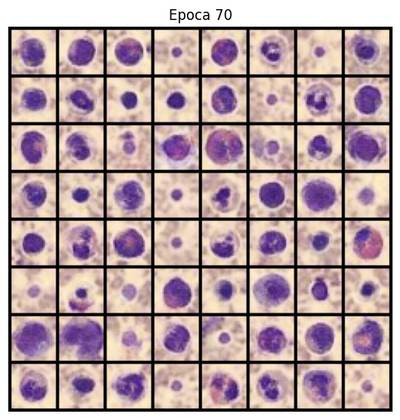

Epoch [70/100] | D_loss: 0.5862 | G_loss: 4.1503
Epoch [71/100] | D_loss: 0.2886 | G_loss: 2.8606
Epoch [72/100] | D_loss: 0.0910 | G_loss: 3.9392
Epoch [73/100] | D_loss: 0.0680 | G_loss: 4.4702
Epoch [74/100] | D_loss: 0.0911 | G_loss: 4.3418
Epoch [75/100] | D_loss: 0.3434 | G_loss: 2.8149
Epoch [76/100] | D_loss: 0.0300 | G_loss: 4.8266
Epoch [77/100] | D_loss: 0.2288 | G_loss: 3.1755
Epoch [78/100] | D_loss: 0.1237 | G_loss: 4.1505
Epoch [79/100] | D_loss: 0.1469 | G_loss: 4.0110


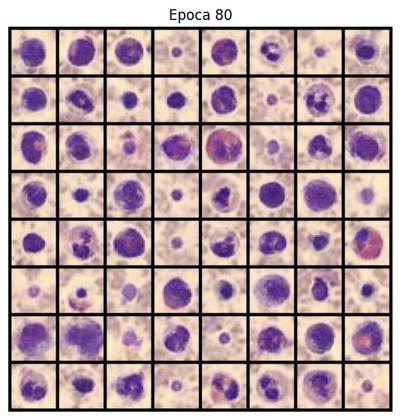

Epoch [80/100] | D_loss: 0.4725 | G_loss: 2.7263
Epoch [81/100] | D_loss: 0.0527 | G_loss: 4.7987
Epoch [82/100] | D_loss: 0.5522 | G_loss: 2.2508
Epoch [83/100] | D_loss: 0.2665 | G_loss: 2.7248
Epoch [84/100] | D_loss: 0.0369 | G_loss: 4.8283
Epoch [85/100] | D_loss: 0.2609 | G_loss: 3.5440
Epoch [86/100] | D_loss: 0.1446 | G_loss: 4.6214
Epoch [87/100] | D_loss: 0.2932 | G_loss: 4.5871
Epoch [88/100] | D_loss: 0.0536 | G_loss: 5.2287
Epoch [89/100] | D_loss: 0.1584 | G_loss: 3.3397


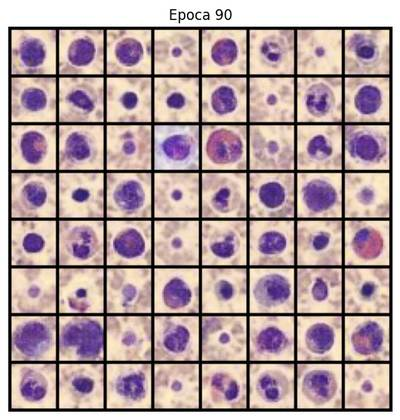

Epoch [90/100] | D_loss: 0.2783 | G_loss: 2.8678
Epoch [91/100] | D_loss: 0.2422 | G_loss: 3.3928
Epoch [92/100] | D_loss: 0.0425 | G_loss: 4.8925
Epoch [93/100] | D_loss: 0.1473 | G_loss: 4.2066
Epoch [94/100] | D_loss: 0.1048 | G_loss: 4.3682
Epoch [95/100] | D_loss: 0.1531 | G_loss: 3.6876
Epoch [96/100] | D_loss: 0.0673 | G_loss: 4.4397
Epoch [97/100] | D_loss: 0.0604 | G_loss: 5.1682
Epoch [98/100] | D_loss: 0.2898 | G_loss: 3.1052
Epoch [99/100] | D_loss: 0.3049 | G_loss: 3.4840


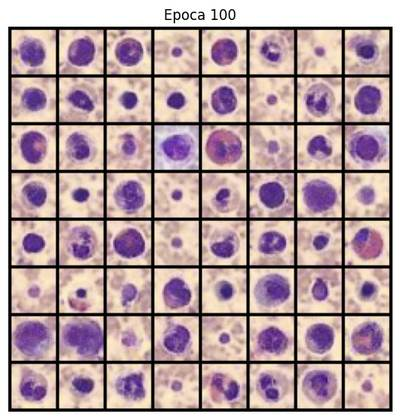

Epoch [100/100] | D_loss: 1.0548 | G_loss: 1.7822
→ FID: 129.6152

Combo 7/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 128, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0002}


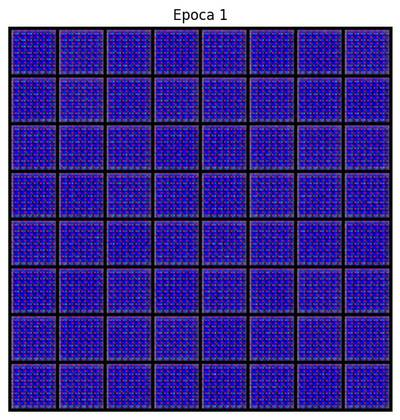

Epoch [1/100] | D_loss: 0.9374 | G_loss: 1.3450
Epoch [2/100] | D_loss: 0.7019 | G_loss: 2.0361
Epoch [3/100] | D_loss: 0.8609 | G_loss: 1.6984
Epoch [4/100] | D_loss: 0.7197 | G_loss: 1.9506
Epoch [5/100] | D_loss: 0.8805 | G_loss: 2.3843
Epoch [6/100] | D_loss: 0.3625 | G_loss: 2.4083
Epoch [7/100] | D_loss: 1.0484 | G_loss: 1.8826
Epoch [8/100] | D_loss: 0.5171 | G_loss: 2.0632
Epoch [9/100] | D_loss: 0.3015 | G_loss: 3.0976


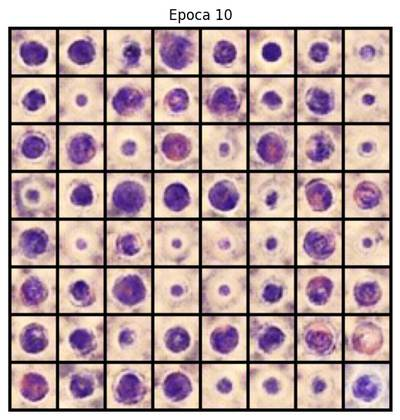

Epoch [10/100] | D_loss: 1.0585 | G_loss: 2.5294
Epoch [11/100] | D_loss: 0.3419 | G_loss: 3.3683
Epoch [12/100] | D_loss: 1.1425 | G_loss: 3.1299
Epoch [13/100] | D_loss: 0.6297 | G_loss: 2.9320
Epoch [14/100] | D_loss: 0.7082 | G_loss: 2.5452
Epoch [15/100] | D_loss: 0.4472 | G_loss: 3.3322
Epoch [16/100] | D_loss: 0.8883 | G_loss: 2.8837
Epoch [17/100] | D_loss: 0.2729 | G_loss: 3.2432
Epoch [18/100] | D_loss: 0.3650 | G_loss: 2.2237
Epoch [19/100] | D_loss: 0.5174 | G_loss: 3.8861


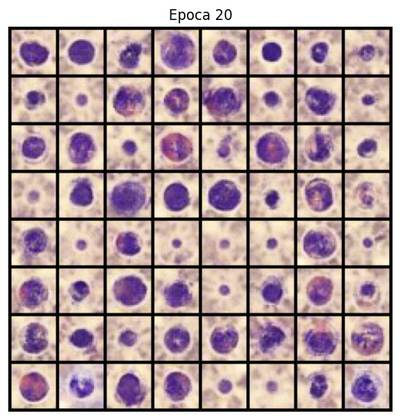

Epoch [20/100] | D_loss: 0.3511 | G_loss: 3.9589
Epoch [21/100] | D_loss: 0.2847 | G_loss: 2.8804
Epoch [22/100] | D_loss: 0.2150 | G_loss: 4.2045
Epoch [23/100] | D_loss: 0.8801 | G_loss: 2.0214
Epoch [24/100] | D_loss: 0.1013 | G_loss: 4.0626
Epoch [25/100] | D_loss: 0.0998 | G_loss: 4.1759
Epoch [26/100] | D_loss: 0.0350 | G_loss: 4.5187
Epoch [27/100] | D_loss: 0.4819 | G_loss: 2.1882
Epoch [28/100] | D_loss: 0.4072 | G_loss: 2.5858
Epoch [29/100] | D_loss: 0.2430 | G_loss: 3.0408


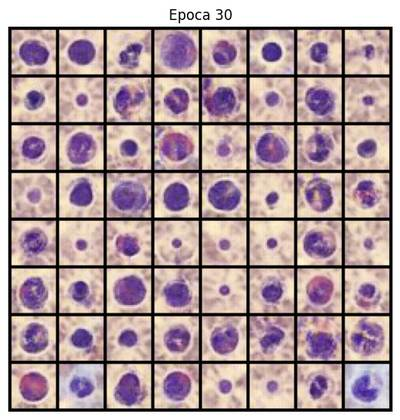

Epoch [30/100] | D_loss: 1.0830 | G_loss: 2.3816
Epoch [31/100] | D_loss: 0.2694 | G_loss: 2.9044
Epoch [32/100] | D_loss: 1.4030 | G_loss: 4.0281
Epoch [33/100] | D_loss: 0.2182 | G_loss: 3.1174
Epoch [34/100] | D_loss: 0.4081 | G_loss: 2.1298
Epoch [35/100] | D_loss: 1.3817 | G_loss: 2.8555
Epoch [36/100] | D_loss: 0.6747 | G_loss: 2.0946
Epoch [37/100] | D_loss: 0.4885 | G_loss: 3.7748
Epoch [38/100] | D_loss: 0.4028 | G_loss: 2.8608
Epoch [39/100] | D_loss: 1.0289 | G_loss: 3.3430


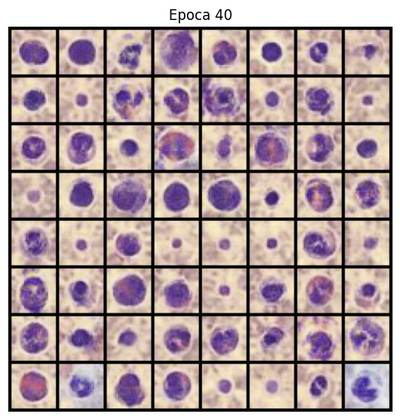

Epoch [40/100] | D_loss: 0.5091 | G_loss: 2.9074
Epoch [41/100] | D_loss: 0.4165 | G_loss: 2.8428
Epoch [42/100] | D_loss: 0.2227 | G_loss: 3.7703
Epoch [43/100] | D_loss: 0.3772 | G_loss: 5.6529
Epoch [44/100] | D_loss: 0.1336 | G_loss: 4.3215
Epoch [45/100] | D_loss: 0.3367 | G_loss: 3.5778
Epoch [46/100] | D_loss: 0.4074 | G_loss: 3.1467
Epoch [47/100] | D_loss: 0.4391 | G_loss: 3.2477
Epoch [48/100] | D_loss: 0.1497 | G_loss: 4.3192
Epoch [49/100] | D_loss: 0.4524 | G_loss: 3.9293


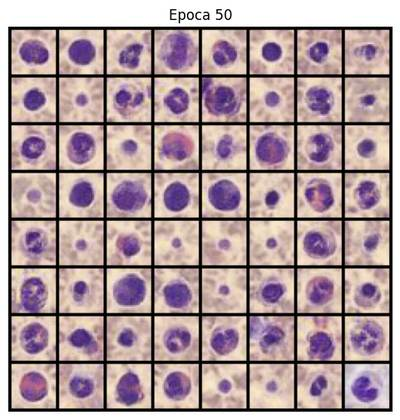

Epoch [50/100] | D_loss: 0.2301 | G_loss: 3.1754
Epoch [51/100] | D_loss: 0.9169 | G_loss: 3.5909
Epoch [52/100] | D_loss: 0.3948 | G_loss: 3.1212
Epoch [53/100] | D_loss: 0.0643 | G_loss: 4.7532
Epoch [54/100] | D_loss: 0.0514 | G_loss: 4.8598
Epoch [55/100] | D_loss: 1.0282 | G_loss: 3.1488
Epoch [56/100] | D_loss: 0.3441 | G_loss: 3.2869
Epoch [57/100] | D_loss: 0.1399 | G_loss: 4.2733
Epoch [58/100] | D_loss: 0.0859 | G_loss: 4.6867
Epoch [59/100] | D_loss: 1.1119 | G_loss: 5.5558


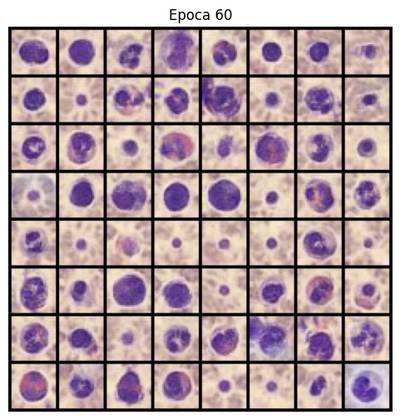

Epoch [60/100] | D_loss: 0.0418 | G_loss: 5.4196
Epoch [61/100] | D_loss: 1.6190 | G_loss: 3.2919
Epoch [62/100] | D_loss: 0.0968 | G_loss: 4.6895
Epoch [63/100] | D_loss: 0.0505 | G_loss: 4.9149
Epoch [64/100] | D_loss: 0.8127 | G_loss: 6.3064
Epoch [65/100] | D_loss: 0.2273 | G_loss: 4.1429
Epoch [66/100] | D_loss: 0.2867 | G_loss: 3.9288
Epoch [67/100] | D_loss: 0.0916 | G_loss: 4.2047
Epoch [68/100] | D_loss: 0.0629 | G_loss: 4.9063
Epoch [69/100] | D_loss: 0.0426 | G_loss: 5.3737


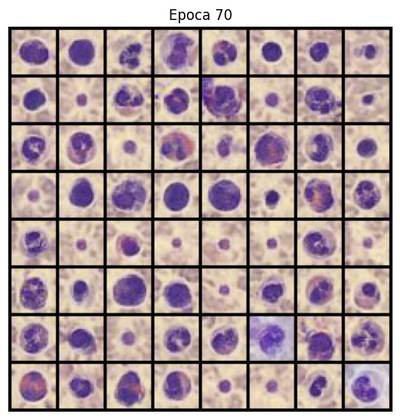

Epoch [70/100] | D_loss: 0.0595 | G_loss: 4.1718
Epoch [71/100] | D_loss: 0.0694 | G_loss: 4.4194
Epoch [72/100] | D_loss: 0.3603 | G_loss: 3.9626
Epoch [73/100] | D_loss: 0.3148 | G_loss: 4.1344
Epoch [74/100] | D_loss: 0.1307 | G_loss: 4.8101
Epoch [75/100] | D_loss: 0.0507 | G_loss: 4.8955
Epoch [76/100] | D_loss: 0.0990 | G_loss: 5.0361
Epoch [77/100] | D_loss: 0.5868 | G_loss: 4.8314
Epoch [78/100] | D_loss: 0.2083 | G_loss: 4.3037
Epoch [79/100] | D_loss: 0.5356 | G_loss: 3.1459


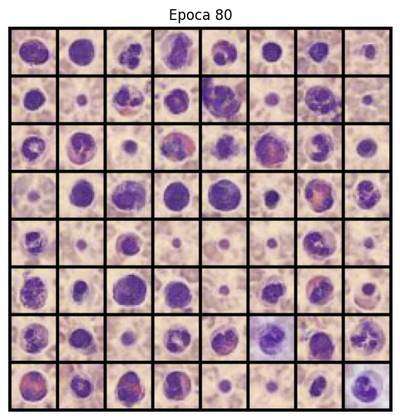

Epoch [80/100] | D_loss: 0.2741 | G_loss: 6.3311
Epoch [81/100] | D_loss: 0.1734 | G_loss: 5.0457
Epoch [82/100] | D_loss: 0.0760 | G_loss: 5.2603
Epoch [83/100] | D_loss: 0.1215 | G_loss: 4.6459
Epoch [84/100] | D_loss: 0.3622 | G_loss: 4.5719
Epoch [85/100] | D_loss: 1.3127 | G_loss: 4.5120
Epoch [86/100] | D_loss: 0.2507 | G_loss: 4.7161
Epoch [87/100] | D_loss: 0.0986 | G_loss: 4.1968
Epoch [88/100] | D_loss: 1.0642 | G_loss: 2.6798
Epoch [89/100] | D_loss: 0.1347 | G_loss: 4.7367


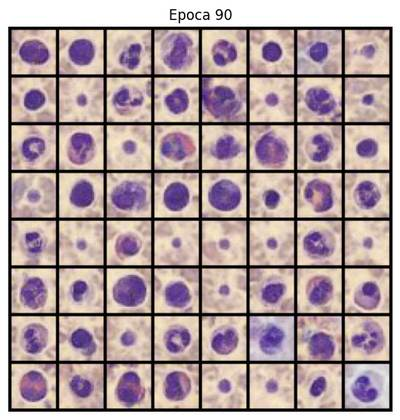

Epoch [90/100] | D_loss: 0.7332 | G_loss: 3.9314
Epoch [91/100] | D_loss: 0.6586 | G_loss: 3.1697
Epoch [92/100] | D_loss: 0.1774 | G_loss: 5.9225
Epoch [93/100] | D_loss: 0.0628 | G_loss: 4.9499
Epoch [94/100] | D_loss: 1.6953 | G_loss: 4.5257
Epoch [95/100] | D_loss: 0.0918 | G_loss: 5.4710
Epoch [96/100] | D_loss: 0.3443 | G_loss: 3.6817
Epoch [97/100] | D_loss: 0.3550 | G_loss: 3.9191
Epoch [98/100] | D_loss: 0.0556 | G_loss: 5.2198
Epoch [99/100] | D_loss: 0.1114 | G_loss: 6.0490


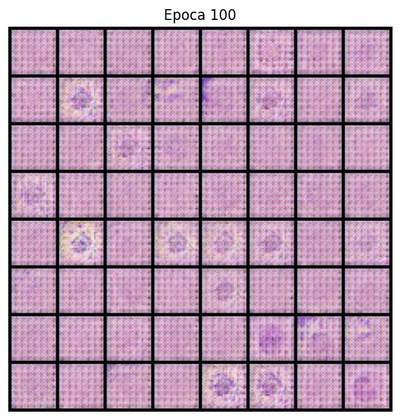

Epoch [100/100] | D_loss: 0.0473 | G_loss: 6.1409
→ FID: 418.6510

Combo 8/16: {'beta1': 0.5, 'epochs': 100, 'feature_d': 128, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0001}


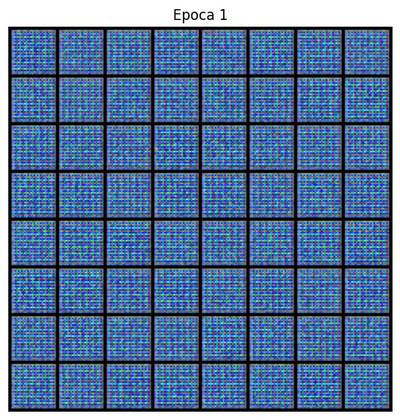

Epoch [1/100] | D_loss: 1.0805 | G_loss: 1.0621
Epoch [2/100] | D_loss: 1.0272 | G_loss: 1.4703
Epoch [3/100] | D_loss: 0.5715 | G_loss: 1.7307
Epoch [4/100] | D_loss: 0.8459 | G_loss: 1.4413
Epoch [5/100] | D_loss: 0.7500 | G_loss: 1.4318
Epoch [6/100] | D_loss: 0.6938 | G_loss: 1.5739
Epoch [7/100] | D_loss: 0.5840 | G_loss: 1.8006
Epoch [8/100] | D_loss: 0.8278 | G_loss: 2.1075
Epoch [9/100] | D_loss: 0.4552 | G_loss: 2.4111


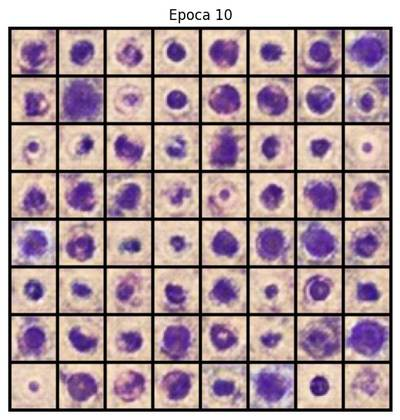

Epoch [10/100] | D_loss: 0.4899 | G_loss: 1.8836
Epoch [11/100] | D_loss: 0.9561 | G_loss: 2.6618
Epoch [12/100] | D_loss: 0.9815 | G_loss: 2.4490
Epoch [13/100] | D_loss: 0.4795 | G_loss: 2.8374
Epoch [14/100] | D_loss: 0.5758 | G_loss: 2.5072
Epoch [15/100] | D_loss: 0.6149 | G_loss: 1.7784
Epoch [16/100] | D_loss: 0.2540 | G_loss: 2.9325
Epoch [17/100] | D_loss: 1.0483 | G_loss: 3.2159
Epoch [18/100] | D_loss: 0.9456 | G_loss: 1.3057
Epoch [19/100] | D_loss: 0.8405 | G_loss: 2.1981


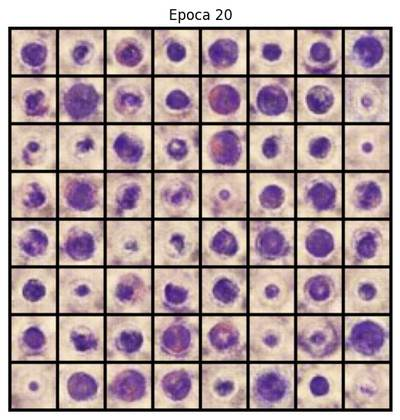

Epoch [20/100] | D_loss: 0.6347 | G_loss: 1.4874
Epoch [21/100] | D_loss: 0.3501 | G_loss: 2.8456
Epoch [22/100] | D_loss: 0.2541 | G_loss: 3.7776
Epoch [23/100] | D_loss: 0.4433 | G_loss: 3.4357
Epoch [24/100] | D_loss: 0.1651 | G_loss: 3.2445
Epoch [25/100] | D_loss: 0.3287 | G_loss: 2.6606
Epoch [26/100] | D_loss: 0.2744 | G_loss: 2.9296
Epoch [27/100] | D_loss: 0.2795 | G_loss: 3.2218
Epoch [28/100] | D_loss: 0.5324 | G_loss: 2.0448
Epoch [29/100] | D_loss: 0.4471 | G_loss: 3.6974


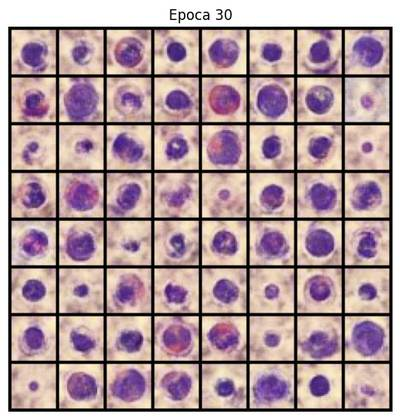

Epoch [30/100] | D_loss: 0.1656 | G_loss: 2.8555
Epoch [31/100] | D_loss: 0.2740 | G_loss: 2.8810
Epoch [32/100] | D_loss: 0.9165 | G_loss: 1.5113
Epoch [33/100] | D_loss: 0.3913 | G_loss: 2.4465
Epoch [34/100] | D_loss: 0.2069 | G_loss: 3.5711
Epoch [35/100] | D_loss: 0.2314 | G_loss: 2.9439
Epoch [36/100] | D_loss: 0.6268 | G_loss: 2.4488
Epoch [37/100] | D_loss: 0.2189 | G_loss: 3.5052
Epoch [38/100] | D_loss: 0.3443 | G_loss: 2.2779
Epoch [39/100] | D_loss: 0.2245 | G_loss: 2.6339


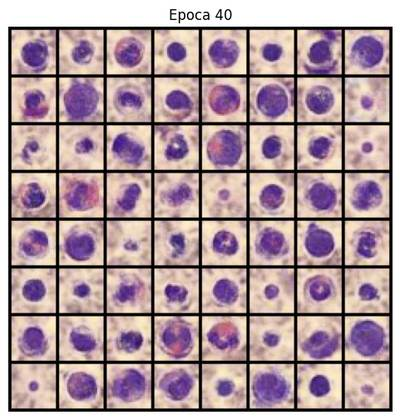

Epoch [40/100] | D_loss: 0.1313 | G_loss: 3.6722
Epoch [41/100] | D_loss: 0.5557 | G_loss: 2.2686
Epoch [42/100] | D_loss: 0.2100 | G_loss: 3.1808
Epoch [43/100] | D_loss: 0.0942 | G_loss: 3.7629
Epoch [44/100] | D_loss: 0.2671 | G_loss: 2.9566
Epoch [45/100] | D_loss: 0.3885 | G_loss: 4.6552
Epoch [46/100] | D_loss: 0.3443 | G_loss: 4.0079
Epoch [47/100] | D_loss: 0.3550 | G_loss: 2.4480
Epoch [48/100] | D_loss: 0.2709 | G_loss: 3.1580
Epoch [49/100] | D_loss: 1.1363 | G_loss: 1.2211


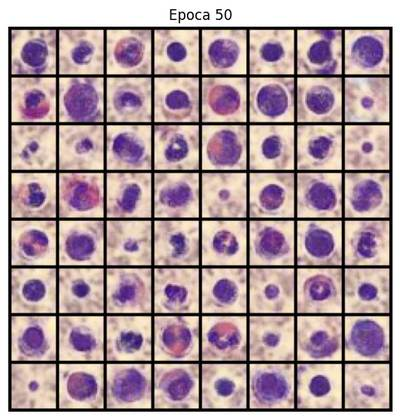

Epoch [50/100] | D_loss: 0.2761 | G_loss: 2.7332
Epoch [51/100] | D_loss: 0.4736 | G_loss: 1.7128
Epoch [52/100] | D_loss: 0.2326 | G_loss: 2.9614
Epoch [53/100] | D_loss: 0.1690 | G_loss: 3.9076
Epoch [54/100] | D_loss: 0.1693 | G_loss: 3.7324
Epoch [55/100] | D_loss: 0.0942 | G_loss: 3.9235
Epoch [56/100] | D_loss: 1.0222 | G_loss: 3.4560
Epoch [57/100] | D_loss: 0.3288 | G_loss: 3.0271
Epoch [58/100] | D_loss: 0.0949 | G_loss: 3.9394
Epoch [59/100] | D_loss: 0.3274 | G_loss: 3.0943


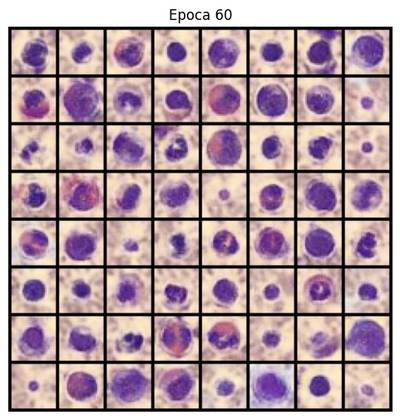

Epoch [60/100] | D_loss: 0.1057 | G_loss: 3.7616
Epoch [61/100] | D_loss: 0.3107 | G_loss: 2.9822
Epoch [62/100] | D_loss: 0.0950 | G_loss: 3.9526
Epoch [63/100] | D_loss: 0.4632 | G_loss: 3.2175
Epoch [64/100] | D_loss: 0.6055 | G_loss: 2.9828
Epoch [65/100] | D_loss: 0.0875 | G_loss: 3.9831
Epoch [66/100] | D_loss: 0.1445 | G_loss: 3.9753
Epoch [67/100] | D_loss: 0.0950 | G_loss: 4.3639
Epoch [68/100] | D_loss: 0.1439 | G_loss: 3.7496
Epoch [69/100] | D_loss: 0.1444 | G_loss: 3.0619


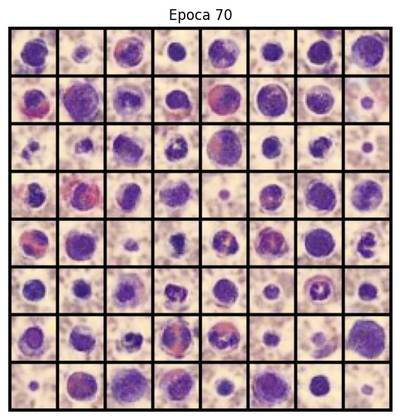

Epoch [70/100] | D_loss: 0.1383 | G_loss: 4.0171
Epoch [71/100] | D_loss: 0.1008 | G_loss: 3.9832
Epoch [72/100] | D_loss: 0.1434 | G_loss: 4.0919
Epoch [73/100] | D_loss: 0.4979 | G_loss: 1.8227
Epoch [74/100] | D_loss: 0.1386 | G_loss: 4.0841
Epoch [75/100] | D_loss: 0.3347 | G_loss: 5.8639
Epoch [76/100] | D_loss: 0.1721 | G_loss: 3.5000
Epoch [77/100] | D_loss: 0.5849 | G_loss: 4.1884
Epoch [78/100] | D_loss: 1.0435 | G_loss: 1.4606
Epoch [79/100] | D_loss: 0.1992 | G_loss: 4.1015


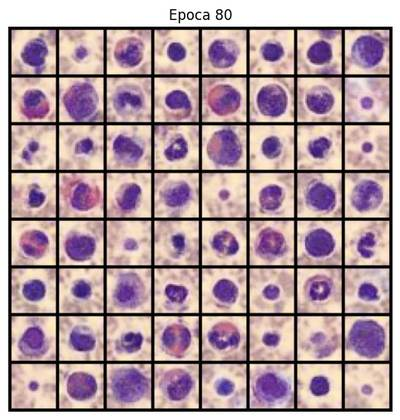

Epoch [80/100] | D_loss: 0.9149 | G_loss: 2.5892
Epoch [81/100] | D_loss: 0.7132 | G_loss: 4.1268
Epoch [82/100] | D_loss: 0.4504 | G_loss: 4.0943
Epoch [83/100] | D_loss: 0.3045 | G_loss: 2.9075
Epoch [84/100] | D_loss: 0.3005 | G_loss: 2.3938
Epoch [85/100] | D_loss: 0.1682 | G_loss: 3.9102
Epoch [86/100] | D_loss: 0.1492 | G_loss: 3.5970
Epoch [87/100] | D_loss: 0.0466 | G_loss: 5.0774
Epoch [88/100] | D_loss: 0.3787 | G_loss: 4.1614
Epoch [89/100] | D_loss: 0.2765 | G_loss: 4.5540


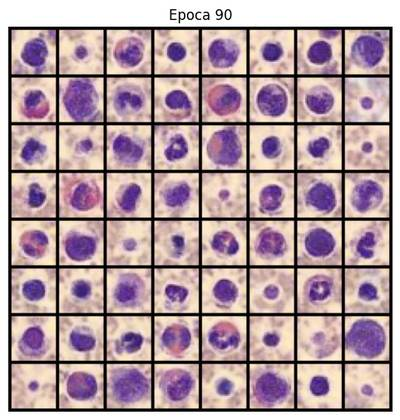

Epoch [90/100] | D_loss: 0.2749 | G_loss: 2.8610
Epoch [91/100] | D_loss: 0.1430 | G_loss: 4.1590
Epoch [92/100] | D_loss: 0.0925 | G_loss: 4.6161
Epoch [93/100] | D_loss: 0.3757 | G_loss: 6.1519
Epoch [94/100] | D_loss: 0.0485 | G_loss: 4.4936
Epoch [95/100] | D_loss: 0.0494 | G_loss: 4.9860
Epoch [96/100] | D_loss: 0.4559 | G_loss: 2.1525
Epoch [97/100] | D_loss: 0.1208 | G_loss: 4.4343
Epoch [98/100] | D_loss: 0.5068 | G_loss: 3.8800
Epoch [99/100] | D_loss: 0.8085 | G_loss: 6.2068


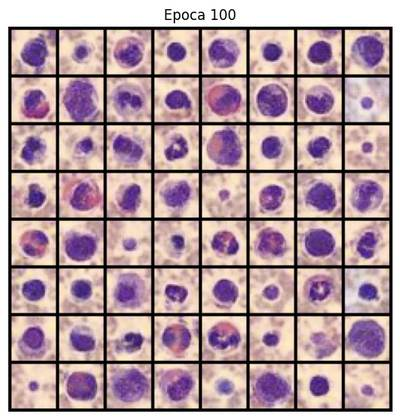

Epoch [100/100] | D_loss: 0.1269 | G_loss: 4.2422
→ FID: 129.4573

Combo 9/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 64, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0002}


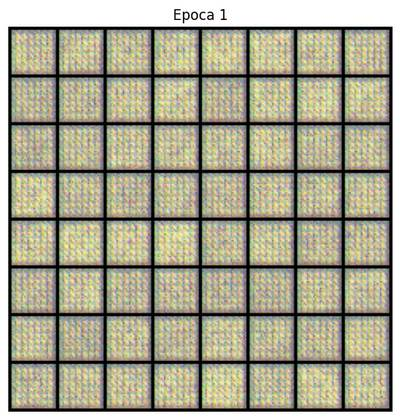

Epoch [1/100] | D_loss: 1.0989 | G_loss: 1.0346
Epoch [2/100] | D_loss: 1.1939 | G_loss: 0.9507
Epoch [3/100] | D_loss: 0.9285 | G_loss: 1.1761
Epoch [4/100] | D_loss: 1.0842 | G_loss: 1.2110
Epoch [5/100] | D_loss: 1.0777 | G_loss: 1.2852
Epoch [6/100] | D_loss: 0.9765 | G_loss: 1.5875
Epoch [7/100] | D_loss: 0.9423 | G_loss: 1.4578
Epoch [8/100] | D_loss: 0.7465 | G_loss: 1.7964
Epoch [9/100] | D_loss: 0.6645 | G_loss: 2.1375


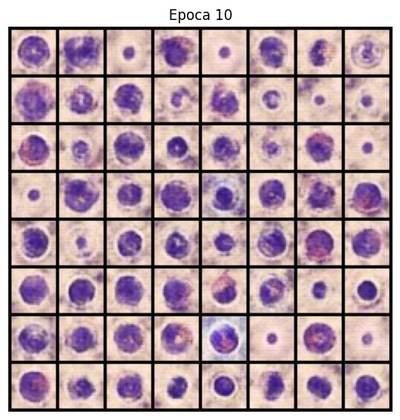

Epoch [10/100] | D_loss: 1.2783 | G_loss: 1.8183
Epoch [11/100] | D_loss: 0.9187 | G_loss: 1.0967
Epoch [12/100] | D_loss: 0.3830 | G_loss: 2.6157
Epoch [13/100] | D_loss: 1.1949 | G_loss: 1.2710
Epoch [14/100] | D_loss: 1.1163 | G_loss: 1.7268
Epoch [15/100] | D_loss: 0.5644 | G_loss: 2.8642
Epoch [16/100] | D_loss: 0.7977 | G_loss: 1.8422
Epoch [17/100] | D_loss: 0.3998 | G_loss: 2.5173
Epoch [18/100] | D_loss: 0.5258 | G_loss: 2.9323
Epoch [19/100] | D_loss: 0.4119 | G_loss: 2.7872


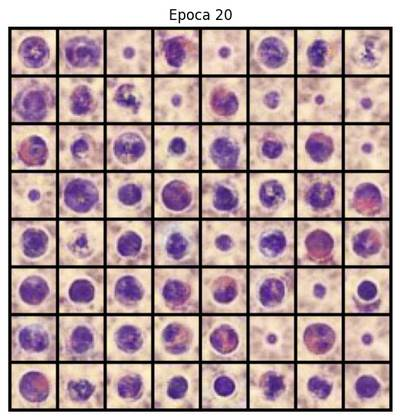

Epoch [20/100] | D_loss: 0.5358 | G_loss: 3.0360
Epoch [21/100] | D_loss: 0.8002 | G_loss: 3.3008
Epoch [22/100] | D_loss: 0.3551 | G_loss: 2.8728
Epoch [23/100] | D_loss: 0.3455 | G_loss: 3.2391
Epoch [24/100] | D_loss: 0.3753 | G_loss: 3.0171
Epoch [25/100] | D_loss: 0.3900 | G_loss: 3.6833
Epoch [26/100] | D_loss: 1.6268 | G_loss: 2.2150
Epoch [27/100] | D_loss: 0.5591 | G_loss: 3.8470
Epoch [28/100] | D_loss: 0.8001 | G_loss: 2.6732
Epoch [29/100] | D_loss: 0.6482 | G_loss: 2.0344


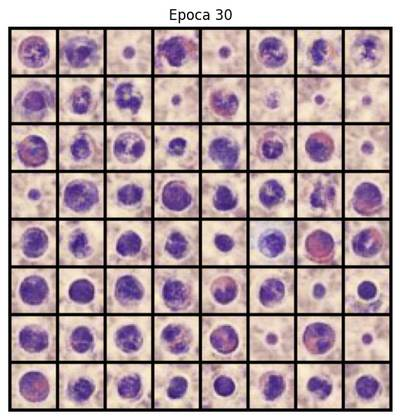

Epoch [30/100] | D_loss: 0.2095 | G_loss: 2.9177
Epoch [31/100] | D_loss: 1.3589 | G_loss: 2.3116
Epoch [32/100] | D_loss: 0.5453 | G_loss: 2.1165
Epoch [33/100] | D_loss: 0.2648 | G_loss: 3.6328
Epoch [34/100] | D_loss: 0.6003 | G_loss: 3.2711
Epoch [35/100] | D_loss: 0.3360 | G_loss: 2.8679
Epoch [36/100] | D_loss: 0.3369 | G_loss: 3.5737
Epoch [37/100] | D_loss: 0.9840 | G_loss: 3.4405
Epoch [38/100] | D_loss: 0.3721 | G_loss: 3.7993
Epoch [39/100] | D_loss: 0.4056 | G_loss: 3.2539


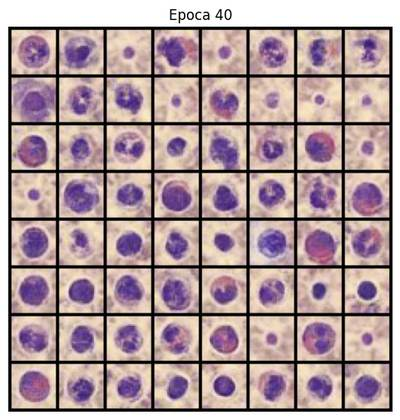

Epoch [40/100] | D_loss: 0.5777 | G_loss: 2.2657
Epoch [41/100] | D_loss: 0.7876 | G_loss: 2.2150
Epoch [42/100] | D_loss: 0.2014 | G_loss: 3.9678
Epoch [43/100] | D_loss: 0.2124 | G_loss: 4.1470
Epoch [44/100] | D_loss: 0.5245 | G_loss: 3.8260
Epoch [45/100] | D_loss: 0.3751 | G_loss: 4.0223
Epoch [46/100] | D_loss: 0.9875 | G_loss: 3.8106
Epoch [47/100] | D_loss: 0.2825 | G_loss: 3.2469
Epoch [48/100] | D_loss: 0.4181 | G_loss: 4.2122
Epoch [49/100] | D_loss: 0.2290 | G_loss: 3.0423


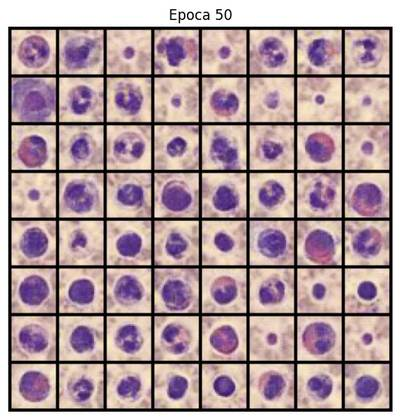

Epoch [50/100] | D_loss: 0.3732 | G_loss: 3.6277
Epoch [51/100] | D_loss: 0.2870 | G_loss: 4.2857
Epoch [52/100] | D_loss: 0.6168 | G_loss: 2.2355
Epoch [53/100] | D_loss: 0.1929 | G_loss: 4.2040
Epoch [54/100] | D_loss: 0.6645 | G_loss: 4.5807
Epoch [55/100] | D_loss: 0.1537 | G_loss: 4.0733
Epoch [56/100] | D_loss: 1.3942 | G_loss: 3.3839
Epoch [57/100] | D_loss: 0.8287 | G_loss: 3.1822
Epoch [58/100] | D_loss: 1.0961 | G_loss: 2.6373
Epoch [59/100] | D_loss: 0.1114 | G_loss: 4.2059


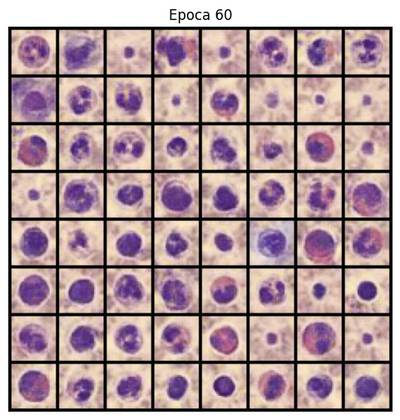

Epoch [60/100] | D_loss: 0.2545 | G_loss: 4.1351
Epoch [61/100] | D_loss: 0.1825 | G_loss: 4.5624
Epoch [62/100] | D_loss: 0.0791 | G_loss: 4.2029
Epoch [63/100] | D_loss: 0.1958 | G_loss: 3.9977
Epoch [64/100] | D_loss: 1.5074 | G_loss: 1.3773
Epoch [65/100] | D_loss: 1.0381 | G_loss: 4.4880
Epoch [66/100] | D_loss: 1.7902 | G_loss: 3.2621
Epoch [67/100] | D_loss: 0.2326 | G_loss: 5.2039
Epoch [68/100] | D_loss: 0.5968 | G_loss: 3.3153
Epoch [69/100] | D_loss: 0.5367 | G_loss: 4.0343


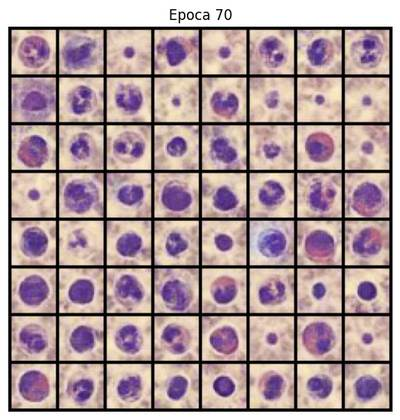

Epoch [70/100] | D_loss: 0.2066 | G_loss: 3.1193
Epoch [71/100] | D_loss: 1.1407 | G_loss: 5.5450
Epoch [72/100] | D_loss: 0.1395 | G_loss: 4.3577
Epoch [73/100] | D_loss: 0.1304 | G_loss: 4.6275
Epoch [74/100] | D_loss: 0.6829 | G_loss: 2.9437
Epoch [75/100] | D_loss: 0.2641 | G_loss: 4.5757
Epoch [76/100] | D_loss: 0.1966 | G_loss: 3.3563
Epoch [77/100] | D_loss: 0.7069 | G_loss: 3.7614
Epoch [78/100] | D_loss: 0.2869 | G_loss: 4.3645
Epoch [79/100] | D_loss: 0.3776 | G_loss: 5.2685


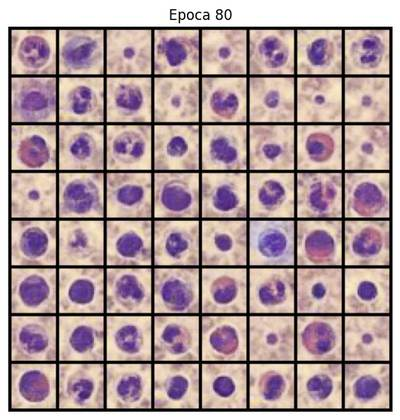

Epoch [80/100] | D_loss: 0.1180 | G_loss: 3.7340
Epoch [81/100] | D_loss: 0.2965 | G_loss: 4.2272
Epoch [82/100] | D_loss: 1.2085 | G_loss: 3.3318
Epoch [83/100] | D_loss: 0.2525 | G_loss: 5.7602
Epoch [84/100] | D_loss: 0.1902 | G_loss: 4.6026
Epoch [85/100] | D_loss: 0.6103 | G_loss: 2.7057
Epoch [86/100] | D_loss: 0.0541 | G_loss: 4.9108
Epoch [87/100] | D_loss: 0.3737 | G_loss: 5.7708
Epoch [88/100] | D_loss: 0.1338 | G_loss: 4.8807
Epoch [89/100] | D_loss: 0.3906 | G_loss: 3.7940


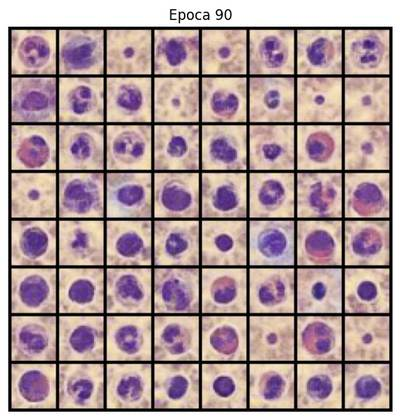

Epoch [90/100] | D_loss: 0.2072 | G_loss: 4.3092
Epoch [91/100] | D_loss: 0.3594 | G_loss: 3.3066
Epoch [92/100] | D_loss: 0.2530 | G_loss: 4.7275
Epoch [93/100] | D_loss: 0.3397 | G_loss: 2.7445
Epoch [94/100] | D_loss: 0.9378 | G_loss: 2.5997
Epoch [95/100] | D_loss: 0.1541 | G_loss: 4.6199
Epoch [96/100] | D_loss: 0.3365 | G_loss: 4.8478
Epoch [97/100] | D_loss: 0.1541 | G_loss: 4.3372
Epoch [98/100] | D_loss: 0.2740 | G_loss: 3.0848
Epoch [99/100] | D_loss: 0.2651 | G_loss: 3.9960


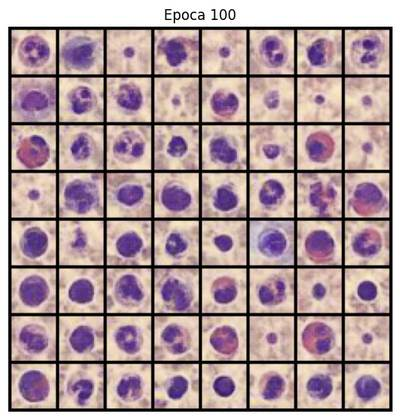

Epoch [100/100] | D_loss: 0.8256 | G_loss: 2.8337
→ FID: 170.3987

Combo 10/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 64, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0001}


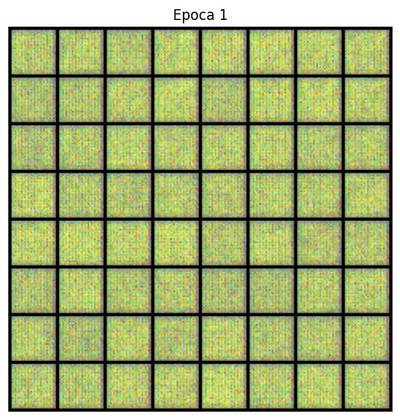

Epoch [1/100] | D_loss: 1.2190 | G_loss: 0.8882
Epoch [2/100] | D_loss: 1.0735 | G_loss: 1.0637
Epoch [3/100] | D_loss: 1.1417 | G_loss: 1.0149
Epoch [4/100] | D_loss: 1.0885 | G_loss: 1.0540
Epoch [5/100] | D_loss: 1.1478 | G_loss: 1.2020
Epoch [6/100] | D_loss: 0.9023 | G_loss: 1.3549
Epoch [7/100] | D_loss: 1.0204 | G_loss: 1.2402
Epoch [8/100] | D_loss: 0.9510 | G_loss: 1.3308
Epoch [9/100] | D_loss: 0.9357 | G_loss: 1.6069


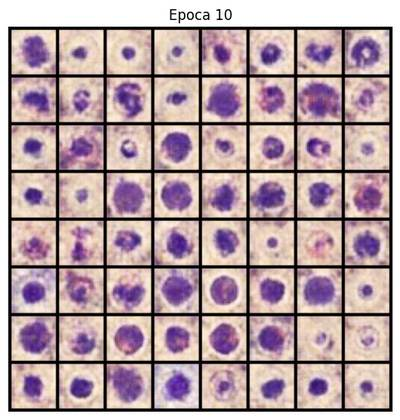

Epoch [10/100] | D_loss: 1.1374 | G_loss: 1.2071
Epoch [11/100] | D_loss: 0.8352 | G_loss: 1.3805
Epoch [12/100] | D_loss: 1.1837 | G_loss: 1.1062
Epoch [13/100] | D_loss: 1.1374 | G_loss: 1.6216
Epoch [14/100] | D_loss: 1.0098 | G_loss: 1.6140
Epoch [15/100] | D_loss: 1.0624 | G_loss: 1.0797
Epoch [16/100] | D_loss: 0.7660 | G_loss: 1.7854
Epoch [17/100] | D_loss: 0.7824 | G_loss: 1.7424
Epoch [18/100] | D_loss: 0.4472 | G_loss: 2.1757
Epoch [19/100] | D_loss: 0.6184 | G_loss: 1.5545


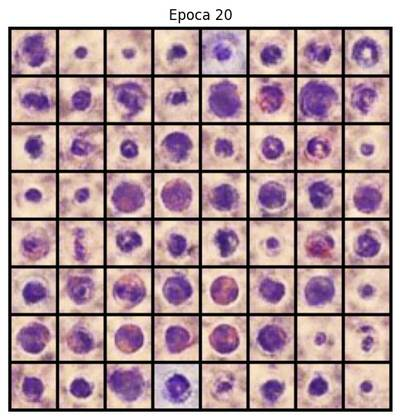

Epoch [20/100] | D_loss: 1.9369 | G_loss: 2.5478
Epoch [21/100] | D_loss: 1.6150 | G_loss: 1.8368
Epoch [22/100] | D_loss: 0.6811 | G_loss: 2.7308
Epoch [23/100] | D_loss: 0.8182 | G_loss: 1.5534
Epoch [24/100] | D_loss: 0.4031 | G_loss: 2.2822
Epoch [25/100] | D_loss: 0.7268 | G_loss: 2.3488
Epoch [26/100] | D_loss: 1.5728 | G_loss: 1.5878
Epoch [27/100] | D_loss: 0.4547 | G_loss: 2.2744
Epoch [28/100] | D_loss: 0.6629 | G_loss: 0.7299
Epoch [29/100] | D_loss: 0.5251 | G_loss: 2.0624


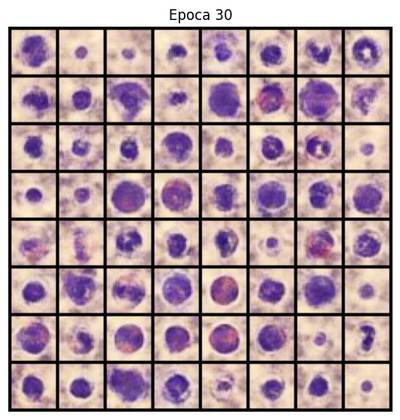

Epoch [30/100] | D_loss: 0.3991 | G_loss: 2.6336
Epoch [31/100] | D_loss: 0.8073 | G_loss: 1.8881
Epoch [32/100] | D_loss: 0.6725 | G_loss: 2.6296
Epoch [33/100] | D_loss: 0.6608 | G_loss: 1.6386
Epoch [34/100] | D_loss: 0.5633 | G_loss: 2.4478
Epoch [35/100] | D_loss: 0.4844 | G_loss: 2.8005
Epoch [36/100] | D_loss: 0.4366 | G_loss: 2.6971
Epoch [37/100] | D_loss: 0.6817 | G_loss: 2.0867
Epoch [38/100] | D_loss: 0.4308 | G_loss: 2.2027
Epoch [39/100] | D_loss: 1.0803 | G_loss: 1.4445


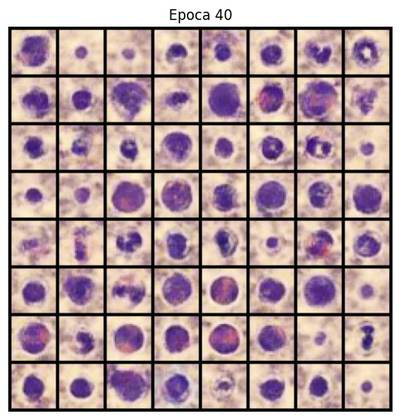

Epoch [40/100] | D_loss: 0.2800 | G_loss: 2.9563
Epoch [41/100] | D_loss: 0.3303 | G_loss: 3.1020
Epoch [42/100] | D_loss: 0.2260 | G_loss: 3.4277
Epoch [43/100] | D_loss: 0.2071 | G_loss: 3.1486
Epoch [44/100] | D_loss: 0.3879 | G_loss: 3.6407
Epoch [45/100] | D_loss: 0.3203 | G_loss: 3.2630
Epoch [46/100] | D_loss: 0.2678 | G_loss: 3.3582
Epoch [47/100] | D_loss: 1.1662 | G_loss: 2.1821
Epoch [48/100] | D_loss: 0.8710 | G_loss: 2.4146
Epoch [49/100] | D_loss: 0.5576 | G_loss: 3.2238


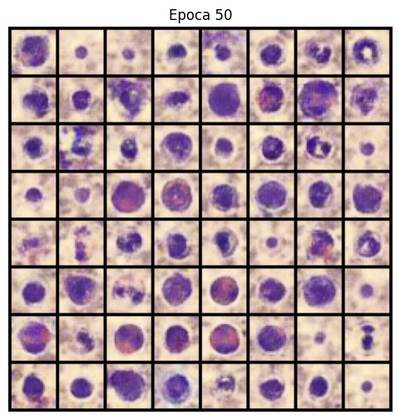

Epoch [50/100] | D_loss: 0.2164 | G_loss: 2.8661
Epoch [51/100] | D_loss: 0.2683 | G_loss: 3.2089
Epoch [52/100] | D_loss: 0.3098 | G_loss: 3.0924
Epoch [53/100] | D_loss: 0.4764 | G_loss: 2.5418
Epoch [54/100] | D_loss: 0.4014 | G_loss: 3.4378
Epoch [55/100] | D_loss: 0.1972 | G_loss: 3.5817
Epoch [56/100] | D_loss: 0.6815 | G_loss: 3.2706
Epoch [57/100] | D_loss: 0.4611 | G_loss: 3.8590
Epoch [58/100] | D_loss: 0.2997 | G_loss: 3.9577
Epoch [59/100] | D_loss: 0.1711 | G_loss: 3.2691


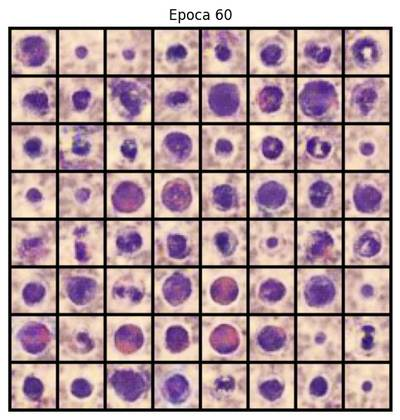

Epoch [60/100] | D_loss: 0.6442 | G_loss: 2.6305
Epoch [61/100] | D_loss: 0.4764 | G_loss: 2.4030
Epoch [62/100] | D_loss: 0.2449 | G_loss: 3.4864
Epoch [63/100] | D_loss: 0.3172 | G_loss: 2.8967
Epoch [64/100] | D_loss: 0.2075 | G_loss: 3.2480
Epoch [65/100] | D_loss: 0.1275 | G_loss: 3.6966
Epoch [66/100] | D_loss: 0.5301 | G_loss: 2.7060
Epoch [67/100] | D_loss: 0.7493 | G_loss: 2.9287
Epoch [68/100] | D_loss: 0.9928 | G_loss: 3.0007
Epoch [69/100] | D_loss: 0.4902 | G_loss: 2.9503


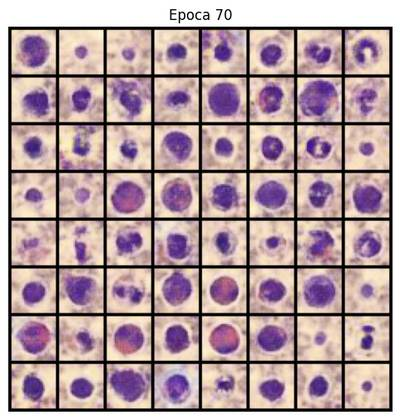

Epoch [70/100] | D_loss: 0.2079 | G_loss: 4.1113
Epoch [71/100] | D_loss: 0.4107 | G_loss: 2.5392
Epoch [72/100] | D_loss: 0.2182 | G_loss: 2.9917
Epoch [73/100] | D_loss: 0.6702 | G_loss: 2.1742
Epoch [74/100] | D_loss: 0.7126 | G_loss: 2.2794
Epoch [75/100] | D_loss: 0.1971 | G_loss: 3.9092
Epoch [76/100] | D_loss: 0.5320 | G_loss: 3.6970
Epoch [77/100] | D_loss: 0.2112 | G_loss: 3.1378
Epoch [78/100] | D_loss: 0.4849 | G_loss: 2.3617
Epoch [79/100] | D_loss: 0.4641 | G_loss: 2.0701


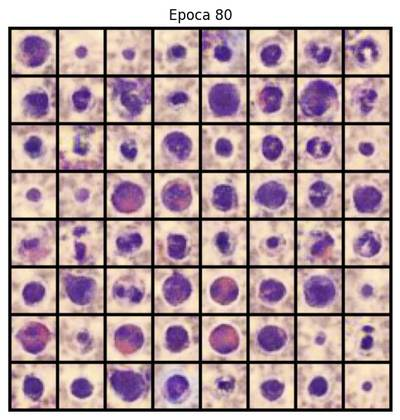

Epoch [80/100] | D_loss: 0.1008 | G_loss: 3.8285
Epoch [81/100] | D_loss: 0.8513 | G_loss: 4.0464
Epoch [82/100] | D_loss: 0.5794 | G_loss: 1.9070
Epoch [83/100] | D_loss: 0.5979 | G_loss: 3.1476
Epoch [84/100] | D_loss: 0.1509 | G_loss: 3.3961
Epoch [85/100] | D_loss: 1.4128 | G_loss: 2.8869
Epoch [86/100] | D_loss: 0.6110 | G_loss: 1.9388
Epoch [87/100] | D_loss: 0.8560 | G_loss: 2.1389
Epoch [88/100] | D_loss: 0.1255 | G_loss: 3.7969
Epoch [89/100] | D_loss: 0.2096 | G_loss: 3.6546


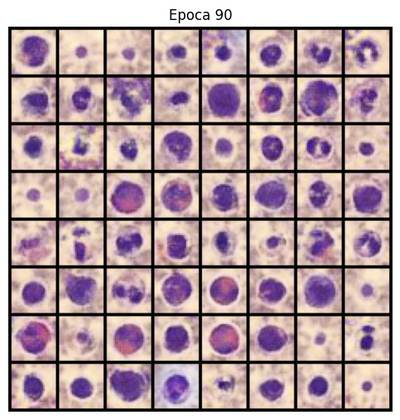

Epoch [90/100] | D_loss: 0.1631 | G_loss: 4.1252
Epoch [91/100] | D_loss: 0.2089 | G_loss: 3.4577
Epoch [92/100] | D_loss: 0.3033 | G_loss: 3.4691
Epoch [93/100] | D_loss: 0.1216 | G_loss: 4.4279
Epoch [94/100] | D_loss: 0.3801 | G_loss: 3.5343
Epoch [95/100] | D_loss: 0.5823 | G_loss: 4.2265
Epoch [96/100] | D_loss: 0.4830 | G_loss: 3.1055
Epoch [97/100] | D_loss: 0.2208 | G_loss: 3.5206
Epoch [98/100] | D_loss: 0.1904 | G_loss: 3.7355
Epoch [99/100] | D_loss: 0.3302 | G_loss: 3.5088


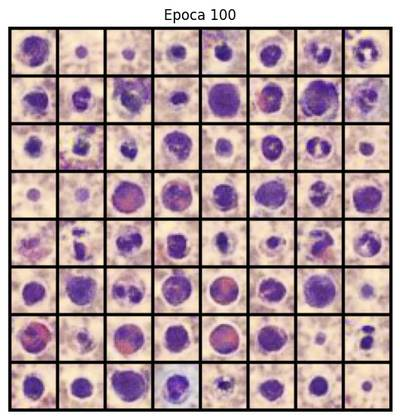

Epoch [100/100] | D_loss: 0.2342 | G_loss: 4.7507
→ FID: 157.3250

Combo 11/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 64, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0002}


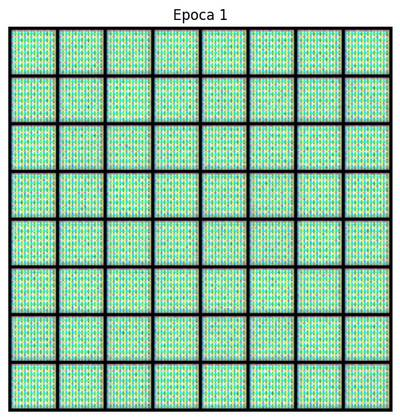

Epoch [1/100] | D_loss: 1.1555 | G_loss: 1.0126
Epoch [2/100] | D_loss: 0.6776 | G_loss: 1.6051
Epoch [3/100] | D_loss: 1.1488 | G_loss: 1.4224
Epoch [4/100] | D_loss: 1.0314 | G_loss: 1.5537
Epoch [5/100] | D_loss: 0.8093 | G_loss: 1.2688
Epoch [6/100] | D_loss: 0.7255 | G_loss: 1.8996
Epoch [7/100] | D_loss: 1.0168 | G_loss: 2.3536
Epoch [8/100] | D_loss: 0.9208 | G_loss: 1.7579
Epoch [9/100] | D_loss: 1.3830 | G_loss: 1.3913


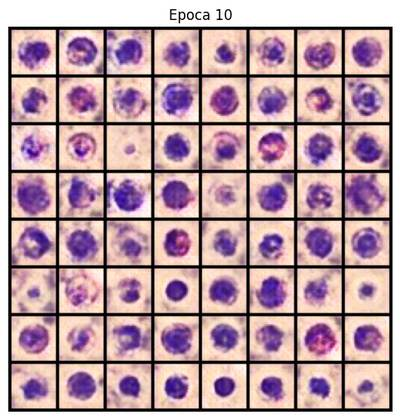

Epoch [10/100] | D_loss: 0.6544 | G_loss: 2.6714
Epoch [11/100] | D_loss: 0.6068 | G_loss: 2.9086
Epoch [12/100] | D_loss: 0.4987 | G_loss: 1.8610
Epoch [13/100] | D_loss: 0.7917 | G_loss: 1.6891
Epoch [14/100] | D_loss: 0.8182 | G_loss: 3.1200
Epoch [15/100] | D_loss: 0.8317 | G_loss: 3.0348
Epoch [16/100] | D_loss: 0.6692 | G_loss: 2.4579
Epoch [17/100] | D_loss: 0.9217 | G_loss: 1.8984
Epoch [18/100] | D_loss: 0.8818 | G_loss: 1.8484
Epoch [19/100] | D_loss: 0.6481 | G_loss: 3.2630


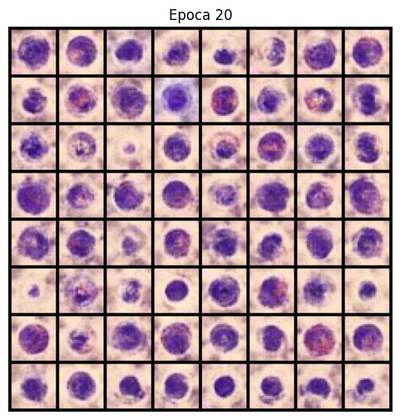

Epoch [20/100] | D_loss: 0.6787 | G_loss: 2.7945
Epoch [21/100] | D_loss: 0.6228 | G_loss: 2.6137
Epoch [22/100] | D_loss: 0.6565 | G_loss: 2.4178
Epoch [23/100] | D_loss: 0.7116 | G_loss: 2.9721
Epoch [24/100] | D_loss: 0.8006 | G_loss: 3.1106
Epoch [25/100] | D_loss: 0.9976 | G_loss: 2.9420
Epoch [26/100] | D_loss: 0.7633 | G_loss: 2.2435
Epoch [27/100] | D_loss: 0.9745 | G_loss: 2.2784
Epoch [28/100] | D_loss: 0.9230 | G_loss: 2.4626
Epoch [29/100] | D_loss: 0.9656 | G_loss: 2.9775


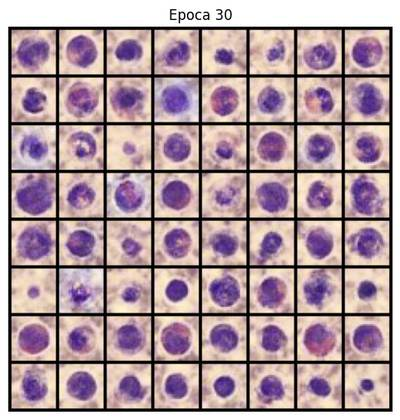

Epoch [30/100] | D_loss: 0.8537 | G_loss: 3.7446
Epoch [31/100] | D_loss: 0.5675 | G_loss: 2.9971
Epoch [32/100] | D_loss: 0.4862 | G_loss: 3.4324
Epoch [33/100] | D_loss: 0.6682 | G_loss: 2.3916
Epoch [34/100] | D_loss: 1.1863 | G_loss: 3.3068
Epoch [35/100] | D_loss: 0.5217 | G_loss: 2.9708
Epoch [36/100] | D_loss: 0.7540 | G_loss: 3.2755
Epoch [37/100] | D_loss: 0.6075 | G_loss: 3.1690
Epoch [38/100] | D_loss: 0.5531 | G_loss: 3.1365
Epoch [39/100] | D_loss: 0.3549 | G_loss: 3.2166


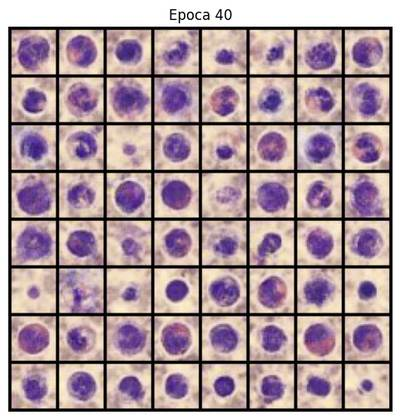

Epoch [40/100] | D_loss: 0.3667 | G_loss: 3.0335
Epoch [41/100] | D_loss: 0.3102 | G_loss: 2.8860
Epoch [42/100] | D_loss: 0.7356 | G_loss: 2.6497
Epoch [43/100] | D_loss: 0.2521 | G_loss: 3.2893
Epoch [44/100] | D_loss: 0.5552 | G_loss: 3.3620
Epoch [45/100] | D_loss: 0.5182 | G_loss: 3.1362
Epoch [46/100] | D_loss: 0.7269 | G_loss: 2.6580
Epoch [47/100] | D_loss: 0.3596 | G_loss: 2.8647
Epoch [48/100] | D_loss: 0.5592 | G_loss: 4.3253
Epoch [49/100] | D_loss: 0.2494 | G_loss: 3.2430


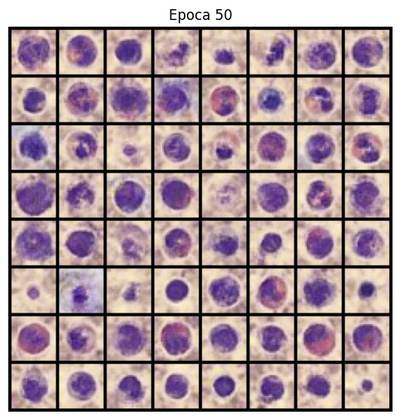

Epoch [50/100] | D_loss: 0.5447 | G_loss: 3.2768
Epoch [51/100] | D_loss: 0.4270 | G_loss: 3.7530
Epoch [52/100] | D_loss: 1.0294 | G_loss: 1.7026
Epoch [53/100] | D_loss: 0.5918 | G_loss: 2.8572
Epoch [54/100] | D_loss: 0.5316 | G_loss: 2.8942
Epoch [55/100] | D_loss: 0.3645 | G_loss: 3.3193
Epoch [56/100] | D_loss: 0.5152 | G_loss: 2.9709
Epoch [57/100] | D_loss: 0.2087 | G_loss: 3.7474
Epoch [58/100] | D_loss: 1.4410 | G_loss: 3.3519
Epoch [59/100] | D_loss: 0.4000 | G_loss: 2.9225


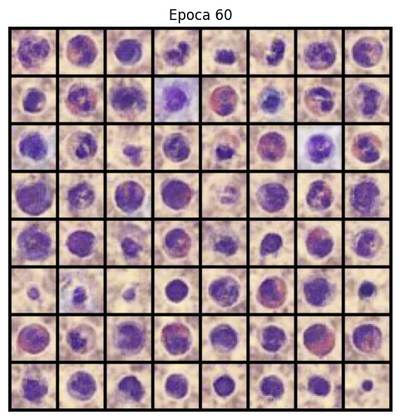

Epoch [60/100] | D_loss: 0.8170 | G_loss: 2.3083
Epoch [61/100] | D_loss: 0.6900 | G_loss: 3.3086
Epoch [62/100] | D_loss: 0.3621 | G_loss: 4.5960
Epoch [63/100] | D_loss: 0.7521 | G_loss: 2.6331
Epoch [64/100] | D_loss: 0.5145 | G_loss: 3.4896
Epoch [65/100] | D_loss: 0.3313 | G_loss: 3.4057
Epoch [66/100] | D_loss: 0.3895 | G_loss: 3.5253
Epoch [67/100] | D_loss: 0.9910 | G_loss: 2.2026
Epoch [68/100] | D_loss: 0.4142 | G_loss: 3.4260
Epoch [69/100] | D_loss: 0.4157 | G_loss: 3.0719


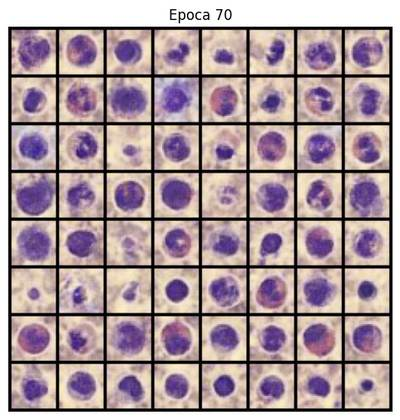

Epoch [70/100] | D_loss: 0.3497 | G_loss: 3.2145
Epoch [71/100] | D_loss: 0.8634 | G_loss: 3.5364
Epoch [72/100] | D_loss: 0.2498 | G_loss: 4.1191
Epoch [73/100] | D_loss: 0.3161 | G_loss: 3.4724
Epoch [74/100] | D_loss: 1.2773 | G_loss: 2.4724
Epoch [75/100] | D_loss: 0.4583 | G_loss: 3.8458
Epoch [76/100] | D_loss: 0.4468 | G_loss: 3.1978
Epoch [77/100] | D_loss: 0.4473 | G_loss: 4.0820
Epoch [78/100] | D_loss: 0.3945 | G_loss: 3.2744
Epoch [79/100] | D_loss: 0.5845 | G_loss: 2.7438


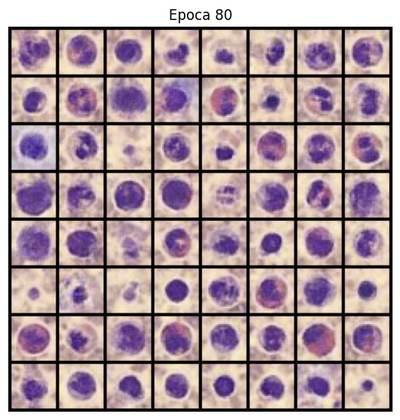

Epoch [80/100] | D_loss: 0.2003 | G_loss: 3.9672
Epoch [81/100] | D_loss: 0.3949 | G_loss: 3.9834
Epoch [82/100] | D_loss: 0.3412 | G_loss: 4.1899
Epoch [83/100] | D_loss: 0.4427 | G_loss: 4.4260
Epoch [84/100] | D_loss: 0.2991 | G_loss: 4.0591
Epoch [85/100] | D_loss: 0.3433 | G_loss: 3.4199
Epoch [86/100] | D_loss: 0.2726 | G_loss: 4.1428
Epoch [87/100] | D_loss: 0.8639 | G_loss: 3.5303
Epoch [88/100] | D_loss: 1.1704 | G_loss: 3.8274
Epoch [89/100] | D_loss: 0.7292 | G_loss: 3.4594


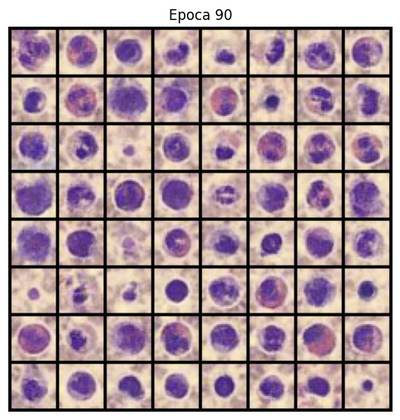

Epoch [90/100] | D_loss: 0.8796 | G_loss: 2.1739
Epoch [91/100] | D_loss: 0.2395 | G_loss: 3.3565
Epoch [92/100] | D_loss: 0.1038 | G_loss: 4.4901
Epoch [93/100] | D_loss: 0.1771 | G_loss: 4.2472
Epoch [94/100] | D_loss: 0.3326 | G_loss: 3.0846
Epoch [95/100] | D_loss: 0.2837 | G_loss: 3.6396
Epoch [96/100] | D_loss: 0.2801 | G_loss: 4.0118
Epoch [97/100] | D_loss: 0.1314 | G_loss: 4.1936
Epoch [98/100] | D_loss: 0.1823 | G_loss: 4.7280
Epoch [99/100] | D_loss: 1.8549 | G_loss: 2.6632


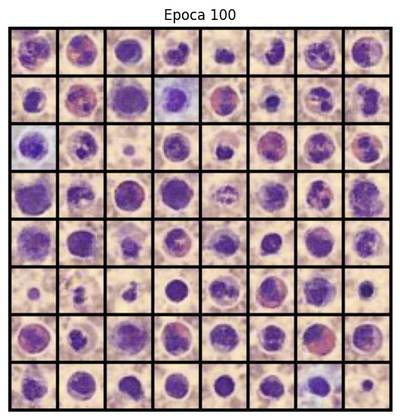

Epoch [100/100] | D_loss: 1.1599 | G_loss: 2.3820
→ FID: 165.1765

Combo 12/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 64, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0001}


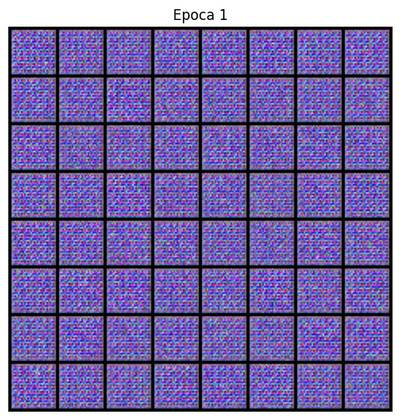

Epoch [1/100] | D_loss: 1.2454 | G_loss: 0.8898
Epoch [2/100] | D_loss: 0.9913 | G_loss: 1.1051
Epoch [3/100] | D_loss: 1.0043 | G_loss: 1.1801
Epoch [4/100] | D_loss: 1.1091 | G_loss: 1.1745
Epoch [5/100] | D_loss: 1.0823 | G_loss: 1.0810
Epoch [6/100] | D_loss: 0.9074 | G_loss: 1.7279
Epoch [7/100] | D_loss: 0.5534 | G_loss: 1.8254
Epoch [8/100] | D_loss: 0.3966 | G_loss: 2.2373
Epoch [9/100] | D_loss: 0.4576 | G_loss: 2.2599


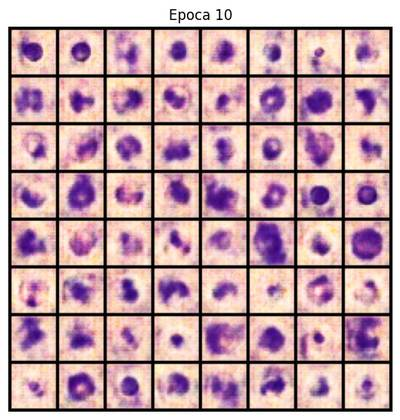

Epoch [10/100] | D_loss: 0.5227 | G_loss: 2.2366
Epoch [11/100] | D_loss: 0.4036 | G_loss: 2.3633
Epoch [12/100] | D_loss: 0.5194 | G_loss: 2.1770
Epoch [13/100] | D_loss: 0.6508 | G_loss: 2.1168
Epoch [14/100] | D_loss: 0.3209 | G_loss: 2.7813
Epoch [15/100] | D_loss: 0.5233 | G_loss: 2.6167
Epoch [16/100] | D_loss: 0.3820 | G_loss: 2.3095
Epoch [17/100] | D_loss: 0.5623 | G_loss: 2.7842
Epoch [18/100] | D_loss: 0.5123 | G_loss: 2.4044
Epoch [19/100] | D_loss: 0.5755 | G_loss: 2.0750


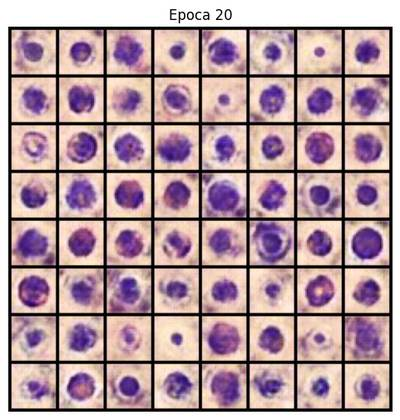

Epoch [20/100] | D_loss: 0.7603 | G_loss: 2.0369
Epoch [21/100] | D_loss: 0.3641 | G_loss: 2.6076
Epoch [22/100] | D_loss: 0.8264 | G_loss: 2.3659
Epoch [23/100] | D_loss: 0.4834 | G_loss: 2.3648
Epoch [24/100] | D_loss: 0.5666 | G_loss: 3.4270
Epoch [25/100] | D_loss: 0.4952 | G_loss: 2.8145
Epoch [26/100] | D_loss: 0.4319 | G_loss: 2.7184
Epoch [27/100] | D_loss: 0.6226 | G_loss: 1.6124
Epoch [28/100] | D_loss: 0.6682 | G_loss: 2.7466
Epoch [29/100] | D_loss: 0.5627 | G_loss: 3.2922


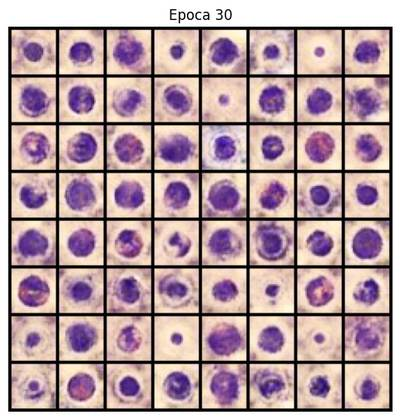

Epoch [30/100] | D_loss: 0.4234 | G_loss: 2.9088
Epoch [31/100] | D_loss: 0.6803 | G_loss: 2.8260
Epoch [32/100] | D_loss: 0.5143 | G_loss: 3.4068
Epoch [33/100] | D_loss: 0.3046 | G_loss: 2.9080
Epoch [34/100] | D_loss: 0.8965 | G_loss: 2.6105
Epoch [35/100] | D_loss: 0.3930 | G_loss: 2.6415
Epoch [36/100] | D_loss: 0.3814 | G_loss: 3.9027
Epoch [37/100] | D_loss: 0.7003 | G_loss: 4.1429
Epoch [38/100] | D_loss: 0.5644 | G_loss: 2.3802
Epoch [39/100] | D_loss: 1.5574 | G_loss: 2.1216


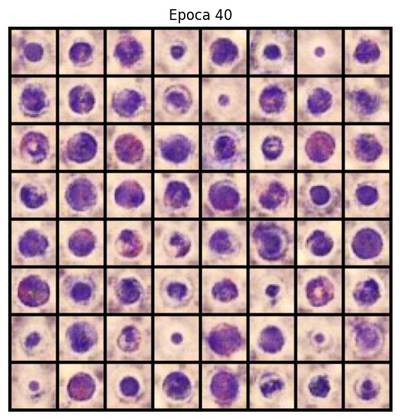

Epoch [40/100] | D_loss: 1.5734 | G_loss: 1.2875
Epoch [41/100] | D_loss: 0.5168 | G_loss: 3.0263
Epoch [42/100] | D_loss: 0.6951 | G_loss: 3.3662
Epoch [43/100] | D_loss: 0.1826 | G_loss: 3.4063
Epoch [44/100] | D_loss: 0.2846 | G_loss: 2.9002
Epoch [45/100] | D_loss: 0.3110 | G_loss: 3.3401
Epoch [46/100] | D_loss: 0.9599 | G_loss: 2.8821
Epoch [47/100] | D_loss: 0.4198 | G_loss: 2.8267
Epoch [48/100] | D_loss: 0.1795 | G_loss: 4.2847
Epoch [49/100] | D_loss: 0.3597 | G_loss: 2.8292


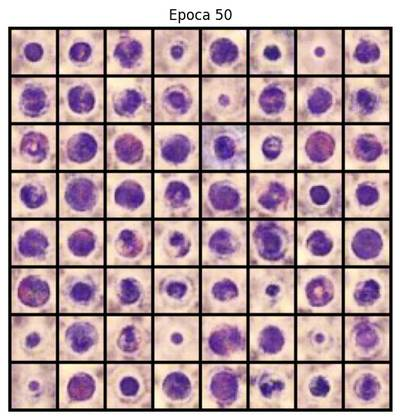

Epoch [50/100] | D_loss: 1.0183 | G_loss: 1.7747
Epoch [51/100] | D_loss: 0.6849 | G_loss: 4.1608
Epoch [52/100] | D_loss: 1.8270 | G_loss: 0.3684
Epoch [53/100] | D_loss: 0.3660 | G_loss: 3.3428
Epoch [54/100] | D_loss: 0.2168 | G_loss: 3.7492
Epoch [55/100] | D_loss: 0.4962 | G_loss: 3.4748
Epoch [56/100] | D_loss: 0.3727 | G_loss: 3.1180
Epoch [57/100] | D_loss: 0.2395 | G_loss: 3.7839
Epoch [58/100] | D_loss: 0.5610 | G_loss: 3.1446
Epoch [59/100] | D_loss: 1.3544 | G_loss: 2.0627


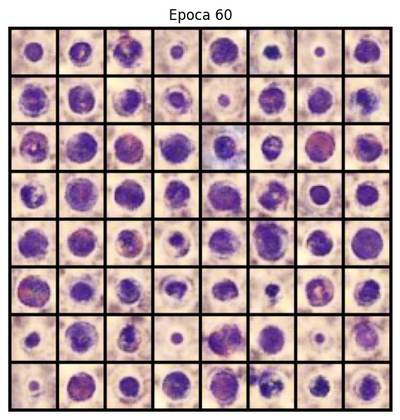

Epoch [60/100] | D_loss: 0.4204 | G_loss: 2.9119
Epoch [61/100] | D_loss: 0.3079 | G_loss: 3.7291
Epoch [62/100] | D_loss: 0.1557 | G_loss: 4.6062
Epoch [63/100] | D_loss: 0.3995 | G_loss: 2.7844
Epoch [64/100] | D_loss: 0.2718 | G_loss: 3.1739
Epoch [65/100] | D_loss: 0.2426 | G_loss: 3.2593
Epoch [66/100] | D_loss: 0.5614 | G_loss: 2.5889
Epoch [67/100] | D_loss: 0.4347 | G_loss: 3.3152
Epoch [68/100] | D_loss: 0.1723 | G_loss: 3.6663
Epoch [69/100] | D_loss: 0.4468 | G_loss: 4.2134


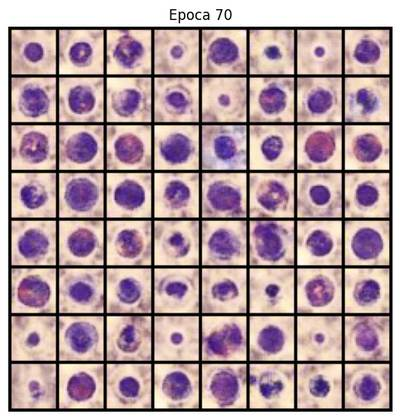

Epoch [70/100] | D_loss: 0.2297 | G_loss: 3.4762
Epoch [71/100] | D_loss: 0.3393 | G_loss: 3.7330
Epoch [72/100] | D_loss: 0.6326 | G_loss: 2.3122
Epoch [73/100] | D_loss: 1.0726 | G_loss: 3.1756
Epoch [74/100] | D_loss: 0.5245 | G_loss: 2.8598
Epoch [75/100] | D_loss: 0.5021 | G_loss: 4.6415
Epoch [76/100] | D_loss: 0.4214 | G_loss: 4.5693
Epoch [77/100] | D_loss: 0.2873 | G_loss: 4.1622
Epoch [78/100] | D_loss: 0.3796 | G_loss: 3.9920
Epoch [79/100] | D_loss: 0.1874 | G_loss: 3.5627


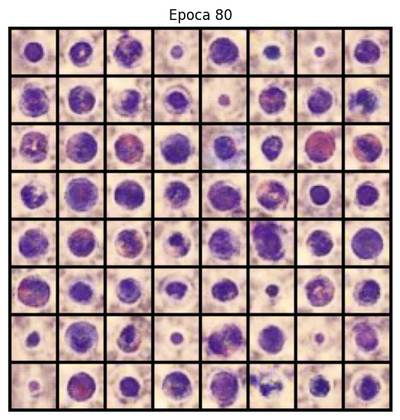

Epoch [80/100] | D_loss: 0.5776 | G_loss: 3.4553
Epoch [81/100] | D_loss: 0.7939 | G_loss: 1.8943
Epoch [82/100] | D_loss: 0.8653 | G_loss: 3.3001
Epoch [83/100] | D_loss: 0.3802 | G_loss: 2.8983
Epoch [84/100] | D_loss: 0.7282 | G_loss: 4.0690
Epoch [85/100] | D_loss: 0.4722 | G_loss: 3.3748
Epoch [86/100] | D_loss: 0.2887 | G_loss: 3.6466
Epoch [87/100] | D_loss: 0.4971 | G_loss: 2.8897
Epoch [88/100] | D_loss: 0.4464 | G_loss: 3.8335
Epoch [89/100] | D_loss: 0.2626 | G_loss: 3.8117


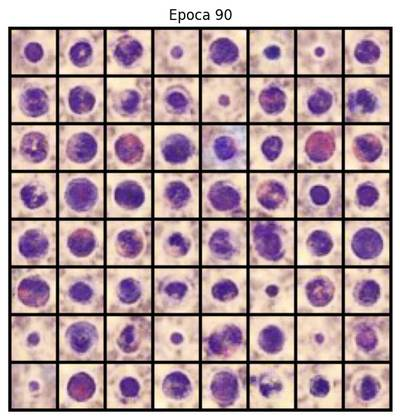

Epoch [90/100] | D_loss: 0.3117 | G_loss: 4.3396
Epoch [91/100] | D_loss: 0.4952 | G_loss: 3.4392
Epoch [92/100] | D_loss: 0.2279 | G_loss: 4.0767
Epoch [93/100] | D_loss: 0.1636 | G_loss: 3.4349
Epoch [94/100] | D_loss: 1.3516 | G_loss: 1.8906
Epoch [95/100] | D_loss: 0.2843 | G_loss: 3.2289
Epoch [96/100] | D_loss: 0.7714 | G_loss: 4.0096
Epoch [97/100] | D_loss: 0.5245 | G_loss: 4.5030
Epoch [98/100] | D_loss: 0.2354 | G_loss: 3.6736
Epoch [99/100] | D_loss: 0.1662 | G_loss: 4.6229


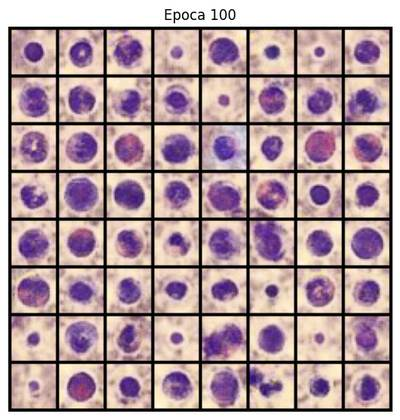

Epoch [100/100] | D_loss: 0.4993 | G_loss: 3.8419
→ FID: 162.7614

Combo 13/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 128, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0002}


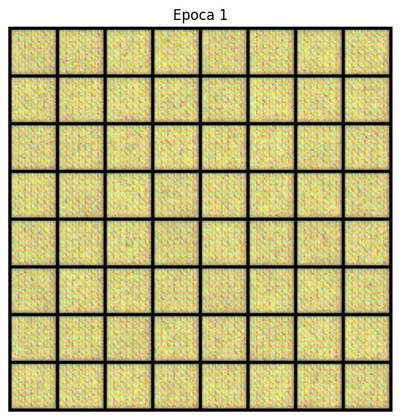

Epoch [1/100] | D_loss: 1.0620 | G_loss: 1.3274
Epoch [2/100] | D_loss: 0.9810 | G_loss: 1.3403
Epoch [3/100] | D_loss: 0.9040 | G_loss: 1.4428
Epoch [4/100] | D_loss: 1.0936 | G_loss: 1.4168
Epoch [5/100] | D_loss: 0.6495 | G_loss: 1.9115
Epoch [6/100] | D_loss: 0.7331 | G_loss: 1.9363
Epoch [7/100] | D_loss: 1.2160 | G_loss: 1.4005
Epoch [8/100] | D_loss: 0.5976 | G_loss: 1.8527
Epoch [9/100] | D_loss: 1.9178 | G_loss: 1.7822


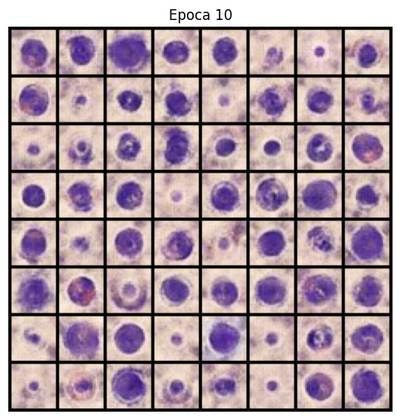

Epoch [10/100] | D_loss: 0.4303 | G_loss: 2.8041
Epoch [11/100] | D_loss: 0.2558 | G_loss: 2.7932
Epoch [12/100] | D_loss: 0.7462 | G_loss: 2.9958
Epoch [13/100] | D_loss: 0.6452 | G_loss: 3.2739
Epoch [14/100] | D_loss: 0.9314 | G_loss: 1.8909
Epoch [15/100] | D_loss: 1.7877 | G_loss: 1.6811
Epoch [16/100] | D_loss: 0.1574 | G_loss: 3.9432
Epoch [17/100] | D_loss: 0.6492 | G_loss: 3.6784
Epoch [18/100] | D_loss: 1.2804 | G_loss: 2.7176
Epoch [19/100] | D_loss: 0.5671 | G_loss: 3.9298


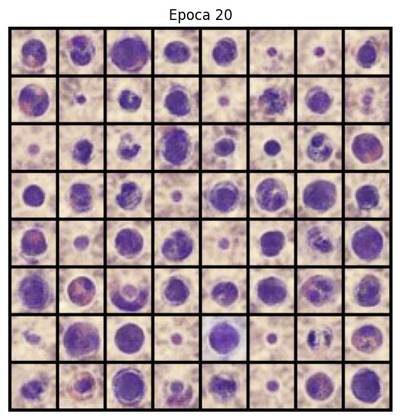

Epoch [20/100] | D_loss: 0.3870 | G_loss: 3.4907
Epoch [21/100] | D_loss: 0.2540 | G_loss: 3.7609
Epoch [22/100] | D_loss: 0.4016 | G_loss: 4.3532
Epoch [23/100] | D_loss: 0.4359 | G_loss: 3.7960
Epoch [24/100] | D_loss: 0.1769 | G_loss: 3.9502
Epoch [25/100] | D_loss: 0.4506 | G_loss: 3.8799
Epoch [26/100] | D_loss: 1.3874 | G_loss: 2.2936
Epoch [27/100] | D_loss: 0.2601 | G_loss: 3.5920
Epoch [28/100] | D_loss: 0.2253 | G_loss: 3.5034
Epoch [29/100] | D_loss: 0.5962 | G_loss: 4.2363


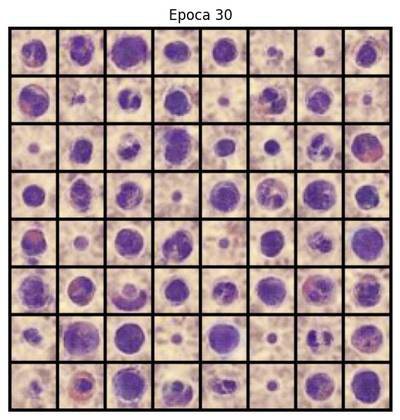

Epoch [30/100] | D_loss: 0.1659 | G_loss: 3.5527
Epoch [31/100] | D_loss: 1.0430 | G_loss: 4.3589
Epoch [32/100] | D_loss: 0.1274 | G_loss: 4.4695
Epoch [33/100] | D_loss: 0.3233 | G_loss: 4.9799
Epoch [34/100] | D_loss: 0.1156 | G_loss: 4.2950
Epoch [35/100] | D_loss: 0.1994 | G_loss: 4.4099
Epoch [36/100] | D_loss: 0.0833 | G_loss: 4.1694
Epoch [37/100] | D_loss: 0.1816 | G_loss: 4.0740
Epoch [38/100] | D_loss: 0.2082 | G_loss: 4.6028
Epoch [39/100] | D_loss: 1.0105 | G_loss: 1.1765


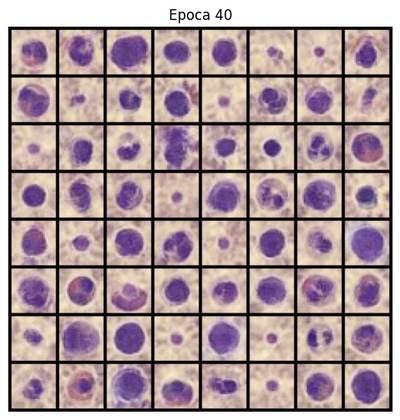

Epoch [40/100] | D_loss: 0.9135 | G_loss: 2.6713
Epoch [41/100] | D_loss: 0.2237 | G_loss: 4.7986
Epoch [42/100] | D_loss: 0.2157 | G_loss: 4.1802
Epoch [43/100] | D_loss: 0.0988 | G_loss: 4.3200
Epoch [44/100] | D_loss: 0.0517 | G_loss: 4.7958
Epoch [45/100] | D_loss: 0.2226 | G_loss: 5.4964
Epoch [46/100] | D_loss: 0.4508 | G_loss: 3.0557
Epoch [47/100] | D_loss: 1.4735 | G_loss: 4.9815
Epoch [48/100] | D_loss: 0.1237 | G_loss: 4.3921
Epoch [49/100] | D_loss: 0.4410 | G_loss: 4.1449


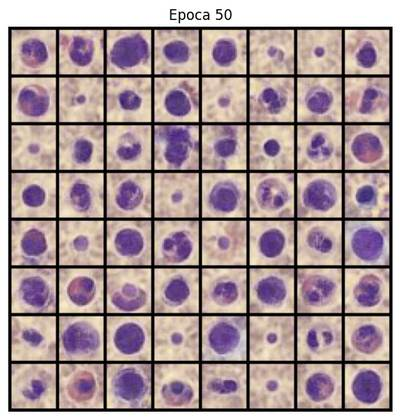

Epoch [50/100] | D_loss: 0.1963 | G_loss: 4.2539
Epoch [51/100] | D_loss: 0.1098 | G_loss: 4.2780
Epoch [52/100] | D_loss: 0.2555 | G_loss: 3.7441
Epoch [53/100] | D_loss: 1.3110 | G_loss: 1.9966
Epoch [54/100] | D_loss: 0.6474 | G_loss: 4.1328
Epoch [55/100] | D_loss: 0.0814 | G_loss: 4.2545
Epoch [56/100] | D_loss: 0.0919 | G_loss: 4.4250
Epoch [57/100] | D_loss: 0.0749 | G_loss: 4.7838
Epoch [58/100] | D_loss: 0.5189 | G_loss: 2.7009
Epoch [59/100] | D_loss: 0.0987 | G_loss: 4.6906


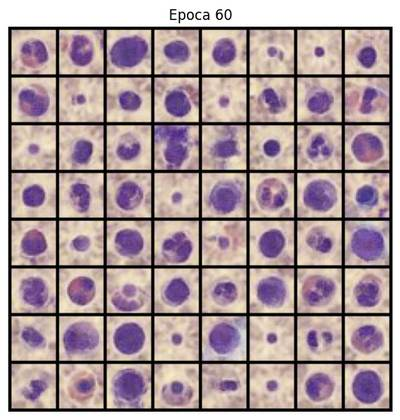

Epoch [60/100] | D_loss: 0.5871 | G_loss: 4.6666
Epoch [61/100] | D_loss: 0.2361 | G_loss: 4.5371
Epoch [62/100] | D_loss: 0.1577 | G_loss: 4.5227
Epoch [63/100] | D_loss: 0.0703 | G_loss: 5.0059
Epoch [64/100] | D_loss: 0.0837 | G_loss: 5.6339
Epoch [65/100] | D_loss: 0.4810 | G_loss: 5.3371
Epoch [66/100] | D_loss: 0.0184 | G_loss: 5.0224
Epoch [67/100] | D_loss: 0.0394 | G_loss: 6.6610
Epoch [68/100] | D_loss: 0.3566 | G_loss: 4.5047
Epoch [69/100] | D_loss: 0.2409 | G_loss: 6.2917


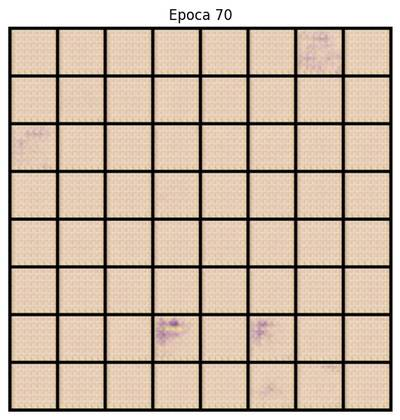

Epoch [70/100] | D_loss: 0.0423 | G_loss: 5.2547
Epoch [71/100] | D_loss: 0.0216 | G_loss: 6.0508
Epoch [72/100] | D_loss: 0.0312 | G_loss: 6.4050
Epoch [73/100] | D_loss: 0.0770 | G_loss: 4.4542
Epoch [74/100] | D_loss: 0.0344 | G_loss: 7.2204
Epoch [75/100] | D_loss: 0.0166 | G_loss: 5.8450
Epoch [76/100] | D_loss: 0.0206 | G_loss: 6.4871
Epoch [77/100] | D_loss: 0.0176 | G_loss: 6.0962
Epoch [78/100] | D_loss: 0.0263 | G_loss: 5.3903
Epoch [79/100] | D_loss: 0.0136 | G_loss: 6.3280


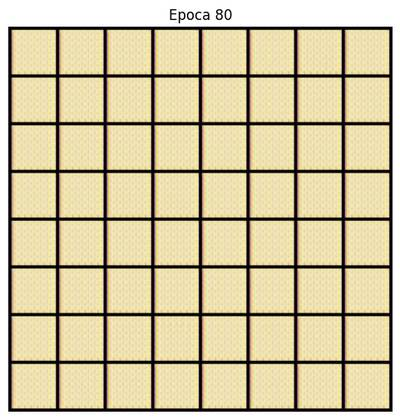

Epoch [80/100] | D_loss: 0.0325 | G_loss: 5.2710
Epoch [81/100] | D_loss: 0.2050 | G_loss: 6.6678
Epoch [82/100] | D_loss: 0.0231 | G_loss: 6.5014
Epoch [83/100] | D_loss: 0.0369 | G_loss: 4.9211
Epoch [84/100] | D_loss: 0.0071 | G_loss: 6.4632
Epoch [85/100] | D_loss: 0.0228 | G_loss: 5.5093
Epoch [86/100] | D_loss: 0.0400 | G_loss: 6.5558
Epoch [87/100] | D_loss: 0.0155 | G_loss: 5.5737
Epoch [88/100] | D_loss: 0.0038 | G_loss: 6.6769
Epoch [89/100] | D_loss: 0.0055 | G_loss: 6.7518


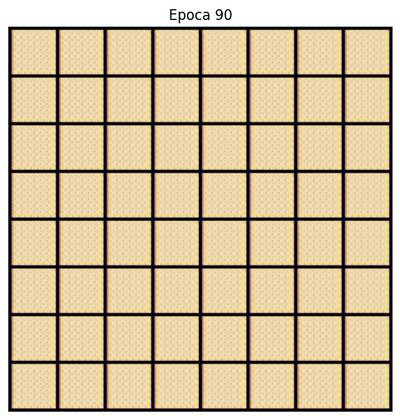

Epoch [90/100] | D_loss: 0.0137 | G_loss: 4.7116
Epoch [91/100] | D_loss: 0.0173 | G_loss: 5.5802
Epoch [92/100] | D_loss: 0.0116 | G_loss: 5.6319
Epoch [93/100] | D_loss: 0.0077 | G_loss: 5.8973
Epoch [94/100] | D_loss: 0.0861 | G_loss: 6.2293
Epoch [95/100] | D_loss: 0.0319 | G_loss: 5.0499
Epoch [96/100] | D_loss: 0.0102 | G_loss: 5.5699
Epoch [97/100] | D_loss: 0.0080 | G_loss: 5.9591
Epoch [98/100] | D_loss: 0.0062 | G_loss: 6.3029
Epoch [99/100] | D_loss: 0.0447 | G_loss: 7.5815


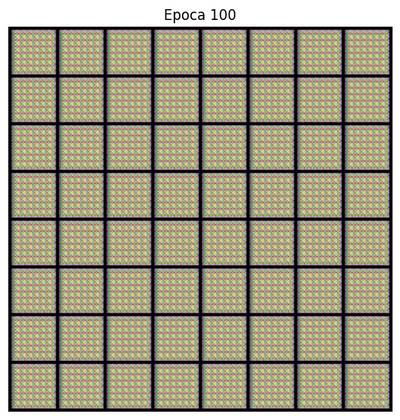

Epoch [100/100] | D_loss: 0.0277 | G_loss: 6.7087
→ FID: 413.7870

Combo 14/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 128, 'feature_g': 64, 'latent_dim': 100, 'lr': 0.0001}


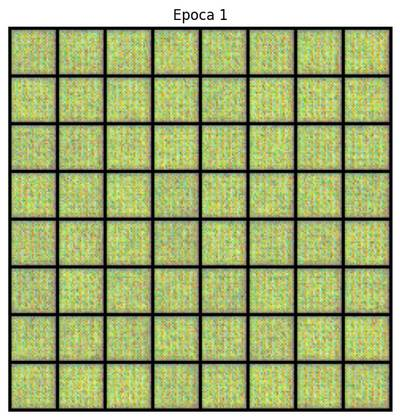

Epoch [1/100] | D_loss: 1.1562 | G_loss: 1.0603
Epoch [2/100] | D_loss: 0.8083 | G_loss: 1.4098
Epoch [3/100] | D_loss: 0.7691 | G_loss: 1.4503
Epoch [4/100] | D_loss: 0.9867 | G_loss: 1.1479
Epoch [5/100] | D_loss: 0.7551 | G_loss: 1.5481
Epoch [6/100] | D_loss: 0.7976 | G_loss: 1.5308
Epoch [7/100] | D_loss: 0.6383 | G_loss: 1.6749
Epoch [8/100] | D_loss: 0.8759 | G_loss: 1.7743
Epoch [9/100] | D_loss: 0.9668 | G_loss: 1.9063


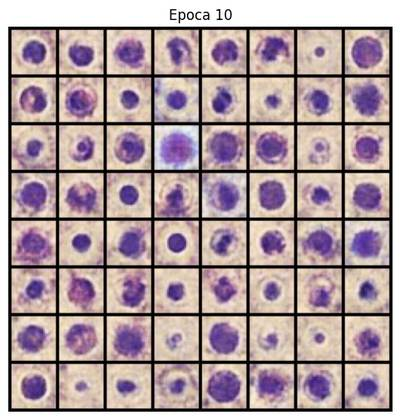

Epoch [10/100] | D_loss: 0.5979 | G_loss: 1.9281
Epoch [11/100] | D_loss: 0.8031 | G_loss: 1.3976
Epoch [12/100] | D_loss: 0.4458 | G_loss: 2.6097
Epoch [13/100] | D_loss: 0.6555 | G_loss: 2.2978
Epoch [14/100] | D_loss: 0.7336 | G_loss: 2.3054
Epoch [15/100] | D_loss: 0.7678 | G_loss: 1.3877
Epoch [16/100] | D_loss: 0.6189 | G_loss: 2.7898
Epoch [17/100] | D_loss: 0.3934 | G_loss: 2.3066
Epoch [18/100] | D_loss: 0.6666 | G_loss: 2.5213
Epoch [19/100] | D_loss: 0.5821 | G_loss: 2.4095


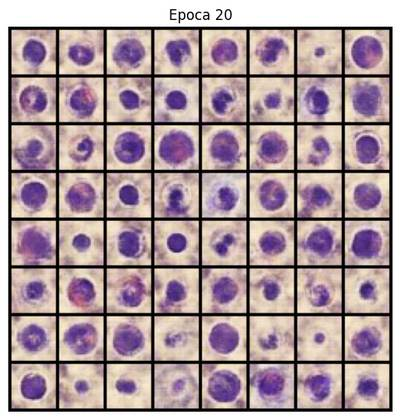

Epoch [20/100] | D_loss: 0.4089 | G_loss: 2.6530
Epoch [21/100] | D_loss: 0.3108 | G_loss: 3.0094
Epoch [22/100] | D_loss: 0.4402 | G_loss: 3.0497
Epoch [23/100] | D_loss: 0.3505 | G_loss: 3.0812
Epoch [24/100] | D_loss: 0.7263 | G_loss: 1.4324
Epoch [25/100] | D_loss: 0.7612 | G_loss: 2.8020
Epoch [26/100] | D_loss: 0.3242 | G_loss: 3.1043
Epoch [27/100] | D_loss: 0.2452 | G_loss: 3.3774
Epoch [28/100] | D_loss: 0.4683 | G_loss: 3.5093
Epoch [29/100] | D_loss: 0.8813 | G_loss: 1.6572


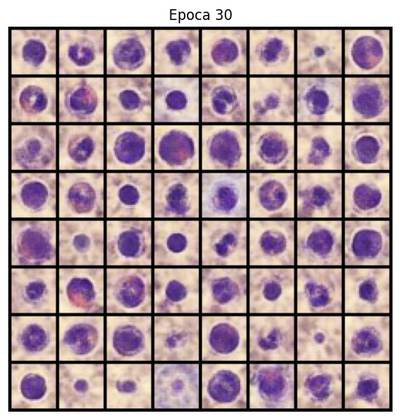

Epoch [30/100] | D_loss: 0.3002 | G_loss: 3.7156
Epoch [31/100] | D_loss: 0.1911 | G_loss: 3.2775
Epoch [32/100] | D_loss: 0.2249 | G_loss: 3.7047
Epoch [33/100] | D_loss: 0.1476 | G_loss: 3.4732
Epoch [34/100] | D_loss: 0.4660 | G_loss: 2.9024
Epoch [35/100] | D_loss: 0.2199 | G_loss: 3.5859
Epoch [36/100] | D_loss: 0.0893 | G_loss: 3.7652
Epoch [37/100] | D_loss: 0.7687 | G_loss: 3.4000
Epoch [38/100] | D_loss: 0.2997 | G_loss: 3.0487
Epoch [39/100] | D_loss: 0.0850 | G_loss: 3.8544


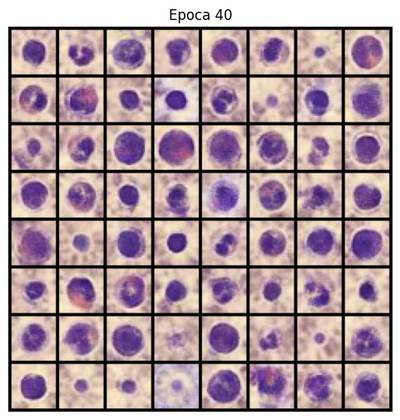

Epoch [40/100] | D_loss: 0.0914 | G_loss: 4.0776
Epoch [41/100] | D_loss: 0.1615 | G_loss: 4.2808
Epoch [42/100] | D_loss: 0.1780 | G_loss: 4.0991
Epoch [43/100] | D_loss: 0.1493 | G_loss: 3.4638
Epoch [44/100] | D_loss: 0.7675 | G_loss: 3.8666
Epoch [45/100] | D_loss: 0.3225 | G_loss: 2.5196
Epoch [46/100] | D_loss: 0.1899 | G_loss: 4.4538
Epoch [47/100] | D_loss: 0.2581 | G_loss: 3.2006
Epoch [48/100] | D_loss: 1.3053 | G_loss: 4.3985
Epoch [49/100] | D_loss: 0.1572 | G_loss: 4.0190


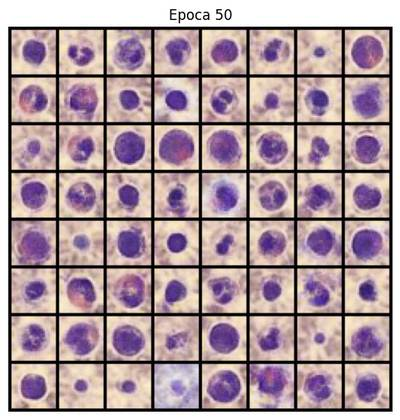

Epoch [50/100] | D_loss: 0.1388 | G_loss: 4.0027
Epoch [51/100] | D_loss: 0.2012 | G_loss: 3.3767
Epoch [52/100] | D_loss: 0.1659 | G_loss: 3.2600
Epoch [53/100] | D_loss: 0.3999 | G_loss: 2.7636
Epoch [54/100] | D_loss: 0.3174 | G_loss: 2.9647
Epoch [55/100] | D_loss: 0.1411 | G_loss: 3.8873
Epoch [56/100] | D_loss: 0.0794 | G_loss: 4.1525
Epoch [57/100] | D_loss: 0.0646 | G_loss: 4.8241
Epoch [58/100] | D_loss: 0.3813 | G_loss: 1.7248
Epoch [59/100] | D_loss: 0.1075 | G_loss: 3.9905


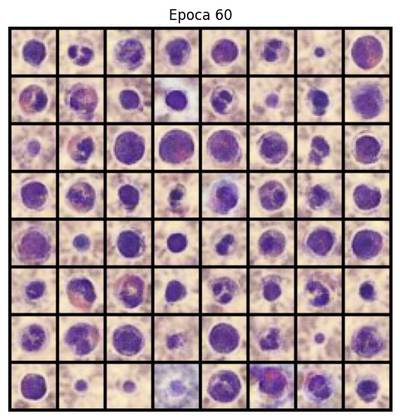

Epoch [60/100] | D_loss: 0.4632 | G_loss: 5.4757
Epoch [61/100] | D_loss: 0.4536 | G_loss: 3.5384
Epoch [62/100] | D_loss: 0.0568 | G_loss: 4.5566
Epoch [63/100] | D_loss: 0.1169 | G_loss: 4.9075
Epoch [64/100] | D_loss: 0.1505 | G_loss: 4.3533
Epoch [65/100] | D_loss: 0.2785 | G_loss: 3.2861
Epoch [66/100] | D_loss: 0.2549 | G_loss: 4.0800
Epoch [67/100] | D_loss: 0.0658 | G_loss: 4.5054
Epoch [68/100] | D_loss: 0.1924 | G_loss: 3.7521
Epoch [69/100] | D_loss: 0.4883 | G_loss: 1.9622


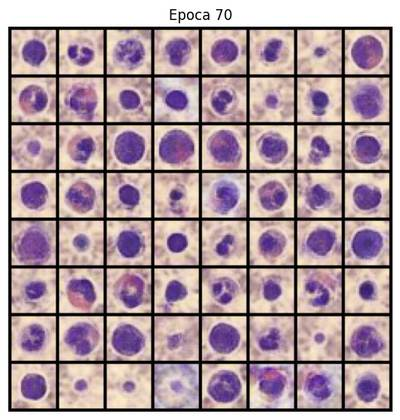

Epoch [70/100] | D_loss: 0.5603 | G_loss: 3.7346
Epoch [71/100] | D_loss: 0.0879 | G_loss: 4.1456
Epoch [72/100] | D_loss: 0.0850 | G_loss: 4.6958
Epoch [73/100] | D_loss: 0.0531 | G_loss: 4.8376
Epoch [74/100] | D_loss: 0.5127 | G_loss: 4.8518
Epoch [75/100] | D_loss: 0.0463 | G_loss: 4.5261
Epoch [76/100] | D_loss: 0.2581 | G_loss: 4.8800
Epoch [77/100] | D_loss: 0.1354 | G_loss: 4.5009
Epoch [78/100] | D_loss: 0.1458 | G_loss: 3.5848
Epoch [79/100] | D_loss: 0.1894 | G_loss: 4.7655


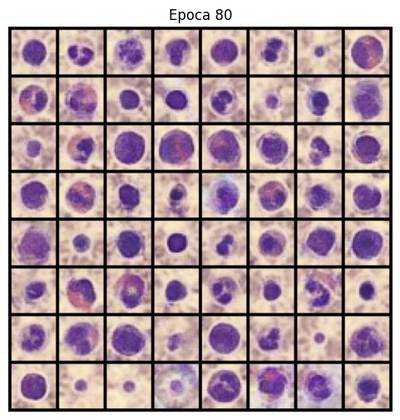

Epoch [80/100] | D_loss: 0.3339 | G_loss: 3.4827
Epoch [81/100] | D_loss: 0.4737 | G_loss: 1.6117
Epoch [82/100] | D_loss: 0.0572 | G_loss: 4.9657
Epoch [83/100] | D_loss: 0.3637 | G_loss: 4.7843
Epoch [84/100] | D_loss: 0.0392 | G_loss: 4.8252
Epoch [85/100] | D_loss: 0.0828 | G_loss: 4.1054
Epoch [86/100] | D_loss: 0.1120 | G_loss: 4.1634
Epoch [87/100] | D_loss: 0.1139 | G_loss: 4.3299
Epoch [88/100] | D_loss: 0.0549 | G_loss: 4.3579
Epoch [89/100] | D_loss: 0.0529 | G_loss: 4.5515


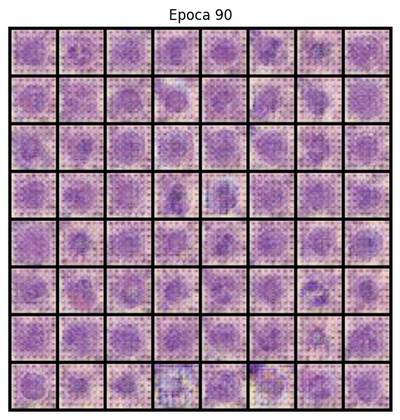

Epoch [90/100] | D_loss: 0.0412 | G_loss: 4.3815
Epoch [91/100] | D_loss: 0.1100 | G_loss: 4.8427
Epoch [92/100] | D_loss: 0.0299 | G_loss: 5.1882
Epoch [93/100] | D_loss: 0.0282 | G_loss: 5.2564
Epoch [94/100] | D_loss: 0.0142 | G_loss: 5.6865
Epoch [95/100] | D_loss: 0.1180 | G_loss: 4.5934
Epoch [96/100] | D_loss: 0.0261 | G_loss: 4.5729
Epoch [97/100] | D_loss: 0.0258 | G_loss: 4.6077
Epoch [98/100] | D_loss: 1.5198 | G_loss: 4.7539
Epoch [99/100] | D_loss: 0.0881 | G_loss: 5.4351


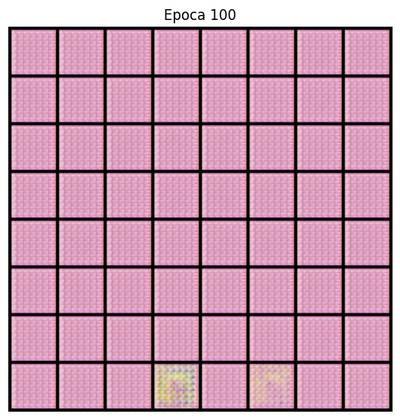

Epoch [100/100] | D_loss: 0.0444 | G_loss: 6.1244
→ FID: 441.9036

Combo 15/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 128, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0002}


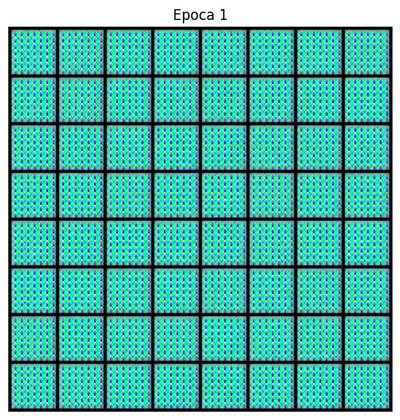

Epoch [1/100] | D_loss: 0.9971 | G_loss: 1.3979
Epoch [2/100] | D_loss: 1.1303 | G_loss: 1.4269
Epoch [3/100] | D_loss: 0.9457 | G_loss: 2.4648
Epoch [4/100] | D_loss: 0.5946 | G_loss: 2.1103
Epoch [5/100] | D_loss: 0.8101 | G_loss: 2.7065
Epoch [6/100] | D_loss: 0.3251 | G_loss: 2.6347
Epoch [7/100] | D_loss: 0.5517 | G_loss: 2.8555
Epoch [8/100] | D_loss: 0.7061 | G_loss: 3.3044
Epoch [9/100] | D_loss: 0.4225 | G_loss: 2.2823


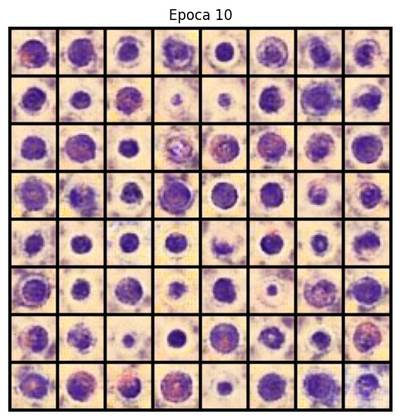

Epoch [10/100] | D_loss: 1.3116 | G_loss: 1.8276
Epoch [11/100] | D_loss: 0.3951 | G_loss: 2.8753
Epoch [12/100] | D_loss: 0.1514 | G_loss: 3.7649
Epoch [13/100] | D_loss: 0.3888 | G_loss: 3.0319
Epoch [14/100] | D_loss: 0.4502 | G_loss: 3.6207
Epoch [15/100] | D_loss: 0.1620 | G_loss: 3.5188
Epoch [16/100] | D_loss: 1.3831 | G_loss: 2.6326
Epoch [17/100] | D_loss: 0.5366 | G_loss: 3.5252
Epoch [18/100] | D_loss: 1.1156 | G_loss: 2.7184
Epoch [19/100] | D_loss: 0.2865 | G_loss: 3.2881


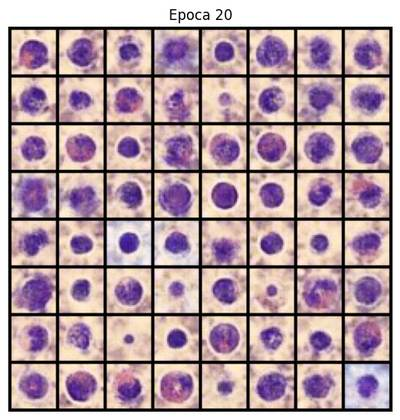

Epoch [20/100] | D_loss: 1.5380 | G_loss: 1.9444
Epoch [21/100] | D_loss: 0.5283 | G_loss: 4.2283
Epoch [22/100] | D_loss: 1.0767 | G_loss: 2.4232
Epoch [23/100] | D_loss: 0.7379 | G_loss: 2.4695
Epoch [24/100] | D_loss: 0.4779 | G_loss: 4.2943
Epoch [25/100] | D_loss: 0.1919 | G_loss: 4.1784
Epoch [26/100] | D_loss: 0.1441 | G_loss: 3.5744
Epoch [27/100] | D_loss: 0.7901 | G_loss: 3.3094
Epoch [28/100] | D_loss: 0.3471 | G_loss: 2.8952
Epoch [29/100] | D_loss: 0.9789 | G_loss: 3.7457


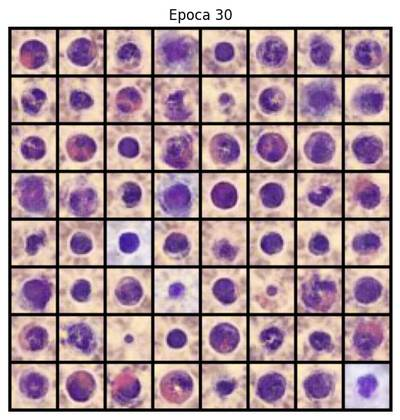

Epoch [30/100] | D_loss: 0.3159 | G_loss: 3.6864
Epoch [31/100] | D_loss: 0.4632 | G_loss: 4.7305
Epoch [32/100] | D_loss: 2.0960 | G_loss: 4.1987
Epoch [33/100] | D_loss: 0.2508 | G_loss: 3.3733
Epoch [34/100] | D_loss: 0.1710 | G_loss: 4.2779
Epoch [35/100] | D_loss: 0.6481 | G_loss: 3.8994
Epoch [36/100] | D_loss: 0.6510 | G_loss: 3.7048
Epoch [37/100] | D_loss: 0.5441 | G_loss: 3.2542
Epoch [38/100] | D_loss: 0.4037 | G_loss: 3.0890
Epoch [39/100] | D_loss: 0.5051 | G_loss: 3.3779


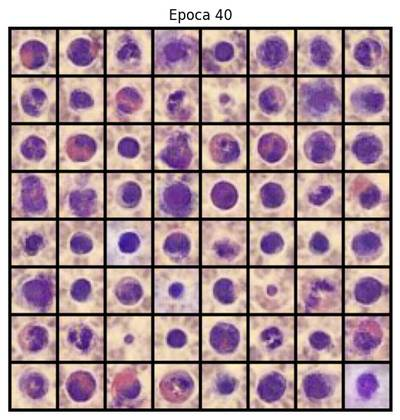

Epoch [40/100] | D_loss: 0.1681 | G_loss: 4.4317
Epoch [41/100] | D_loss: 0.2618 | G_loss: 3.8205
Epoch [42/100] | D_loss: 0.4395 | G_loss: 4.4576
Epoch [43/100] | D_loss: 0.6563 | G_loss: 4.2932
Epoch [44/100] | D_loss: 0.1913 | G_loss: 3.5503
Epoch [45/100] | D_loss: 0.3818 | G_loss: 3.3311
Epoch [46/100] | D_loss: 0.8384 | G_loss: 5.0465
Epoch [47/100] | D_loss: 0.2690 | G_loss: 3.6894
Epoch [48/100] | D_loss: 0.9499 | G_loss: 2.4463
Epoch [49/100] | D_loss: 0.6969 | G_loss: 3.4083


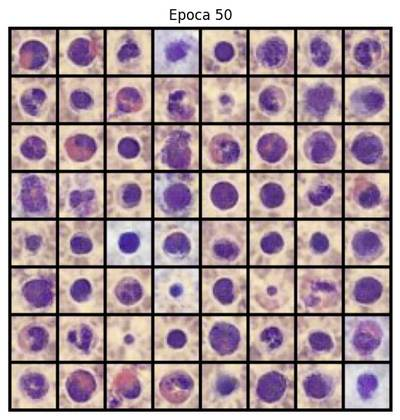

Epoch [50/100] | D_loss: 0.3184 | G_loss: 2.6201
Epoch [51/100] | D_loss: 1.1059 | G_loss: 3.0537
Epoch [52/100] | D_loss: 0.6405 | G_loss: 2.7710
Epoch [53/100] | D_loss: 0.1885 | G_loss: 3.8424
Epoch [54/100] | D_loss: 0.0861 | G_loss: 4.1986
Epoch [55/100] | D_loss: 0.3170 | G_loss: 3.8522
Epoch [56/100] | D_loss: 0.4081 | G_loss: 5.4433
Epoch [57/100] | D_loss: 0.2897 | G_loss: 4.0288
Epoch [58/100] | D_loss: 0.2634 | G_loss: 4.2664
Epoch [59/100] | D_loss: 0.8471 | G_loss: 4.3705


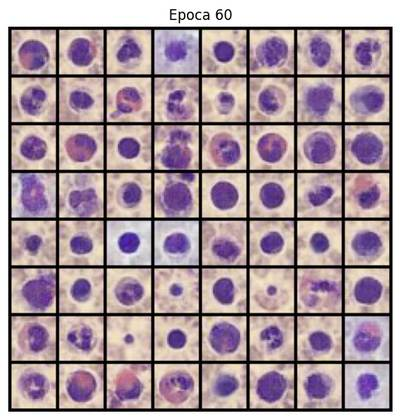

Epoch [60/100] | D_loss: 0.2656 | G_loss: 4.7181
Epoch [61/100] | D_loss: 0.1060 | G_loss: 4.5290
Epoch [62/100] | D_loss: 0.2082 | G_loss: 4.1014
Epoch [63/100] | D_loss: 0.2633 | G_loss: 3.7226
Epoch [64/100] | D_loss: 0.7466 | G_loss: 6.2006
Epoch [65/100] | D_loss: 0.1838 | G_loss: 4.6629
Epoch [66/100] | D_loss: 0.3721 | G_loss: 3.4142
Epoch [67/100] | D_loss: 0.1108 | G_loss: 4.6514
Epoch [68/100] | D_loss: 0.2886 | G_loss: 5.2360
Epoch [69/100] | D_loss: 0.1405 | G_loss: 3.9756


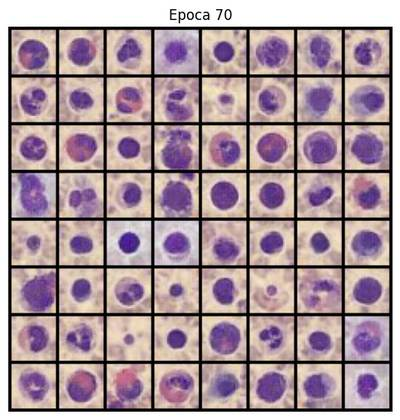

Epoch [70/100] | D_loss: 0.3232 | G_loss: 6.2977
Epoch [71/100] | D_loss: 0.1996 | G_loss: 3.7899
Epoch [72/100] | D_loss: 0.4204 | G_loss: 4.7796
Epoch [73/100] | D_loss: 0.7004 | G_loss: 3.6851
Epoch [74/100] | D_loss: 0.2796 | G_loss: 3.9365
Epoch [75/100] | D_loss: 0.9480 | G_loss: 4.8596
Epoch [76/100] | D_loss: 0.2174 | G_loss: 5.2389
Epoch [77/100] | D_loss: 2.1624 | G_loss: 5.8916
Epoch [78/100] | D_loss: 0.3400 | G_loss: 4.0818
Epoch [79/100] | D_loss: 0.3641 | G_loss: 3.5764


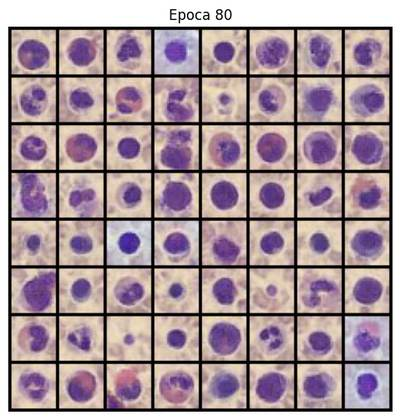

Epoch [80/100] | D_loss: 0.6486 | G_loss: 6.2164
Epoch [81/100] | D_loss: 0.3195 | G_loss: 4.0662
Epoch [82/100] | D_loss: 0.8310 | G_loss: 2.4922
Epoch [83/100] | D_loss: 0.3676 | G_loss: 2.8471
Epoch [84/100] | D_loss: 0.5213 | G_loss: 4.0569
Epoch [85/100] | D_loss: 1.3519 | G_loss: 4.1333
Epoch [86/100] | D_loss: 0.0868 | G_loss: 5.1765
Epoch [87/100] | D_loss: 0.4265 | G_loss: 5.9451
Epoch [88/100] | D_loss: 0.3207 | G_loss: 3.4415
Epoch [89/100] | D_loss: 0.0323 | G_loss: 5.1747


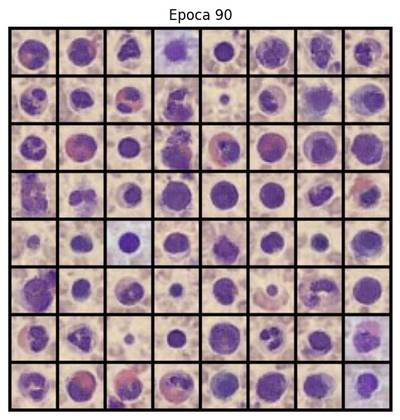

Epoch [90/100] | D_loss: 1.2274 | G_loss: 3.3336
Epoch [91/100] | D_loss: 1.8716 | G_loss: 4.9434
Epoch [92/100] | D_loss: 0.3319 | G_loss: 4.5305
Epoch [93/100] | D_loss: 0.1475 | G_loss: 4.3941
Epoch [94/100] | D_loss: 0.1367 | G_loss: 5.0998
Epoch [95/100] | D_loss: 0.9063 | G_loss: 6.6931
Epoch [96/100] | D_loss: 0.2325 | G_loss: 4.5237
Epoch [97/100] | D_loss: 0.4453 | G_loss: 4.8743
Epoch [98/100] | D_loss: 1.2669 | G_loss: 3.1748
Epoch [99/100] | D_loss: 0.4123 | G_loss: 4.7188


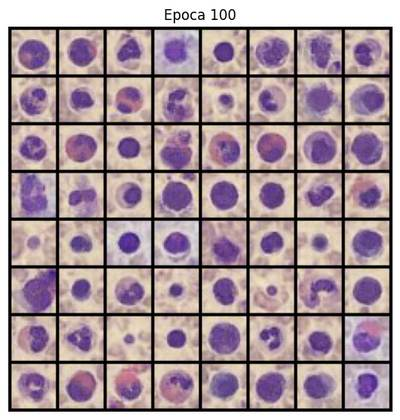

Epoch [100/100] | D_loss: 0.8633 | G_loss: 3.9904
→ FID: 131.3254

Combo 16/16: {'beta1': 0.0, 'epochs': 100, 'feature_d': 128, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0001}


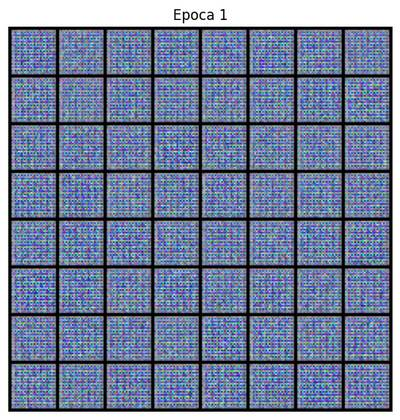

Epoch [1/100] | D_loss: 1.2271 | G_loss: 1.0391
Epoch [2/100] | D_loss: 0.7771 | G_loss: 1.3921
Epoch [3/100] | D_loss: 0.7747 | G_loss: 1.3097
Epoch [4/100] | D_loss: 0.9307 | G_loss: 1.2913
Epoch [5/100] | D_loss: 0.7392 | G_loss: 1.7154
Epoch [6/100] | D_loss: 0.4484 | G_loss: 2.0125
Epoch [7/100] | D_loss: 0.4479 | G_loss: 2.1373
Epoch [8/100] | D_loss: 0.4179 | G_loss: 2.5425
Epoch [9/100] | D_loss: 0.2723 | G_loss: 2.5619


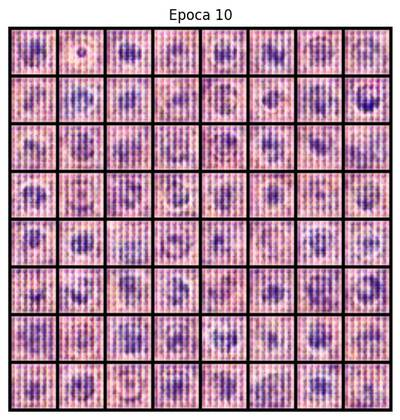

Epoch [10/100] | D_loss: 0.5800 | G_loss: 2.4789
Epoch [11/100] | D_loss: 0.5726 | G_loss: 2.5065
Epoch [12/100] | D_loss: 0.2009 | G_loss: 3.0279
Epoch [13/100] | D_loss: 0.6576 | G_loss: 2.4973
Epoch [14/100] | D_loss: 0.3230 | G_loss: 3.3021
Epoch [15/100] | D_loss: 0.4299 | G_loss: 2.8713
Epoch [16/100] | D_loss: 0.7781 | G_loss: 2.7757
Epoch [17/100] | D_loss: 0.2553 | G_loss: 3.1484
Epoch [18/100] | D_loss: 0.3138 | G_loss: 3.5227
Epoch [19/100] | D_loss: 0.3310 | G_loss: 3.3126


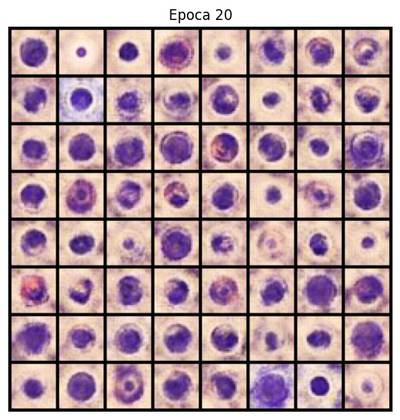

Epoch [20/100] | D_loss: 0.4130 | G_loss: 3.2609
Epoch [21/100] | D_loss: 0.1867 | G_loss: 3.3072
Epoch [22/100] | D_loss: 0.2149 | G_loss: 3.3299
Epoch [23/100] | D_loss: 0.6525 | G_loss: 3.2831
Epoch [24/100] | D_loss: 0.1245 | G_loss: 3.7335
Epoch [25/100] | D_loss: 0.1872 | G_loss: 3.7168
Epoch [26/100] | D_loss: 0.4677 | G_loss: 3.8546
Epoch [27/100] | D_loss: 0.1467 | G_loss: 3.4758
Epoch [28/100] | D_loss: 0.1562 | G_loss: 3.7183
Epoch [29/100] | D_loss: 0.8397 | G_loss: 4.0315


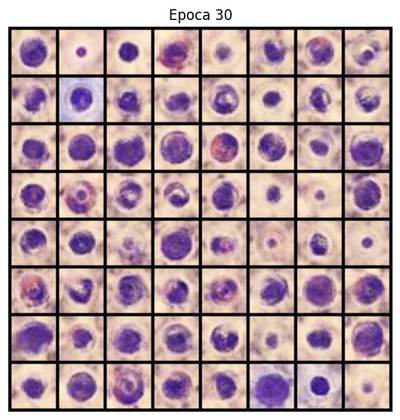

Epoch [30/100] | D_loss: 0.7433 | G_loss: 3.6834
Epoch [31/100] | D_loss: 0.7209 | G_loss: 3.6622
Epoch [32/100] | D_loss: 1.5070 | G_loss: 3.5818
Epoch [33/100] | D_loss: 0.8823 | G_loss: 1.5541
Epoch [34/100] | D_loss: 0.2360 | G_loss: 3.6022
Epoch [35/100] | D_loss: 0.2449 | G_loss: 4.3911
Epoch [36/100] | D_loss: 0.5234 | G_loss: 3.9857
Epoch [37/100] | D_loss: 0.3635 | G_loss: 3.8771
Epoch [38/100] | D_loss: 0.2265 | G_loss: 3.7415
Epoch [39/100] | D_loss: 0.7327 | G_loss: 1.7081


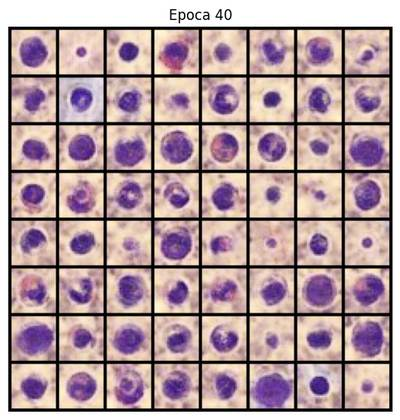

Epoch [40/100] | D_loss: 0.2118 | G_loss: 3.6828
Epoch [41/100] | D_loss: 0.3760 | G_loss: 3.1209
Epoch [42/100] | D_loss: 0.4040 | G_loss: 5.2137
Epoch [43/100] | D_loss: 0.8870 | G_loss: 1.9532
Epoch [44/100] | D_loss: 0.1976 | G_loss: 3.8509
Epoch [45/100] | D_loss: 0.4942 | G_loss: 3.8992
Epoch [46/100] | D_loss: 0.4269 | G_loss: 4.1556
Epoch [47/100] | D_loss: 0.1111 | G_loss: 3.9913
Epoch [48/100] | D_loss: 0.3578 | G_loss: 5.1513
Epoch [49/100] | D_loss: 0.6657 | G_loss: 2.9935


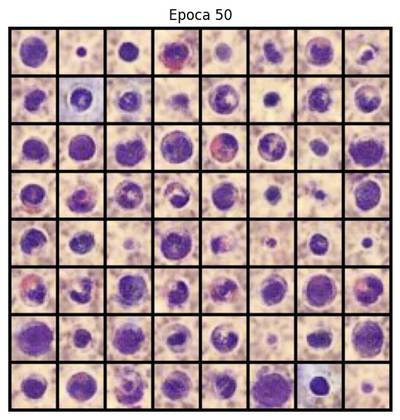

Epoch [50/100] | D_loss: 1.6866 | G_loss: 3.6833
Epoch [51/100] | D_loss: 1.3127 | G_loss: 1.3481
Epoch [52/100] | D_loss: 0.2958 | G_loss: 3.3391
Epoch [53/100] | D_loss: 0.2812 | G_loss: 4.2398
Epoch [54/100] | D_loss: 0.3060 | G_loss: 2.8210
Epoch [55/100] | D_loss: 0.3964 | G_loss: 3.3804
Epoch [56/100] | D_loss: 0.3091 | G_loss: 2.5556
Epoch [57/100] | D_loss: 0.6642 | G_loss: 2.8914
Epoch [58/100] | D_loss: 0.1396 | G_loss: 4.1718
Epoch [59/100] | D_loss: 0.5496 | G_loss: 3.0992


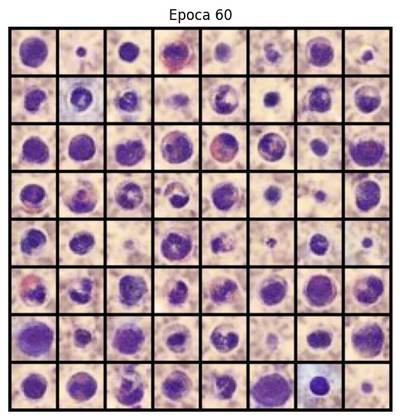

Epoch [60/100] | D_loss: 0.0824 | G_loss: 4.2893
Epoch [61/100] | D_loss: 0.3811 | G_loss: 5.0373
Epoch [62/100] | D_loss: 0.1086 | G_loss: 4.3889
Epoch [63/100] | D_loss: 0.1012 | G_loss: 4.3524
Epoch [64/100] | D_loss: 0.1923 | G_loss: 4.4943
Epoch [65/100] | D_loss: 0.1279 | G_loss: 4.0962
Epoch [66/100] | D_loss: 0.8932 | G_loss: 2.9448
Epoch [67/100] | D_loss: 0.1322 | G_loss: 3.6872
Epoch [68/100] | D_loss: 0.3466 | G_loss: 4.2512
Epoch [69/100] | D_loss: 0.0785 | G_loss: 4.4693


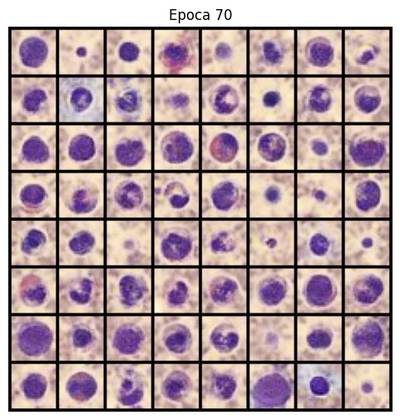

Epoch [70/100] | D_loss: 0.4994 | G_loss: 3.7564
Epoch [71/100] | D_loss: 0.1414 | G_loss: 4.0655
Epoch [72/100] | D_loss: 0.2822 | G_loss: 3.2580
Epoch [73/100] | D_loss: 0.5331 | G_loss: 2.0025
Epoch [74/100] | D_loss: 0.1077 | G_loss: 4.5041
Epoch [75/100] | D_loss: 0.0497 | G_loss: 4.6259
Epoch [76/100] | D_loss: 0.2478 | G_loss: 4.6915
Epoch [77/100] | D_loss: 1.7537 | G_loss: 4.5420
Epoch [78/100] | D_loss: 0.2613 | G_loss: 3.9343
Epoch [79/100] | D_loss: 0.3146 | G_loss: 4.1598


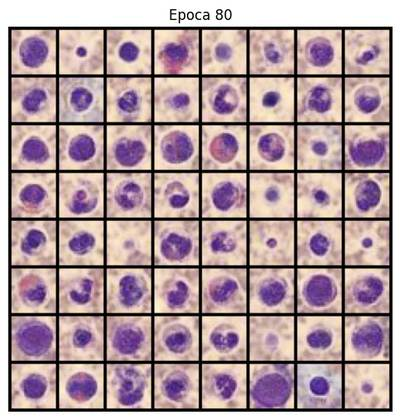

Epoch [80/100] | D_loss: 1.1004 | G_loss: 2.2024
Epoch [81/100] | D_loss: 0.1620 | G_loss: 4.4236
Epoch [82/100] | D_loss: 0.1237 | G_loss: 3.8463
Epoch [83/100] | D_loss: 0.2011 | G_loss: 4.0775
Epoch [84/100] | D_loss: 1.8921 | G_loss: 2.1178
Epoch [85/100] | D_loss: 1.1772 | G_loss: 3.5741
Epoch [86/100] | D_loss: 0.1243 | G_loss: 4.6863
Epoch [87/100] | D_loss: 0.5691 | G_loss: 4.9000
Epoch [88/100] | D_loss: 0.4645 | G_loss: 3.9602
Epoch [89/100] | D_loss: 0.0514 | G_loss: 4.5286


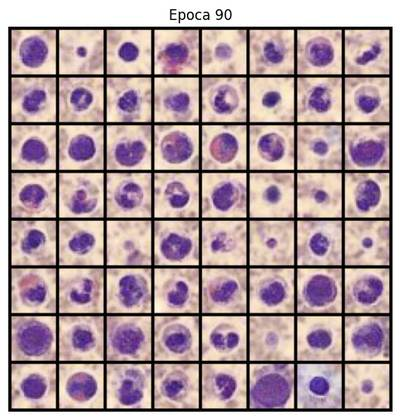

Epoch [90/100] | D_loss: 0.2529 | G_loss: 4.4546
Epoch [91/100] | D_loss: 0.6072 | G_loss: 1.8519
Epoch [92/100] | D_loss: 0.2268 | G_loss: 4.1212
Epoch [93/100] | D_loss: 0.0847 | G_loss: 5.7862
Epoch [94/100] | D_loss: 0.2571 | G_loss: 3.5032
Epoch [95/100] | D_loss: 0.0379 | G_loss: 4.9020
Epoch [96/100] | D_loss: 0.2843 | G_loss: 3.7693
Epoch [97/100] | D_loss: 0.4242 | G_loss: 2.5759
Epoch [98/100] | D_loss: 0.1285 | G_loss: 4.9121
Epoch [99/100] | D_loss: 0.4603 | G_loss: 2.1395


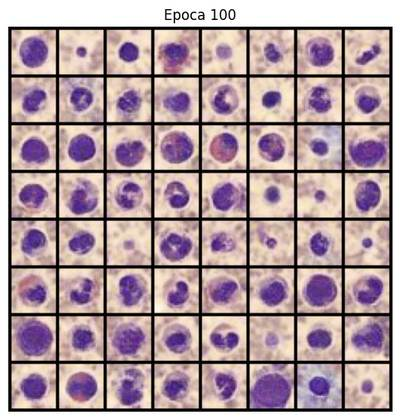

Epoch [100/100] | D_loss: 0.0601 | G_loss: 4.8611
→ FID: 135.9219

Best DCGAN hparams: {'beta1': 0.5, 'epochs': 100, 'feature_d': 128, 'feature_g': 128, 'latent_dim': 100, 'lr': 0.0001} with FID 129.4573


In [ ]:
# Cell 5: Hyperparameter tuning (16 combinations)
from sklearn.model_selection import ParameterGrid

# === Define the hyperparameter search space ===
param_grid = {
    'latent_dim': [100],             # Standard latent size used in many DCGANs
    'lr': [2e-4, 1e-4],              # Learning rates to test
    'beta1': [0.5, 0.0],             # Momentum term (0.5 is classic for DCGAN, 0.0 for more recent experiments)
    'feature_g': [64, 128],          # Generator base channel size
    'feature_d': [64, 128],          # Discriminator base channel size
    'epochs': [100]                  # Fixed number of training epochs
}

# === Generate all combinations ===
dcgan_hparams = list(ParameterGrid(param_grid))
print(f"Total DCGAN hyperparam combos: {len(dcgan_hparams)}")

# === Perform grid search with FID evaluation ===
dcgan_results = []

for i, hp in enumerate(dcgan_hparams, 1):
    print(f"\nCombo {i}/{len(dcgan_hparams)}: {hp}")

    # Ensure reproducibility
    set_seed(INITIAL_SEED)

    # Train DCGAN with current hyperparameters
    netG, netD = train_dcgan(hp, dataloader, DEVICE)

    # Generate fake images for FID evaluation
    fake = generate_fake_data(
        netG,
        n_samples=len(real_samples),
        latent_dim=hp['latent_dim'],
        device=DEVICE
    )

    # Compute Frechet Inception Distance
    fid_score = compute_fid(real_samples, fake)

    # Store results
    dcgan_results.append({
        'hparams': hp,
        'fid': fid_score,
        'state_dict': netG.state_dict()
    })

    print(f"→ FID: {fid_score:.4f}")

# === Select and save the best model ===
dcgan_results.sort(key=lambda x: x['fid'])  # Lower FID = better
best_dcgan = dcgan_results[0]
print(f"\nBest DCGAN hparams: {best_dcgan['hparams']} with FID {best_dcgan['fid']:.4f}")

# Save generator weights of the best model
torch.save(best_dcgan['state_dict'], 'best_bloodmnist_dcgan.pth')


Seed 42


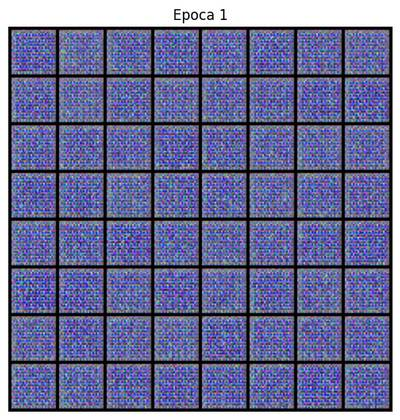

Epoch [1/100] | D_loss: 0.9565 | G_loss: 1.0802
Epoch [2/100] | D_loss: 0.6794 | G_loss: 1.4089
Epoch [3/100] | D_loss: 0.9661 | G_loss: 1.2243
Epoch [4/100] | D_loss: 0.9105 | G_loss: 1.4127
Epoch [5/100] | D_loss: 0.7781 | G_loss: 1.3721
Epoch [6/100] | D_loss: 0.5188 | G_loss: 1.8822
Epoch [7/100] | D_loss: 0.9998 | G_loss: 1.6785
Epoch [8/100] | D_loss: 0.5363 | G_loss: 2.1467
Epoch [9/100] | D_loss: 0.2858 | G_loss: 2.3596


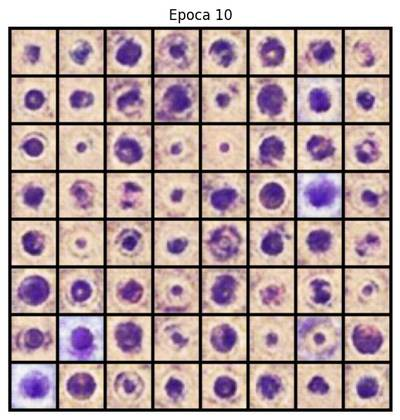

Epoch [10/100] | D_loss: 0.5749 | G_loss: 1.8076
Epoch [11/100] | D_loss: 0.4842 | G_loss: 2.6177
Epoch [12/100] | D_loss: 0.4382 | G_loss: 2.7655
Epoch [13/100] | D_loss: 0.2005 | G_loss: 2.7856
Epoch [14/100] | D_loss: 0.0889 | G_loss: 3.4815
Epoch [15/100] | D_loss: 0.2047 | G_loss: 2.8076
Epoch [16/100] | D_loss: 0.2967 | G_loss: 3.0805
Epoch [17/100] | D_loss: 0.2359 | G_loss: 2.9512
Epoch [18/100] | D_loss: 0.3747 | G_loss: 3.3852
Epoch [19/100] | D_loss: 0.0437 | G_loss: 4.0110


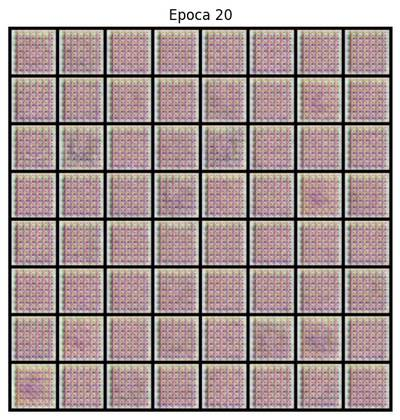

Epoch [20/100] | D_loss: 0.0928 | G_loss: 4.1180
Epoch [21/100] | D_loss: 0.2477 | G_loss: 4.5804
Epoch [22/100] | D_loss: 0.0661 | G_loss: 4.1136
Epoch [23/100] | D_loss: 0.3957 | G_loss: 3.8091
Epoch [24/100] | D_loss: 0.1501 | G_loss: 4.7014
Epoch [25/100] | D_loss: 0.1369 | G_loss: 3.0532
Epoch [26/100] | D_loss: 0.1226 | G_loss: 3.4451
Epoch [27/100] | D_loss: 0.2301 | G_loss: 1.9770
Epoch [28/100] | D_loss: 0.1590 | G_loss: 2.4514
Epoch [29/100] | D_loss: 0.0953 | G_loss: 2.8444


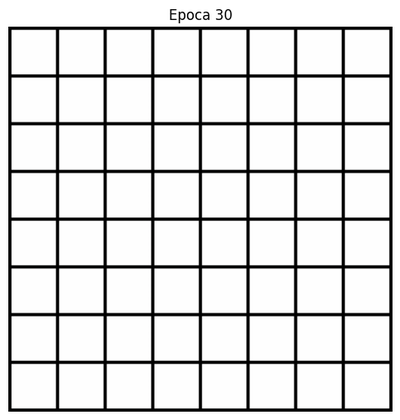

Epoch [30/100] | D_loss: 0.0679 | G_loss: 3.1904
Epoch [31/100] | D_loss: 0.0495 | G_loss: 3.3396
Epoch [32/100] | D_loss: 0.0774 | G_loss: 3.5903
Epoch [33/100] | D_loss: 0.0532 | G_loss: 3.7971
Epoch [34/100] | D_loss: 0.0351 | G_loss: 4.1265
Epoch [35/100] | D_loss: 0.0252 | G_loss: 4.1802
Epoch [36/100] | D_loss: 0.0208 | G_loss: 4.6939
Epoch [37/100] | D_loss: 0.0510 | G_loss: 4.3523
Epoch [38/100] | D_loss: 0.0232 | G_loss: 5.0427
Epoch [39/100] | D_loss: 0.0353 | G_loss: 4.8579


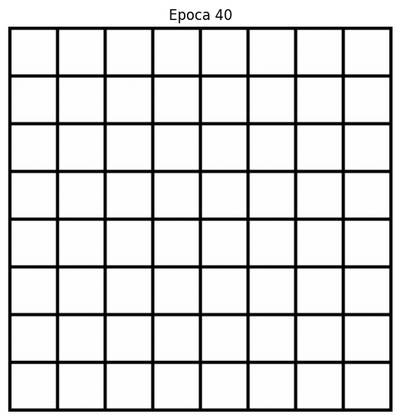

Epoch [40/100] | D_loss: 0.0124 | G_loss: 4.8352
Epoch [41/100] | D_loss: 0.0965 | G_loss: 5.5024
Epoch [42/100] | D_loss: 0.0118 | G_loss: 4.8637
Epoch [43/100] | D_loss: 0.0101 | G_loss: 5.2668
Epoch [44/100] | D_loss: 0.0083 | G_loss: 5.2750
Epoch [45/100] | D_loss: 0.0352 | G_loss: 5.2652
Epoch [46/100] | D_loss: 0.0084 | G_loss: 5.7168
Epoch [47/100] | D_loss: 0.0130 | G_loss: 5.1825
Epoch [48/100] | D_loss: 0.0598 | G_loss: 4.4722
Epoch [49/100] | D_loss: 0.0803 | G_loss: 4.7051


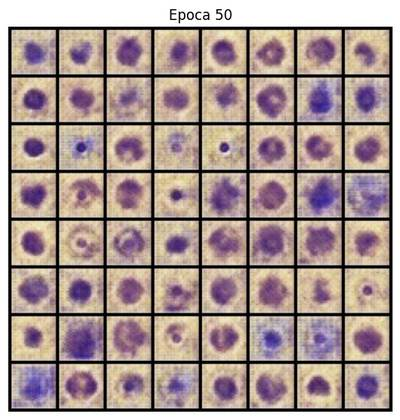

Epoch [50/100] | D_loss: 0.0918 | G_loss: 3.6345
Epoch [51/100] | D_loss: 0.2060 | G_loss: 4.6857
Epoch [52/100] | D_loss: 0.4905 | G_loss: 3.5813
Epoch [53/100] | D_loss: 0.6134 | G_loss: 3.2591
Epoch [54/100] | D_loss: 0.0593 | G_loss: 4.8871
Epoch [55/100] | D_loss: 0.0995 | G_loss: 3.9630
Epoch [56/100] | D_loss: 1.2245 | G_loss: 1.2434
Epoch [57/100] | D_loss: 0.3431 | G_loss: 3.7487
Epoch [58/100] | D_loss: 0.5014 | G_loss: 2.9170
Epoch [59/100] | D_loss: 0.2133 | G_loss: 3.8042


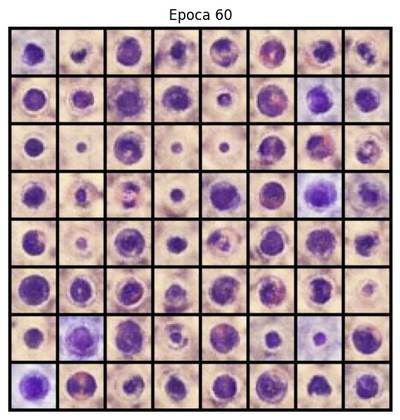

Epoch [60/100] | D_loss: 0.2330 | G_loss: 2.9887
Epoch [61/100] | D_loss: 0.5400 | G_loss: 3.6507
Epoch [62/100] | D_loss: 0.2976 | G_loss: 3.3200
Epoch [63/100] | D_loss: 0.2135 | G_loss: 4.1543
Epoch [64/100] | D_loss: 0.4078 | G_loss: 2.4938
Epoch [65/100] | D_loss: 0.2186 | G_loss: 3.7808
Epoch [66/100] | D_loss: 0.3151 | G_loss: 4.2273
Epoch [67/100] | D_loss: 0.1305 | G_loss: 4.1342
Epoch [68/100] | D_loss: 0.0370 | G_loss: 4.3747
Epoch [69/100] | D_loss: 0.0788 | G_loss: 4.6620


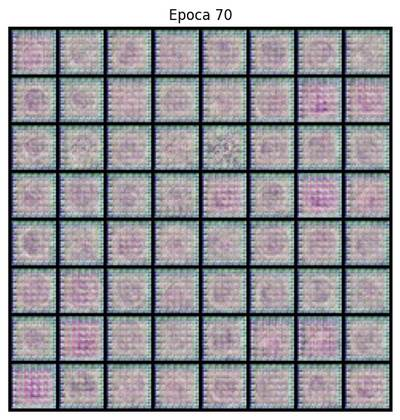

Epoch [70/100] | D_loss: 0.0510 | G_loss: 4.5184
Epoch [71/100] | D_loss: 0.0691 | G_loss: 5.1234
Epoch [72/100] | D_loss: 0.0223 | G_loss: 5.5867
Epoch [73/100] | D_loss: 0.2011 | G_loss: 5.3758
Epoch [74/100] | D_loss: 0.0279 | G_loss: 5.2142
Epoch [75/100] | D_loss: 0.0339 | G_loss: 7.3462
Epoch [76/100] | D_loss: 0.0091 | G_loss: 7.1934
Epoch [77/100] | D_loss: 0.1490 | G_loss: 4.8039
Epoch [78/100] | D_loss: 0.3195 | G_loss: 3.5303
Epoch [79/100] | D_loss: 0.3515 | G_loss: 2.9484


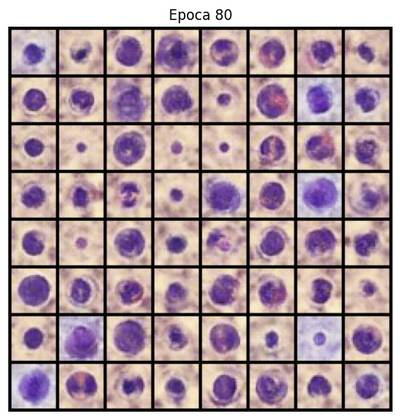

Epoch [80/100] | D_loss: 0.1867 | G_loss: 2.9085
Epoch [81/100] | D_loss: 0.1708 | G_loss: 4.0428
Epoch [82/100] | D_loss: 0.1449 | G_loss: 3.7943
Epoch [83/100] | D_loss: 0.1888 | G_loss: 3.5988
Epoch [84/100] | D_loss: 0.0818 | G_loss: 4.1487
Epoch [85/100] | D_loss: 0.2072 | G_loss: 2.3504
Epoch [86/100] | D_loss: 0.5804 | G_loss: 2.1522
Epoch [87/100] | D_loss: 0.1465 | G_loss: 3.9089
Epoch [88/100] | D_loss: 0.1814 | G_loss: 3.4349
Epoch [89/100] | D_loss: 0.5440 | G_loss: 4.3762


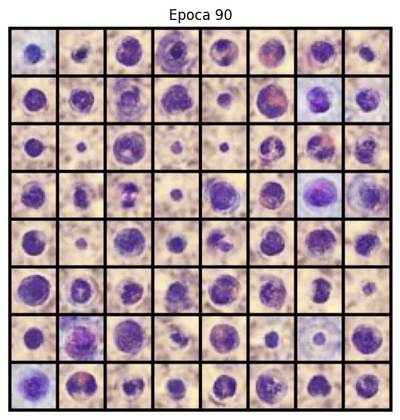

Epoch [90/100] | D_loss: 0.3041 | G_loss: 4.2369
Epoch [91/100] | D_loss: 0.5555 | G_loss: 2.2864
Epoch [92/100] | D_loss: 0.1362 | G_loss: 4.2384
Epoch [93/100] | D_loss: 0.7189 | G_loss: 1.0367
Epoch [94/100] | D_loss: 0.6338 | G_loss: 2.0364
Epoch [95/100] | D_loss: 2.0793 | G_loss: 2.3465
Epoch [96/100] | D_loss: 0.2096 | G_loss: 3.8556
Epoch [97/100] | D_loss: 0.3609 | G_loss: 2.5817
Epoch [98/100] | D_loss: 0.6216 | G_loss: 1.6911
Epoch [99/100] | D_loss: 0.4613 | G_loss: 2.8611


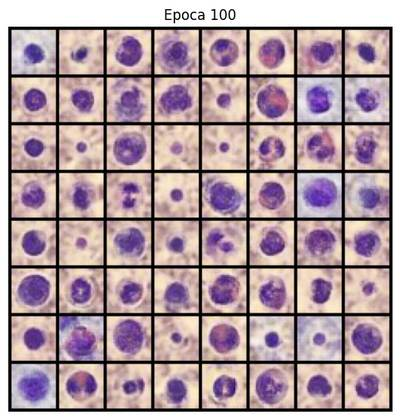

Epoch [100/100] | D_loss: 0.5515 | G_loss: 3.8489
→ FID: 155.4289

Seed 123


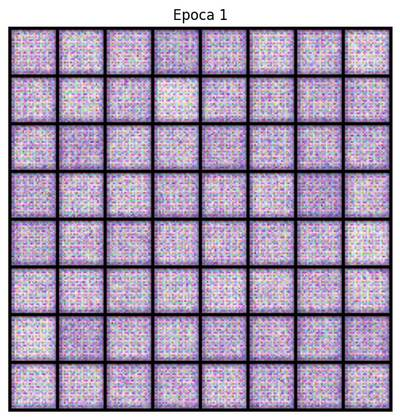

Epoch [1/100] | D_loss: 1.0018 | G_loss: 1.0552
Epoch [2/100] | D_loss: 1.1218 | G_loss: 1.0505
Epoch [3/100] | D_loss: 0.9418 | G_loss: 1.0480
Epoch [4/100] | D_loss: 0.8885 | G_loss: 1.3051
Epoch [5/100] | D_loss: 0.5846 | G_loss: 1.5811
Epoch [6/100] | D_loss: 0.8016 | G_loss: 1.5588
Epoch [7/100] | D_loss: 0.7705 | G_loss: 1.4493
Epoch [8/100] | D_loss: 0.7468 | G_loss: 1.3809
Epoch [9/100] | D_loss: 0.6051 | G_loss: 1.5403


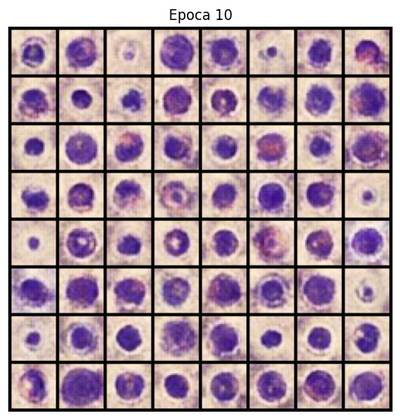

Epoch [10/100] | D_loss: 0.7253 | G_loss: 2.3313
Epoch [11/100] | D_loss: 0.5278 | G_loss: 2.5135
Epoch [12/100] | D_loss: 0.5112 | G_loss: 2.2658
Epoch [13/100] | D_loss: 0.6162 | G_loss: 2.2154
Epoch [14/100] | D_loss: 0.8741 | G_loss: 1.8050
Epoch [15/100] | D_loss: 0.1897 | G_loss: 2.9243
Epoch [16/100] | D_loss: 0.8097 | G_loss: 3.2402
Epoch [17/100] | D_loss: 1.3463 | G_loss: 1.5484
Epoch [18/100] | D_loss: 0.3825 | G_loss: 2.6331
Epoch [19/100] | D_loss: 0.8174 | G_loss: 2.7007


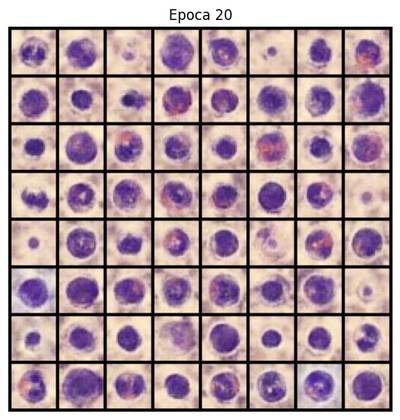

Epoch [20/100] | D_loss: 0.4047 | G_loss: 2.4309
Epoch [21/100] | D_loss: 0.8982 | G_loss: 2.5869
Epoch [22/100] | D_loss: 0.3666 | G_loss: 2.2725
Epoch [23/100] | D_loss: 0.2085 | G_loss: 3.4918
Epoch [24/100] | D_loss: 0.2373 | G_loss: 3.3056
Epoch [25/100] | D_loss: 1.4617 | G_loss: 2.1957
Epoch [26/100] | D_loss: 0.4389 | G_loss: 2.2520
Epoch [27/100] | D_loss: 0.4486 | G_loss: 2.7840
Epoch [28/100] | D_loss: 0.5665 | G_loss: 2.7380
Epoch [29/100] | D_loss: 0.1930 | G_loss: 3.1516


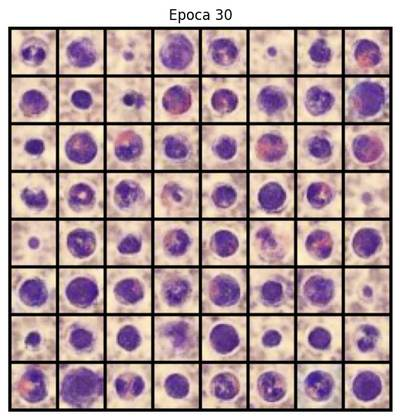

Epoch [30/100] | D_loss: 0.9266 | G_loss: 2.7070
Epoch [31/100] | D_loss: 0.2925 | G_loss: 3.7938
Epoch [32/100] | D_loss: 0.5289 | G_loss: 2.2307
Epoch [33/100] | D_loss: 0.3141 | G_loss: 3.3259
Epoch [34/100] | D_loss: 0.2264 | G_loss: 3.0955
Epoch [35/100] | D_loss: 1.5602 | G_loss: 1.9689
Epoch [36/100] | D_loss: 0.4508 | G_loss: 2.9148
Epoch [37/100] | D_loss: 0.6227 | G_loss: 3.1486
Epoch [38/100] | D_loss: 0.6995 | G_loss: 2.1260
Epoch [39/100] | D_loss: 0.8019 | G_loss: 2.3716


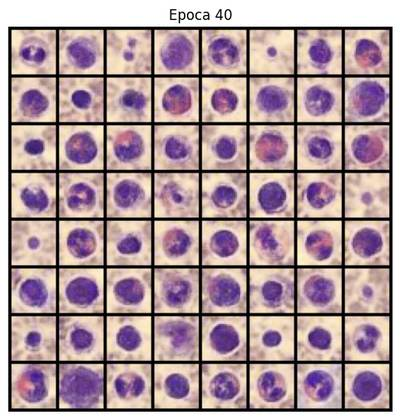

Epoch [40/100] | D_loss: 0.1847 | G_loss: 3.1806
Epoch [41/100] | D_loss: 0.1953 | G_loss: 4.0775
Epoch [42/100] | D_loss: 1.5791 | G_loss: 1.1748
Epoch [43/100] | D_loss: 0.7429 | G_loss: 2.5732
Epoch [44/100] | D_loss: 0.2488 | G_loss: 3.4346
Epoch [45/100] | D_loss: 0.1406 | G_loss: 3.6499
Epoch [46/100] | D_loss: 0.9208 | G_loss: 2.1409
Epoch [47/100] | D_loss: 0.0977 | G_loss: 4.1215
Epoch [48/100] | D_loss: 0.0671 | G_loss: 3.8038
Epoch [49/100] | D_loss: 0.0546 | G_loss: 3.7661


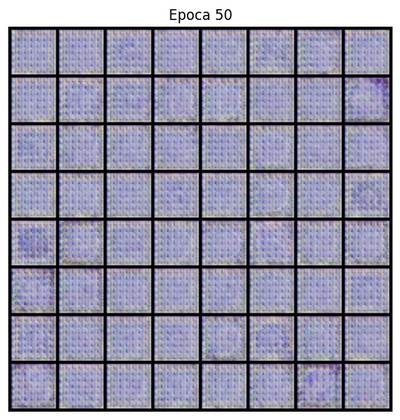

Epoch [50/100] | D_loss: 0.0706 | G_loss: 4.2337
Epoch [51/100] | D_loss: 0.0394 | G_loss: 4.5165
Epoch [52/100] | D_loss: 0.0698 | G_loss: 4.7569
Epoch [53/100] | D_loss: 0.0612 | G_loss: 3.9036
Epoch [54/100] | D_loss: 0.0340 | G_loss: 4.6212
Epoch [55/100] | D_loss: 0.0679 | G_loss: 3.4422
Epoch [56/100] | D_loss: 0.9001 | G_loss: 3.2432
Epoch [57/100] | D_loss: 0.0397 | G_loss: 6.2932
Epoch [58/100] | D_loss: 0.4326 | G_loss: 5.3818
Epoch [59/100] | D_loss: 0.2170 | G_loss: 4.4724


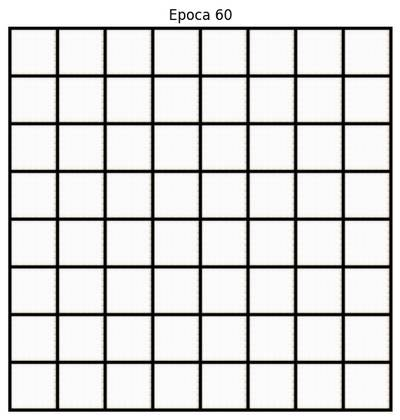

Epoch [60/100] | D_loss: 0.0427 | G_loss: 4.3225
Epoch [61/100] | D_loss: 0.2036 | G_loss: 4.8347
Epoch [62/100] | D_loss: 0.3516 | G_loss: 6.7117
Epoch [63/100] | D_loss: 0.1606 | G_loss: 4.5566
Epoch [64/100] | D_loss: 0.1874 | G_loss: 4.0616
Epoch [65/100] | D_loss: 0.2161 | G_loss: 2.9454
Epoch [66/100] | D_loss: 0.0644 | G_loss: 3.2462
Epoch [67/100] | D_loss: 0.0482 | G_loss: 3.5471
Epoch [68/100] | D_loss: 0.0254 | G_loss: 4.2712
Epoch [69/100] | D_loss: 0.0257 | G_loss: 4.6587


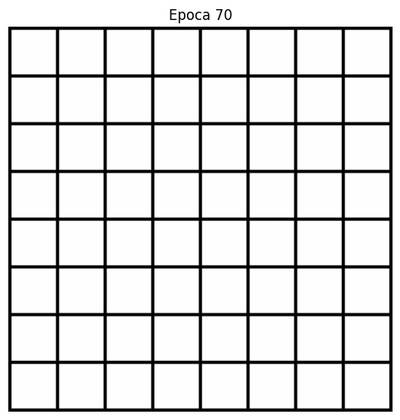

Epoch [70/100] | D_loss: 0.0293 | G_loss: 3.8695
Epoch [71/100] | D_loss: 0.0884 | G_loss: 4.4097
Epoch [72/100] | D_loss: 0.0152 | G_loss: 4.5355
Epoch [73/100] | D_loss: 0.0152 | G_loss: 4.8061
Epoch [74/100] | D_loss: 0.0160 | G_loss: 4.7781
Epoch [75/100] | D_loss: 0.0136 | G_loss: 5.2988
Epoch [76/100] | D_loss: 0.0304 | G_loss: 4.8216
Epoch [77/100] | D_loss: 0.0243 | G_loss: 5.0887
Epoch [78/100] | D_loss: 0.4537 | G_loss: 5.6447
Epoch [79/100] | D_loss: 0.0140 | G_loss: 5.1098


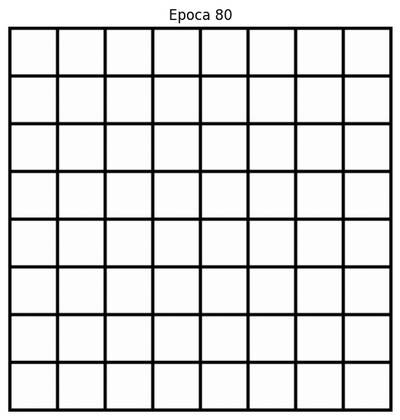

Epoch [80/100] | D_loss: 0.0097 | G_loss: 5.4717
Epoch [81/100] | D_loss: 0.0075 | G_loss: 5.7156
Epoch [82/100] | D_loss: 0.0058 | G_loss: 6.8500
Epoch [83/100] | D_loss: 0.0103 | G_loss: 6.3791
Epoch [84/100] | D_loss: 0.0099 | G_loss: 5.4177
Epoch [85/100] | D_loss: 0.0175 | G_loss: 5.4386
Epoch [86/100] | D_loss: 0.0579 | G_loss: 4.8359
Epoch [87/100] | D_loss: 0.0127 | G_loss: 5.7174
Epoch [88/100] | D_loss: 0.0814 | G_loss: 6.0308
Epoch [89/100] | D_loss: 0.0245 | G_loss: 5.3899


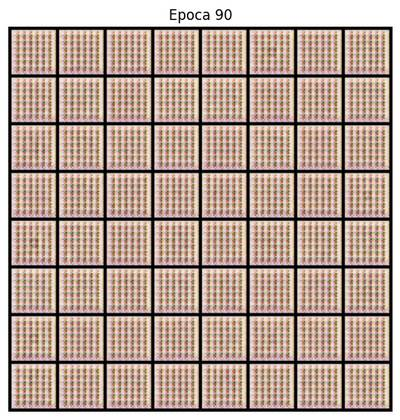

Epoch [90/100] | D_loss: 0.0428 | G_loss: 5.2716
Epoch [91/100] | D_loss: 0.0438 | G_loss: 6.0262
Epoch [92/100] | D_loss: 0.0965 | G_loss: 4.5363
Epoch [93/100] | D_loss: 1.3743 | G_loss: 1.1150
Epoch [94/100] | D_loss: 0.0767 | G_loss: 4.2390
Epoch [95/100] | D_loss: 0.0393 | G_loss: 4.6236
Epoch [96/100] | D_loss: 0.0088 | G_loss: 7.2941
Epoch [97/100] | D_loss: 0.1359 | G_loss: 4.5438
Epoch [98/100] | D_loss: 0.6570 | G_loss: 3.8088
Epoch [99/100] | D_loss: 3.3068 | G_loss: 2.6545


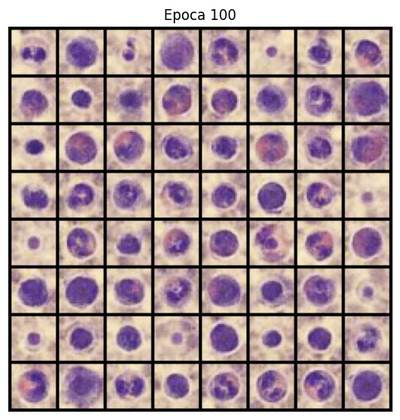

Epoch [100/100] | D_loss: 0.0657 | G_loss: 4.3313
→ FID: 190.0015

Seed 456


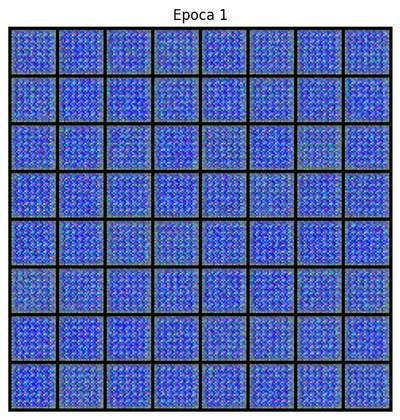

Epoch [1/100] | D_loss: 0.6894 | G_loss: 1.3726
Epoch [2/100] | D_loss: 1.3171 | G_loss: 1.7553
Epoch [3/100] | D_loss: 0.7972 | G_loss: 1.5757
Epoch [4/100] | D_loss: 0.9877 | G_loss: 1.3374
Epoch [5/100] | D_loss: 0.9428 | G_loss: 1.9666
Epoch [6/100] | D_loss: 0.4019 | G_loss: 2.4310
Epoch [7/100] | D_loss: 0.5214 | G_loss: 2.0459
Epoch [8/100] | D_loss: 0.4064 | G_loss: 1.7492
Epoch [9/100] | D_loss: 0.5319 | G_loss: 2.1001


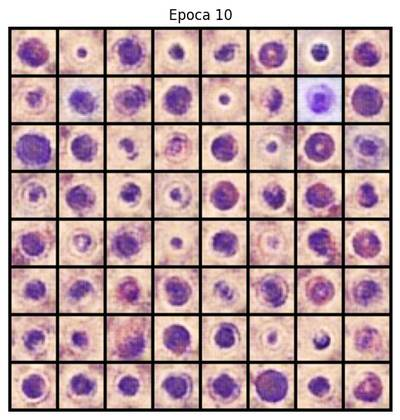

Epoch [10/100] | D_loss: 0.4952 | G_loss: 2.1952
Epoch [11/100] | D_loss: 0.5544 | G_loss: 1.6194
Epoch [12/100] | D_loss: 0.5454 | G_loss: 2.1851
Epoch [13/100] | D_loss: 0.6544 | G_loss: 2.5996
Epoch [14/100] | D_loss: 0.1361 | G_loss: 2.8932
Epoch [15/100] | D_loss: 0.2915 | G_loss: 3.2464
Epoch [16/100] | D_loss: 0.8998 | G_loss: 1.5288
Epoch [17/100] | D_loss: 0.5469 | G_loss: 2.4744
Epoch [18/100] | D_loss: 0.7112 | G_loss: 2.3736
Epoch [19/100] | D_loss: 0.0964 | G_loss: 2.8917


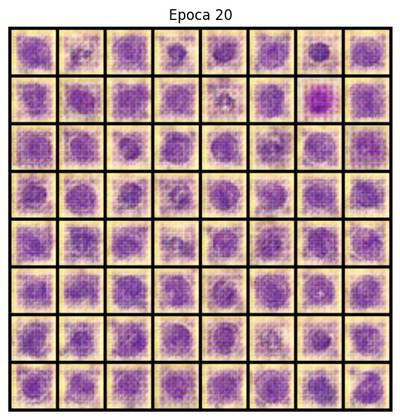

Epoch [20/100] | D_loss: 1.7410 | G_loss: 3.3503
Epoch [21/100] | D_loss: 0.5654 | G_loss: 2.2641
Epoch [22/100] | D_loss: 0.3224 | G_loss: 3.9285
Epoch [23/100] | D_loss: 0.2967 | G_loss: 2.9016
Epoch [24/100] | D_loss: 2.6947 | G_loss: 2.0435
Epoch [25/100] | D_loss: 0.2352 | G_loss: 3.0175
Epoch [26/100] | D_loss: 0.0703 | G_loss: 3.3154
Epoch [27/100] | D_loss: 0.0555 | G_loss: 3.5895
Epoch [28/100] | D_loss: 0.6796 | G_loss: 3.2120
Epoch [29/100] | D_loss: 0.2444 | G_loss: 2.8398


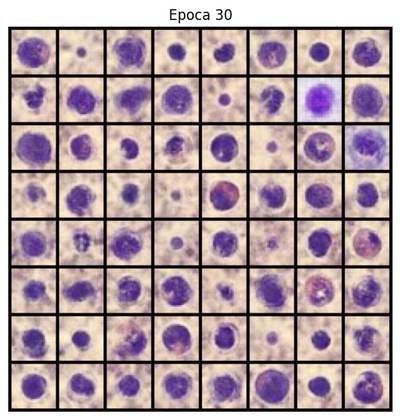

Epoch [30/100] | D_loss: 2.2214 | G_loss: 3.0939
Epoch [31/100] | D_loss: 0.6185 | G_loss: 1.6049
Epoch [32/100] | D_loss: 1.4161 | G_loss: 2.9387
Epoch [33/100] | D_loss: 1.6450 | G_loss: 2.6915
Epoch [34/100] | D_loss: 0.0960 | G_loss: 2.9245
Epoch [35/100] | D_loss: 0.1210 | G_loss: 3.0848
Epoch [36/100] | D_loss: 0.4456 | G_loss: 2.3367
Epoch [37/100] | D_loss: 0.3249 | G_loss: 2.9657
Epoch [38/100] | D_loss: 1.7016 | G_loss: 3.1804
Epoch [39/100] | D_loss: 0.2416 | G_loss: 2.9923


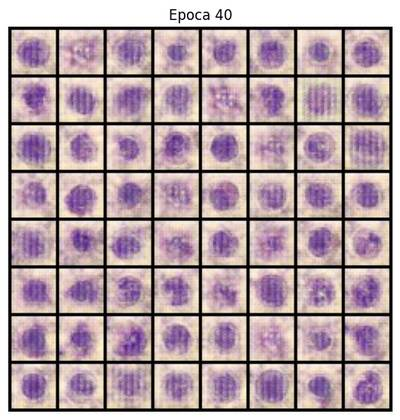

Epoch [40/100] | D_loss: 0.0774 | G_loss: 3.3610
Epoch [41/100] | D_loss: 0.1382 | G_loss: 3.5346
Epoch [42/100] | D_loss: 0.0469 | G_loss: 4.1093
Epoch [43/100] | D_loss: 0.0689 | G_loss: 3.4748
Epoch [44/100] | D_loss: 0.0411 | G_loss: 3.8090
Epoch [45/100] | D_loss: 0.6984 | G_loss: 3.6739
Epoch [46/100] | D_loss: 0.5916 | G_loss: 4.1860
Epoch [47/100] | D_loss: 0.0781 | G_loss: 3.7415
Epoch [48/100] | D_loss: 0.3180 | G_loss: 4.5931
Epoch [49/100] | D_loss: 0.0312 | G_loss: 4.1690


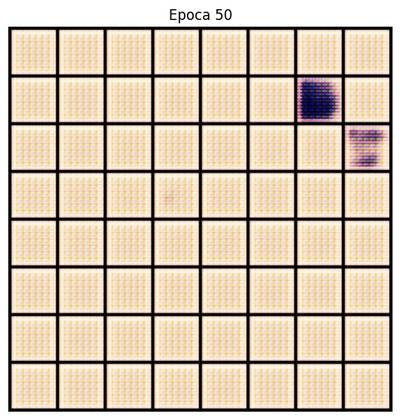

Epoch [50/100] | D_loss: 0.3633 | G_loss: 3.3712
Epoch [51/100] | D_loss: 0.8012 | G_loss: 3.5782
Epoch [52/100] | D_loss: 0.0916 | G_loss: 3.0655
Epoch [53/100] | D_loss: 0.1792 | G_loss: 4.0225
Epoch [54/100] | D_loss: 0.0753 | G_loss: 3.0720
Epoch [55/100] | D_loss: 0.0632 | G_loss: 3.4768
Epoch [56/100] | D_loss: 0.2274 | G_loss: 3.7764
Epoch [57/100] | D_loss: 0.0464 | G_loss: 3.2078
Epoch [58/100] | D_loss: 0.3213 | G_loss: 3.6477
Epoch [59/100] | D_loss: 0.1545 | G_loss: 3.7797


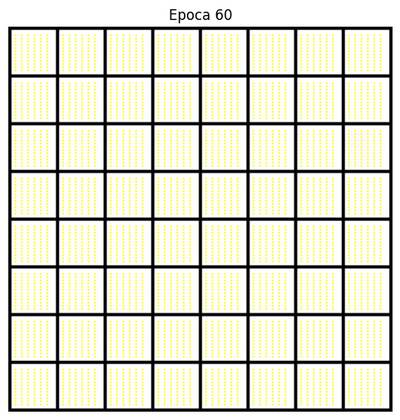

Epoch [60/100] | D_loss: 0.1049 | G_loss: 3.0152
Epoch [61/100] | D_loss: 0.5080 | G_loss: 3.1656
Epoch [62/100] | D_loss: 0.1945 | G_loss: 3.0366
Epoch [63/100] | D_loss: 0.0498 | G_loss: 3.0842
Epoch [64/100] | D_loss: 0.0358 | G_loss: 3.4146
Epoch [65/100] | D_loss: 0.0305 | G_loss: 3.6519
Epoch [66/100] | D_loss: 0.0234 | G_loss: 4.0621
Epoch [67/100] | D_loss: 0.0542 | G_loss: 4.0439
Epoch [68/100] | D_loss: 0.0224 | G_loss: 4.0893
Epoch [69/100] | D_loss: 0.0167 | G_loss: 4.2411


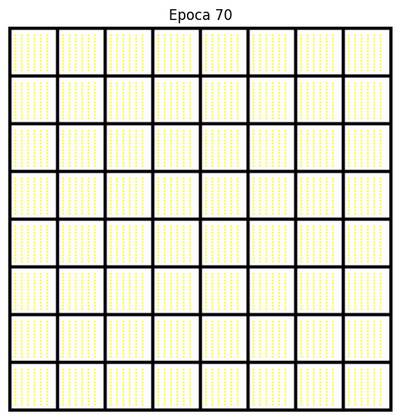

Epoch [70/100] | D_loss: 0.0268 | G_loss: 4.3949
Epoch [71/100] | D_loss: 0.0145 | G_loss: 4.5629
Epoch [72/100] | D_loss: 0.0165 | G_loss: 4.8246
Epoch [73/100] | D_loss: 0.0122 | G_loss: 4.8006
Epoch [74/100] | D_loss: 0.0279 | G_loss: 4.9949
Epoch [75/100] | D_loss: 0.0116 | G_loss: 4.7655
Epoch [76/100] | D_loss: 0.0197 | G_loss: 4.7842
Epoch [77/100] | D_loss: 0.0082 | G_loss: 5.0363
Epoch [78/100] | D_loss: 0.0088 | G_loss: 4.9122
Epoch [79/100] | D_loss: 0.0077 | G_loss: 5.1871


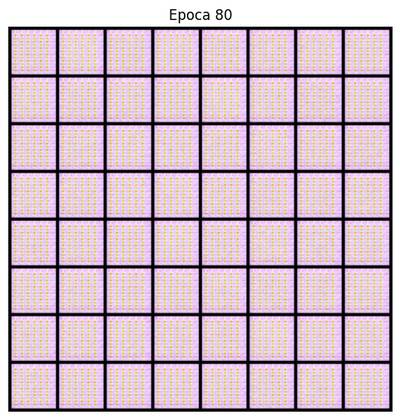

Epoch [80/100] | D_loss: 0.0420 | G_loss: 4.8489
Epoch [81/100] | D_loss: 0.0398 | G_loss: 4.6391
Epoch [82/100] | D_loss: 0.0145 | G_loss: 5.2871
Epoch [83/100] | D_loss: 0.0068 | G_loss: 5.4157
Epoch [84/100] | D_loss: 0.0488 | G_loss: 5.5519
Epoch [85/100] | D_loss: 0.2721 | G_loss: 4.6792
Epoch [86/100] | D_loss: 0.0210 | G_loss: 4.5248
Epoch [87/100] | D_loss: 0.0192 | G_loss: 4.8502
Epoch [88/100] | D_loss: 0.0116 | G_loss: 5.3124
Epoch [89/100] | D_loss: 0.0088 | G_loss: 5.6775


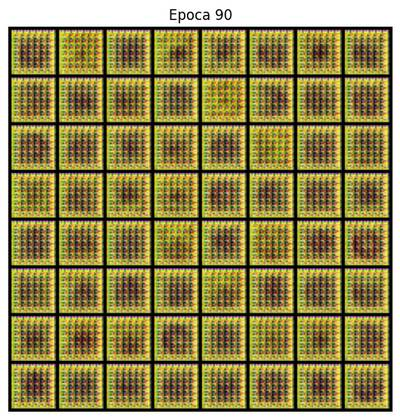

Epoch [90/100] | D_loss: 0.0087 | G_loss: 5.6158
Epoch [91/100] | D_loss: 0.1527 | G_loss: 5.2507
Epoch [92/100] | D_loss: 0.0357 | G_loss: 5.2124
Epoch [93/100] | D_loss: 1.2728 | G_loss: 5.2228
Epoch [94/100] | D_loss: 0.0318 | G_loss: 5.4849
Epoch [95/100] | D_loss: 0.0094 | G_loss: 6.0396
Epoch [96/100] | D_loss: 0.0135 | G_loss: 5.5613
Epoch [97/100] | D_loss: 0.0121 | G_loss: 5.3834
Epoch [98/100] | D_loss: 0.0118 | G_loss: 6.0508
Epoch [99/100] | D_loss: 0.0066 | G_loss: 5.5976


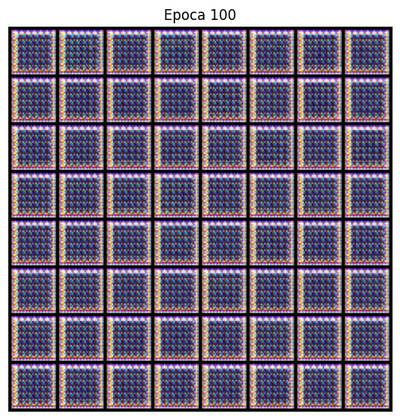

Epoch [100/100] | D_loss: 0.0296 | G_loss: 5.8115
→ FID: 442.3041

Seed 789


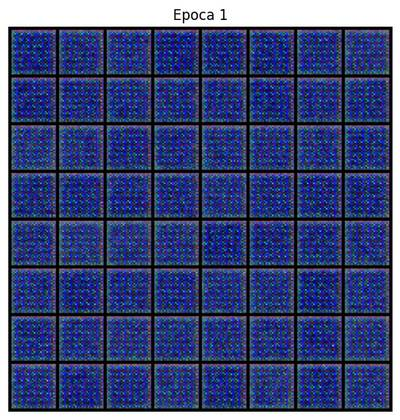

Epoch [1/100] | D_loss: 1.0057 | G_loss: 1.0744
Epoch [2/100] | D_loss: 0.9567 | G_loss: 1.5832
Epoch [3/100] | D_loss: 0.5671 | G_loss: 1.9999
Epoch [4/100] | D_loss: 0.9887 | G_loss: 1.2904
Epoch [5/100] | D_loss: 0.9099 | G_loss: 1.6964
Epoch [6/100] | D_loss: 0.8177 | G_loss: 1.5452
Epoch [7/100] | D_loss: 0.8248 | G_loss: 1.5601
Epoch [8/100] | D_loss: 1.0645 | G_loss: 1.3970
Epoch [9/100] | D_loss: 0.6001 | G_loss: 1.6788


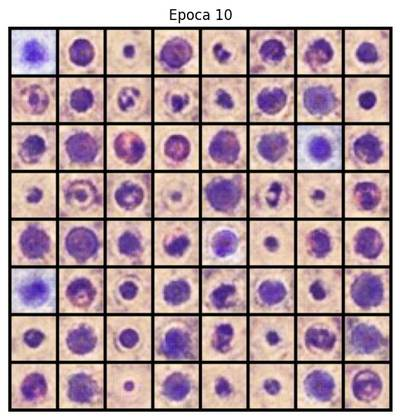

Epoch [10/100] | D_loss: 0.6396 | G_loss: 1.7495
Epoch [11/100] | D_loss: 0.9962 | G_loss: 1.9695
Epoch [12/100] | D_loss: 0.3797 | G_loss: 2.0639
Epoch [13/100] | D_loss: 0.4976 | G_loss: 2.4388
Epoch [14/100] | D_loss: 0.4068 | G_loss: 2.0496
Epoch [15/100] | D_loss: 0.3681 | G_loss: 2.8201
Epoch [16/100] | D_loss: 1.6530 | G_loss: 1.7474
Epoch [17/100] | D_loss: 0.4840 | G_loss: 2.3685
Epoch [18/100] | D_loss: 0.8701 | G_loss: 1.4831
Epoch [19/100] | D_loss: 0.6754 | G_loss: 2.5295


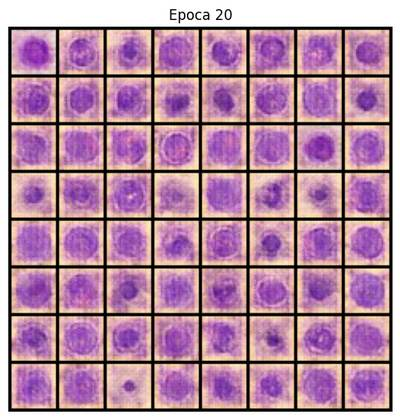

Epoch [20/100] | D_loss: 0.2562 | G_loss: 3.1147
Epoch [21/100] | D_loss: 0.1712 | G_loss: 3.6195
Epoch [22/100] | D_loss: 0.1384 | G_loss: 3.8210
Epoch [23/100] | D_loss: 0.0804 | G_loss: 4.3711
Epoch [24/100] | D_loss: 0.7031 | G_loss: 4.4360
Epoch [25/100] | D_loss: 0.0641 | G_loss: 3.6256
Epoch [26/100] | D_loss: 0.0384 | G_loss: 4.3947
Epoch [27/100] | D_loss: 0.1561 | G_loss: 2.8834
Epoch [28/100] | D_loss: 0.0443 | G_loss: 4.6909
Epoch [29/100] | D_loss: 0.0770 | G_loss: 4.0593


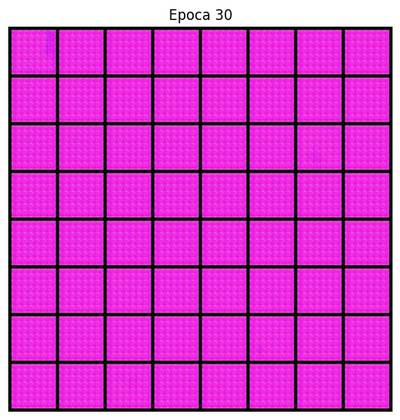

Epoch [30/100] | D_loss: 0.0583 | G_loss: 3.1459
Epoch [31/100] | D_loss: 0.3443 | G_loss: 4.7928
Epoch [32/100] | D_loss: 0.1114 | G_loss: 3.5229
Epoch [33/100] | D_loss: 0.1913 | G_loss: 4.1027
Epoch [34/100] | D_loss: 0.1274 | G_loss: 3.7968
Epoch [35/100] | D_loss: 0.2003 | G_loss: 2.3854
Epoch [36/100] | D_loss: 0.0699 | G_loss: 2.8430
Epoch [37/100] | D_loss: 0.0602 | G_loss: 3.2050
Epoch [38/100] | D_loss: 0.1503 | G_loss: 3.3575
Epoch [39/100] | D_loss: 0.0526 | G_loss: 3.6802


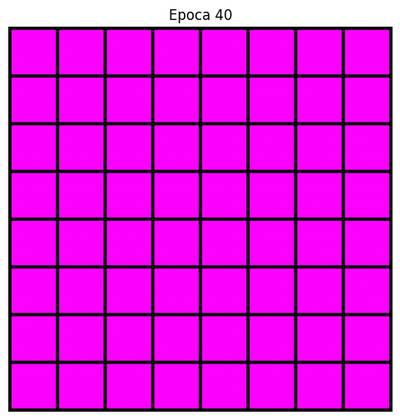

Epoch [40/100] | D_loss: 0.0407 | G_loss: 3.7425
Epoch [41/100] | D_loss: 0.1869 | G_loss: 3.9186
Epoch [42/100] | D_loss: 0.0232 | G_loss: 4.1557
Epoch [43/100] | D_loss: 0.0742 | G_loss: 4.6058
Epoch [44/100] | D_loss: 0.0277 | G_loss: 4.8773
Epoch [45/100] | D_loss: 0.0117 | G_loss: 7.9771
Epoch [46/100] | D_loss: 0.0184 | G_loss: 6.4952
Epoch [47/100] | D_loss: 0.0433 | G_loss: 4.5430
Epoch [48/100] | D_loss: 0.0589 | G_loss: 5.2573
Epoch [49/100] | D_loss: 0.0197 | G_loss: 4.9927


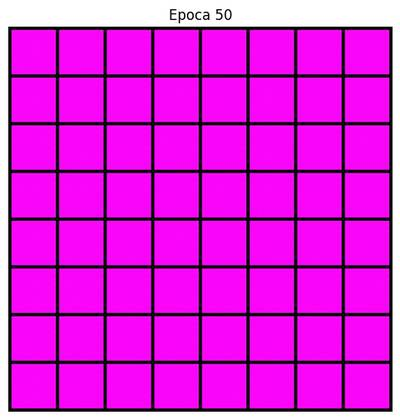

Epoch [50/100] | D_loss: 0.0526 | G_loss: 4.6930
Epoch [51/100] | D_loss: 0.0272 | G_loss: 4.9206
Epoch [52/100] | D_loss: 0.0185 | G_loss: 4.9393
Epoch [53/100] | D_loss: 0.2631 | G_loss: 5.6633
Epoch [54/100] | D_loss: 0.0103 | G_loss: 4.9880
Epoch [55/100] | D_loss: 0.0072 | G_loss: 5.3234
Epoch [56/100] | D_loss: 0.1179 | G_loss: 5.3462
Epoch [57/100] | D_loss: 0.0196 | G_loss: 5.5450
Epoch [58/100] | D_loss: 0.0050 | G_loss: 7.8592
Epoch [59/100] | D_loss: 0.0031 | G_loss: 7.0451


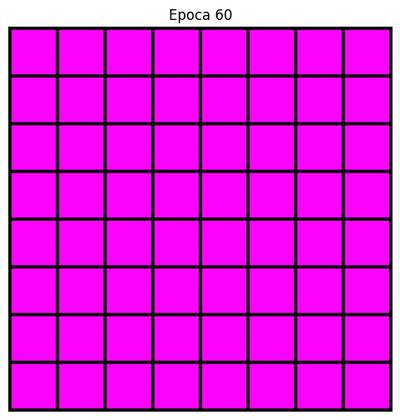

Epoch [60/100] | D_loss: 0.0043 | G_loss: 5.6458
Epoch [61/100] | D_loss: 0.0058 | G_loss: 5.8603
Epoch [62/100] | D_loss: 0.0073 | G_loss: 6.7266
Epoch [63/100] | D_loss: 0.0027 | G_loss: 8.0836
Epoch [64/100] | D_loss: 0.0020 | G_loss: 6.1391
Epoch [65/100] | D_loss: 0.0334 | G_loss: 6.4028
Epoch [66/100] | D_loss: 0.0023 | G_loss: 6.8505
Epoch [67/100] | D_loss: 0.0026 | G_loss: 6.2923
Epoch [68/100] | D_loss: 0.0053 | G_loss: 6.2872
Epoch [69/100] | D_loss: 0.0022 | G_loss: 6.3698


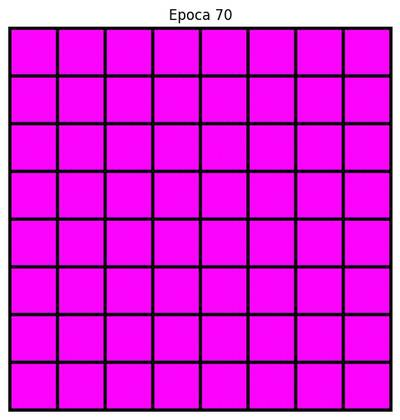

Epoch [70/100] | D_loss: 0.0018 | G_loss: 6.4023
Epoch [71/100] | D_loss: 0.0045 | G_loss: 6.4645
Epoch [72/100] | D_loss: 0.0295 | G_loss: 5.1327
Epoch [73/100] | D_loss: 0.0248 | G_loss: 4.9340
Epoch [74/100] | D_loss: 0.0112 | G_loss: 5.3122
Epoch [75/100] | D_loss: 0.0085 | G_loss: 5.6855
Epoch [76/100] | D_loss: 0.0102 | G_loss: 5.2867
Epoch [77/100] | D_loss: 0.0162 | G_loss: 5.2719
Epoch [78/100] | D_loss: 0.0274 | G_loss: 5.6781
Epoch [79/100] | D_loss: 0.1266 | G_loss: 3.6522


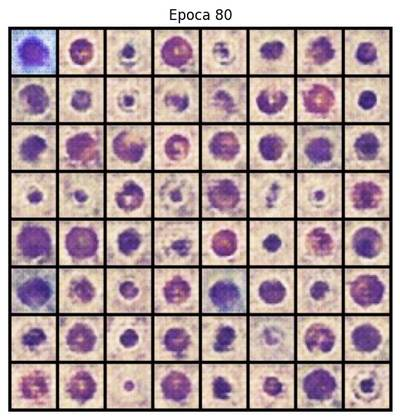

Epoch [80/100] | D_loss: 0.3005 | G_loss: 3.2559
Epoch [81/100] | D_loss: 1.5539 | G_loss: 3.0268
Epoch [82/100] | D_loss: 1.4970 | G_loss: 1.5947
Epoch [83/100] | D_loss: 0.4242 | G_loss: 3.8878
Epoch [84/100] | D_loss: 0.0164 | G_loss: 6.3258
Epoch [85/100] | D_loss: 0.3086 | G_loss: 3.9933
Epoch [86/100] | D_loss: 0.1051 | G_loss: 4.1646
Epoch [87/100] | D_loss: 0.7978 | G_loss: 2.6070
Epoch [88/100] | D_loss: 1.0951 | G_loss: 5.0621
Epoch [89/100] | D_loss: 0.4416 | G_loss: 2.0358


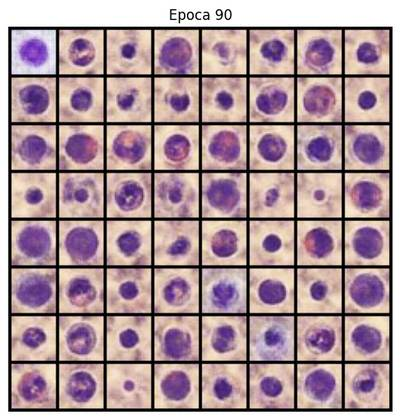

Epoch [90/100] | D_loss: 0.1094 | G_loss: 5.5430
Epoch [91/100] | D_loss: 0.6795 | G_loss: 2.6757
Epoch [92/100] | D_loss: 0.4980 | G_loss: 4.6389
Epoch [93/100] | D_loss: 0.3303 | G_loss: 4.0095
Epoch [94/100] | D_loss: 0.3245 | G_loss: 2.9836
Epoch [95/100] | D_loss: 1.0898 | G_loss: 2.4040
Epoch [96/100] | D_loss: 1.3462 | G_loss: 3.9087
Epoch [97/100] | D_loss: 0.1444 | G_loss: 3.1787
Epoch [98/100] | D_loss: 0.2034 | G_loss: 3.9871
Epoch [99/100] | D_loss: 1.0238 | G_loss: 5.1953


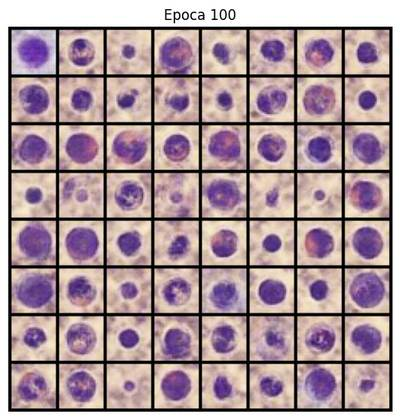

Epoch [100/100] | D_loss: 0.5354 | G_loss: 3.1141
→ FID: 189.1180

Seed 1010


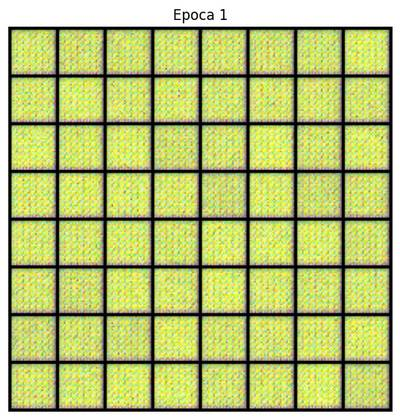

Epoch [1/100] | D_loss: 1.0278 | G_loss: 1.1232
Epoch [2/100] | D_loss: 1.0636 | G_loss: 1.1117
Epoch [3/100] | D_loss: 1.0671 | G_loss: 1.0646
Epoch [4/100] | D_loss: 0.8016 | G_loss: 1.3428
Epoch [5/100] | D_loss: 0.7309 | G_loss: 1.4175
Epoch [6/100] | D_loss: 0.9319 | G_loss: 1.7818
Epoch [7/100] | D_loss: 0.9589 | G_loss: 1.5220
Epoch [8/100] | D_loss: 0.8175 | G_loss: 1.6796
Epoch [9/100] | D_loss: 0.6124 | G_loss: 1.7203


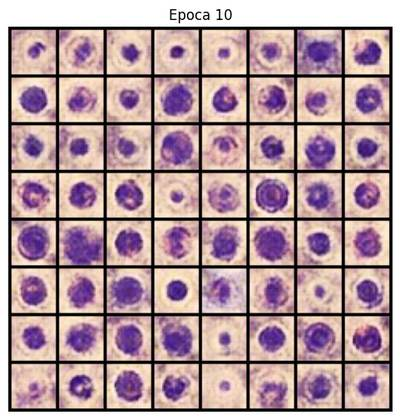

Epoch [10/100] | D_loss: 0.9666 | G_loss: 1.6448
Epoch [11/100] | D_loss: 0.6444 | G_loss: 1.7973
Epoch [12/100] | D_loss: 0.5201 | G_loss: 2.6651
Epoch [13/100] | D_loss: 0.4165 | G_loss: 2.5513
Epoch [14/100] | D_loss: 0.3094 | G_loss: 2.5110
Epoch [15/100] | D_loss: 1.1717 | G_loss: 1.2409
Epoch [16/100] | D_loss: 0.3320 | G_loss: 2.4324
Epoch [17/100] | D_loss: 0.5825 | G_loss: 2.1843
Epoch [18/100] | D_loss: 0.4913 | G_loss: 2.2206
Epoch [19/100] | D_loss: 0.6197 | G_loss: 2.2430


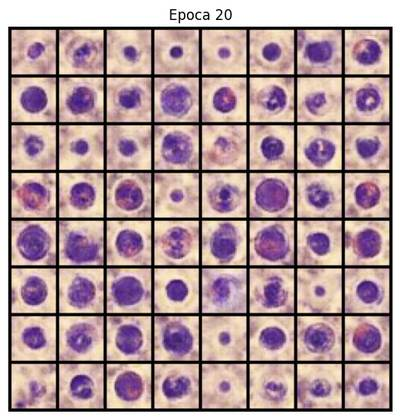

Epoch [20/100] | D_loss: 1.2035 | G_loss: 1.7935
Epoch [21/100] | D_loss: 0.5938 | G_loss: 2.0863
Epoch [22/100] | D_loss: 0.4827 | G_loss: 3.9227
Epoch [23/100] | D_loss: 0.5575 | G_loss: 2.1784
Epoch [24/100] | D_loss: 1.2911 | G_loss: 1.6593
Epoch [25/100] | D_loss: 0.3042 | G_loss: 2.6496
Epoch [26/100] | D_loss: 0.8877 | G_loss: 2.0507
Epoch [27/100] | D_loss: 0.5928 | G_loss: 2.2850
Epoch [28/100] | D_loss: 0.4222 | G_loss: 2.4592
Epoch [29/100] | D_loss: 0.2293 | G_loss: 2.9821


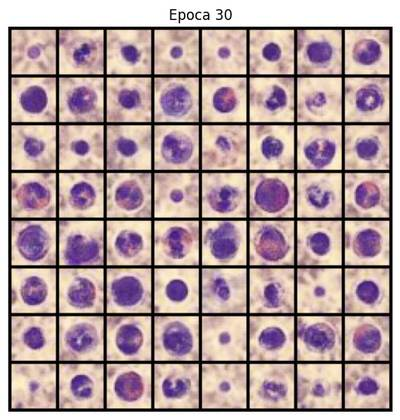

Epoch [30/100] | D_loss: 0.2531 | G_loss: 3.0314
Epoch [31/100] | D_loss: 0.3287 | G_loss: 3.4294
Epoch [32/100] | D_loss: 0.1637 | G_loss: 3.3401
Epoch [33/100] | D_loss: 0.1394 | G_loss: 3.0650
Epoch [34/100] | D_loss: 0.6451 | G_loss: 2.7696
Epoch [35/100] | D_loss: 0.4299 | G_loss: 3.0250
Epoch [36/100] | D_loss: 0.3018 | G_loss: 2.6431
Epoch [37/100] | D_loss: 0.3729 | G_loss: 2.7630
Epoch [38/100] | D_loss: 1.0014 | G_loss: 1.4786
Epoch [39/100] | D_loss: 0.2789 | G_loss: 2.5917


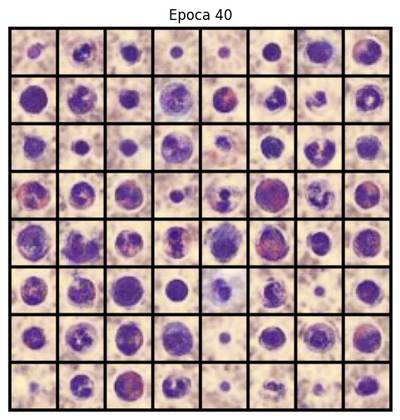

Epoch [40/100] | D_loss: 0.1347 | G_loss: 3.3791
Epoch [41/100] | D_loss: 0.4012 | G_loss: 3.2336
Epoch [42/100] | D_loss: 0.1737 | G_loss: 2.9710
Epoch [43/100] | D_loss: 0.1941 | G_loss: 3.0271
Epoch [44/100] | D_loss: 1.0582 | G_loss: 2.7618
Epoch [45/100] | D_loss: 0.1780 | G_loss: 3.4097
Epoch [46/100] | D_loss: 0.1177 | G_loss: 3.1215
Epoch [47/100] | D_loss: 0.1428 | G_loss: 3.9313
Epoch [48/100] | D_loss: 0.1912 | G_loss: 3.1481
Epoch [49/100] | D_loss: 0.1473 | G_loss: 3.5423


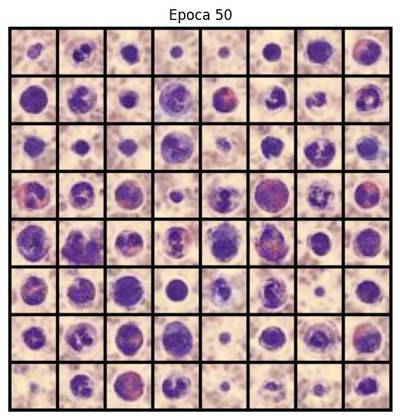

Epoch [50/100] | D_loss: 1.1279 | G_loss: 2.1582
Epoch [51/100] | D_loss: 0.0655 | G_loss: 3.5503
Epoch [52/100] | D_loss: 0.8555 | G_loss: 3.9394
Epoch [53/100] | D_loss: 0.0865 | G_loss: 3.9279
Epoch [54/100] | D_loss: 0.0512 | G_loss: 4.2275
Epoch [55/100] | D_loss: 0.1158 | G_loss: 5.5381
Epoch [56/100] | D_loss: 2.9279 | G_loss: 4.8071
Epoch [57/100] | D_loss: 0.0575 | G_loss: 4.3017
Epoch [58/100] | D_loss: 1.7318 | G_loss: 3.8878
Epoch [59/100] | D_loss: 0.0266 | G_loss: 4.6329


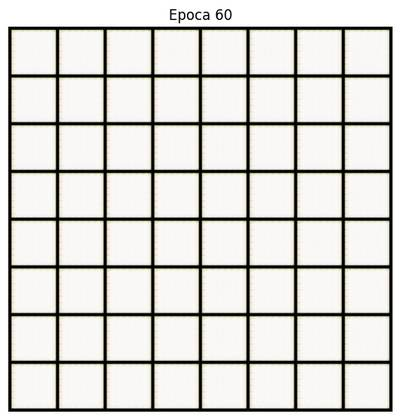

Epoch [60/100] | D_loss: 0.0709 | G_loss: 3.2983
Epoch [61/100] | D_loss: 0.0920 | G_loss: 4.1713
Epoch [62/100] | D_loss: 0.2696 | G_loss: 4.0276
Epoch [63/100] | D_loss: 0.0827 | G_loss: 3.6704
Epoch [64/100] | D_loss: 0.1093 | G_loss: 3.7941
Epoch [65/100] | D_loss: 0.1250 | G_loss: 2.9685
Epoch [66/100] | D_loss: 0.0663 | G_loss: 3.3326
Epoch [67/100] | D_loss: 0.0601 | G_loss: 3.3074
Epoch [68/100] | D_loss: 0.9481 | G_loss: 3.5433
Epoch [69/100] | D_loss: 0.2650 | G_loss: 3.5715


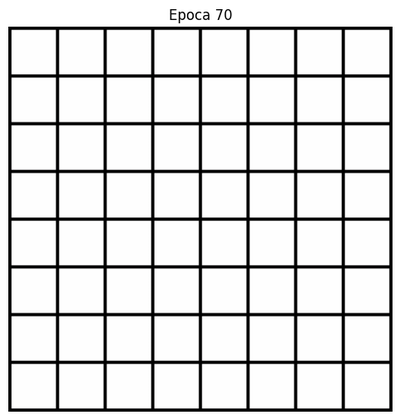

Epoch [70/100] | D_loss: 0.1964 | G_loss: 4.1162
Epoch [71/100] | D_loss: 0.0667 | G_loss: 3.6182
Epoch [72/100] | D_loss: 0.0256 | G_loss: 4.2531
Epoch [73/100] | D_loss: 0.0221 | G_loss: 4.4050
Epoch [74/100] | D_loss: 0.0258 | G_loss: 4.6133
Epoch [75/100] | D_loss: 0.0791 | G_loss: 4.9706
Epoch [76/100] | D_loss: 0.1398 | G_loss: 4.7656
Epoch [77/100] | D_loss: 0.0491 | G_loss: 4.4233
Epoch [78/100] | D_loss: 0.0239 | G_loss: 4.3768
Epoch [79/100] | D_loss: 0.0939 | G_loss: 4.7153


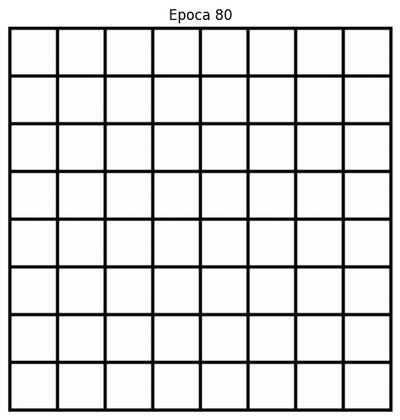

Epoch [80/100] | D_loss: 0.0136 | G_loss: 5.1454
Epoch [81/100] | D_loss: 0.0125 | G_loss: 6.1111
Epoch [82/100] | D_loss: 0.0152 | G_loss: 5.0725
Epoch [83/100] | D_loss: 0.0096 | G_loss: 5.3198
Epoch [84/100] | D_loss: 0.0175 | G_loss: 5.2829
Epoch [85/100] | D_loss: 0.1171 | G_loss: 5.3376
Epoch [86/100] | D_loss: 0.0068 | G_loss: 5.8497
Epoch [87/100] | D_loss: 0.0154 | G_loss: 5.6407
Epoch [88/100] | D_loss: 0.0452 | G_loss: 5.4628
Epoch [89/100] | D_loss: 0.0151 | G_loss: 5.8215


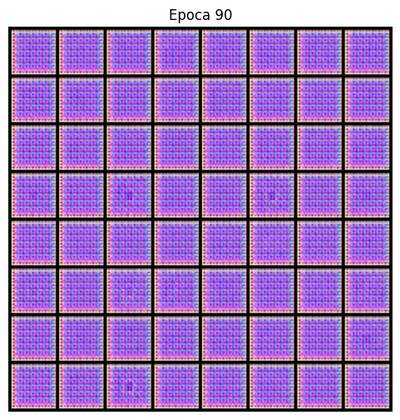

Epoch [90/100] | D_loss: 0.0784 | G_loss: 6.3712
Epoch [91/100] | D_loss: 1.6563 | G_loss: 5.4612
Epoch [92/100] | D_loss: 0.1377 | G_loss: 5.1850
Epoch [93/100] | D_loss: 0.0238 | G_loss: 5.8703
Epoch [94/100] | D_loss: 0.1864 | G_loss: 3.6055
Epoch [95/100] | D_loss: 0.0482 | G_loss: 5.0549
Epoch [96/100] | D_loss: 0.0169 | G_loss: 5.6271
Epoch [97/100] | D_loss: 1.5807 | G_loss: 4.8888
Epoch [98/100] | D_loss: 1.3479 | G_loss: 3.3834
Epoch [99/100] | D_loss: 0.1142 | G_loss: 4.2523


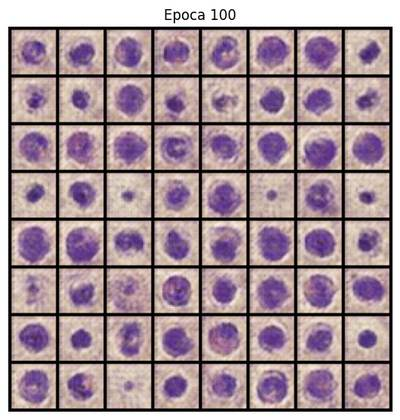

Epoch [100/100] | D_loss: 0.3882 | G_loss: 3.9628
→ FID: 255.0715

DCGAN Results over 5 seeds:
Mean FID = 246.3848 ± 103.1420
  Seed 42: 155.4289
  Seed 123: 190.0015
  Seed 456: 442.3041
  Seed 789: 189.1180
  Seed 1010: 255.0715


In [17]:
# Cell 6: Multiple‐seeds evaluation with best hyperparameters
seeds = [42, 123, 456, 789, 1010]
best_hp = best_dcgan['hparams']
fid_scores = []

for seed in seeds:
    print(f"\nSeed {seed}")
    set_seed(seed)
    # Re-sample real data with this seed
    real_run = sample_real_data(full_dataset, n_samples=10000, seed=seed).to(DEVICE)

    # Train
    netG, _ = train_dcgan(best_hp, dataloader, DEVICE)

    # Eval
    fake_run = generate_fake_data(netG, n_samples=len(real_run), latent_dim=best_hp['latent_dim'], device=DEVICE)
    fid = compute_fid(real_run, fake_run)
    fid_scores.append(fid)
    print(f"→ FID: {fid:.4f}")

mean_fid = np.mean(fid_scores)
std_fid = np.std(fid_scores)
print(f"\nDCGAN Results over {len(seeds)} seeds:")
print(f"Mean FID = {mean_fid:.4f} ± {std_fid:.4f}")
for s, f in zip(seeds, fid_scores):
    print(f"  Seed {s}: {f:.4f}")


<HOME>\AppData\Local\Temp\ipykernel_37116\3968338790.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  bestG.load_state_dict(torch.load('best_bloodmnist_dcgan.pth'))


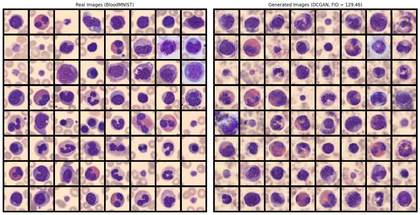

In [21]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Load best generator
bestG = Generator(best_hp['latent_dim'], best_hp['feature_g'], n_channels).to(DEVICE)
bestG.load_state_dict(torch.load('best_bloodmnist_dcgan.pth'))

# Generate 64 fake images
with torch.no_grad():
    sample_noise = torch.randn(64, best_hp['latent_dim'], 1, 1, device=DEVICE)
    gen_imgs = bestG(sample_noise).cpu()
    gen_imgs = (gen_imgs + 1) / 2  # Normalize to [0,1]

# Get 64 real images
real_imgs = sample_real_data(full_dataset, n_samples=64, seed=INITIAL_SEED).to(DEVICE)
real_imgs = (real_imgs + 1) / 2  # Normalize to [0,1]

# Create grids
grid_real = make_grid(real_imgs.cpu(), nrow=8)
grid_fake = make_grid(gen_imgs, nrow=8)

# Plot side by side
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Real Images (BloodMNIST)')
plt.axis('off')
plt.imshow(grid_real.permute(1, 2, 0))

plt.subplot(1, 2, 2)
plt.title(f'Generated Images (DCGAN, FID = {best_dcgan["fid"]:.2f})')
plt.axis('off')
plt.imshow(grid_fake.permute(1, 2, 0))

plt.tight_layout()
plt.show()
